In [66]:
import time
#Importing Libraries!
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#Utility function!
from utils.utils import *

# sklearn metrics
from sklearn.preprocessing import normalize, MinMaxScaler, LabelEncoder
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score

#some external boosting libraries!
from xgboost import XGBRegressor 
import lightgbm as lgb

#Sklearn machine learning libraries!
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import StackingRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor

In [3]:
def convert_log(arr):
    arr= np.log(abs(arr)+0.000001)
    return(arr)

In [75]:
def evaluate(predicted, actual):
    loss1 = mean_squared_error(actual,predicted)
    loss2 = mean_absolute_error(actual,predicted)
    loss3 = r2_score(actual,predicted)
    loss = [loss1,loss2,loss3]
    return(loss)

In [5]:
def plot_error(x, y1, y2):
    plt.figure(figsize=(15, 8))
    plt.plot(x, y1, label = "Predicted")
    plt.plot(x, y2, label = "Actual")
    plt.xlabel('Dates')
    plt.ylabel('Predicted versus Actual Values')
    plt.legend()
    return(plt)

In [6]:
def forecast(model, test_df):
    forecast = model.predict(test_df)
    return(forecast)

# Model 1 : XGBoost

In [7]:
#Model: XGBoost!
def model_xgb(X_train,y_train):
    xgb = XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
         colsample_bynode=1, colsample_bytree=0.3, gamma=0,
         importance_type='gain', learning_rate=0.1, max_delta_step=0,
         max_depth=4, min_child_weight=1, missing=None, n_estimators=100,
         n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
         reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
         silent=None, subsample=0.5, verbosity=1)   
    xgb.fit(X_train, y_train)
    return(xgb)

# Model 2: Light GBM

In [8]:
#Model: Light GBM model!
def model_lgbm(X_train,y_train,X_test,y_test):
    lgb_train = lgb.Dataset(X_train, y_train)
    lgb_eval = lgb.Dataset(X_test, y_test, reference=lgb_train)
    lightgbm_params = {'boosting_type': 'gbdt', 
         'colsample_bytree': 0.30, 
         'learning_rate': 0.08, 
         'n_estimators': 100, 
         'num_leaves': 2, 
         'reg_alpha': 0.5, 
         'reg_lambda': 0, 
         'subsample': 0.5,
          'max_depth':4}
    lgbm = lgb.train(lightgbm_params,lgb_train,num_boost_round=30,valid_sets=lgb_eval)
    return(lgbm)

# Model 3: Stacked Model

In [9]:
def StackedModel(X_train,y_train):
    xgb=XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
         colsample_bynode=1, colsample_bytree=0.3, gamma=0,
         importance_type='gain', learning_rate=0.1, max_delta_step=0,
         max_depth=4, min_child_weight=1, missing=None, n_estimators=100,
         n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
         reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
         silent=None, subsample=0.5, verbosity=1) 
    
    estimators = [
      ('rfr', RandomForestRegressor()), 
      ('etr', ExtraTreesRegressor()),
      ('ada', AdaBoostRegressor()),
      ('gbt', GradientBoostingRegressor())
       ]

    st= StackingRegressor(estimators=estimators,
                          final_estimator=xgb)
    st.fit(X_train,y_train)
    return(st)

# Loading the data!

In [29]:
tr_data = pd.read_csv('train_data_final.csv')

In [30]:
te_data = pd.read_csv('test_data_final.csv')

# Reducing the memory usage of the data!

In [31]:
def reduce_memory_usage(df):
    df.iloc[:,2:25]=df.iloc[:,2:25].astype('float32')
    df.iloc[:,25:46]=df.iloc[:,25:47].astype('int32')
    df.iloc[:,47:59]=df.iloc[:,47:59].astype('float32')
    df.iloc[:,59]=df.iloc[:,59].astype('int32')
    df.iloc[:,60]=df.iloc[:,60].astype('float32')
    df.iloc[:,61]=df.iloc[:,61].astype('int32')
    df.date= pd.to_datetime(df.date)
    return(df)

In [32]:
tr_data= reduce_memory_usage(train)
te_data = reduce_memory_usage(test)

# Preprocessing the data !

In [47]:
def preprocess(df,include_weather=False):
    y=convert_log(df.totalSales)
    date=df.date
    
    if include_weather == True: #Including weather!
        df = df.drop(['date','totalSales','province','city'],axis=1)
        
    else: # Excluding Weather!
        columns_to_drop=['date','province', 'city','totalSales',
                         'temperature_min','temperature_max','precipitation',
                         'winddirection', 'windspeed', 'peakgust', 'pressure',
                         ]
        df = df.drop(columns_to_drop,axis=1)
    
    return(df,y,date)    

# Citywise Sales Modeling!

In [73]:
def sales_modeling(tr_data,te_data,ModelName,include_weather):
    
    start_time = time.time()
    cities = tr_data['city'].str.lower().unique()
    all_metrics = []
    for city in cities:
        print("=====%s=====" %(city))
    
        # taking data on a city level!
        train = tr_data.loc[tr_data['city']==city]
        test = te_data.loc[te_data['city']==city]
    
        # Path to save model!
        filename = city.replace(' ','_')
        
        # Without weather!
        if ModelName=='xgb' and include_weather==False:
            path='models/sales/without_weather/xgb/'+filename+"_xgb.pkl"
            
        elif ModelName=='lgbm'  and include_weather==False:
            path='models/sales/without_weather/lgbm/'+filename+"_lgbm.pkl"
            
        elif ModelName=='st'  and include_weather==False:
            path='models/sales/without_weather/st/'+filename+"_st.pkl"
            
            
        # With Weather!
        elif  ModelName=='xgb' and include_weather==True:
             path='models/sales/weather/xgb/'+filename+"_xgb.pkl"
                
        elif  ModelName=='lgbm' and include_weather==True:
             path='models/sales/weather/lgbm/'+filename+"_lgbm.pkl"
                
        elif  ModelName=='st' and include_weather==True:
             path='models/sales/weather/st/'+filename+"_st.pkl"
                
        #Pre-processing
        X_train,y_train,dt= preprocess(train,include_weather)
        X_test,y_test,dt =  preprocess(test,include_weather)

        # forecast future
        if(X_test.shape[0]):
            
            if ModelName=='lgbm':
                reg = model_lgbm(X_train,y_train,X_test,y_test)  #For LGBM
            elif ModelName=='xgb':
                reg = model_xgb(X_train,y_train) 
            elif ModelName =='st':
                reg= StackedModel(X_train,y_train)
                
            # Saving the Model!    
            save_model(reg, path)
    
            # Forecasting on testing set!
            future = forecast(reg, X_test)
    
            # evaluate the model performance
            #List of three losses RMSE, MAE, R2!
            loss = evaluate(future,y_test) 
            loss= list(loss)
            
            # Adding City!
            loss.append(city)  
            
            #Adding time elapsed!
            end_time=round(time.time() - start_time, 2) 
            loss.append(end_time)
            all_metrics.append(loss)
            
            #Printing RMSE with the plot for checking!
            print("RMSE loss for %s = %.3f" % (city, loss[0]))
            
            # plot performance - predicted versus actual
            fig = plot_error(dt,future,y_test)
            fig.show()
        else:
            print("No records to test for %s city" %(city))
        
    return(all_metrics)

# Sales - Modeling without weather!

=====medicine hat=====
[06:20:37] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for medicine hat = 0.034


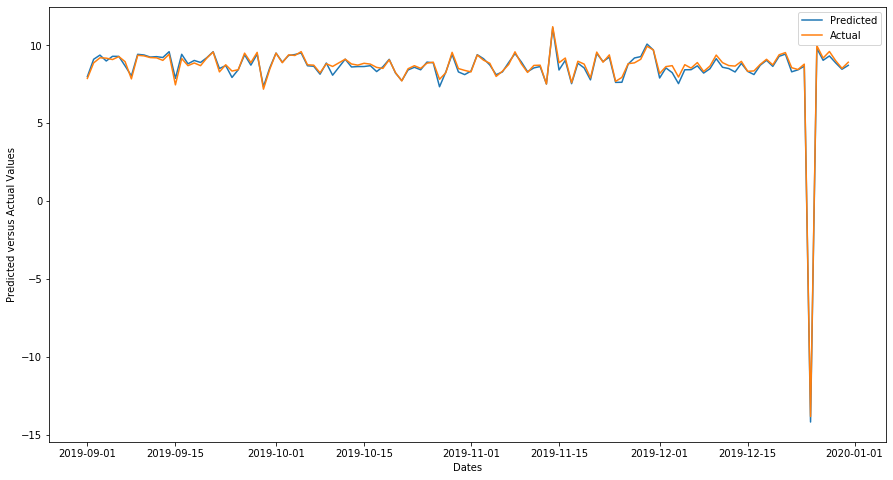

=====yorkton=====
[06:20:37] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for yorkton = 0.588


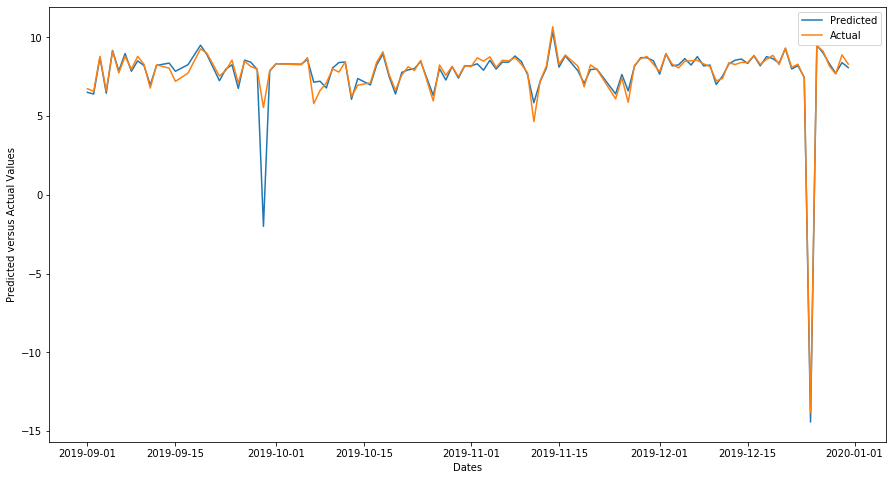

=====cranbrook=====
[06:20:38] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for cranbrook = 0.081


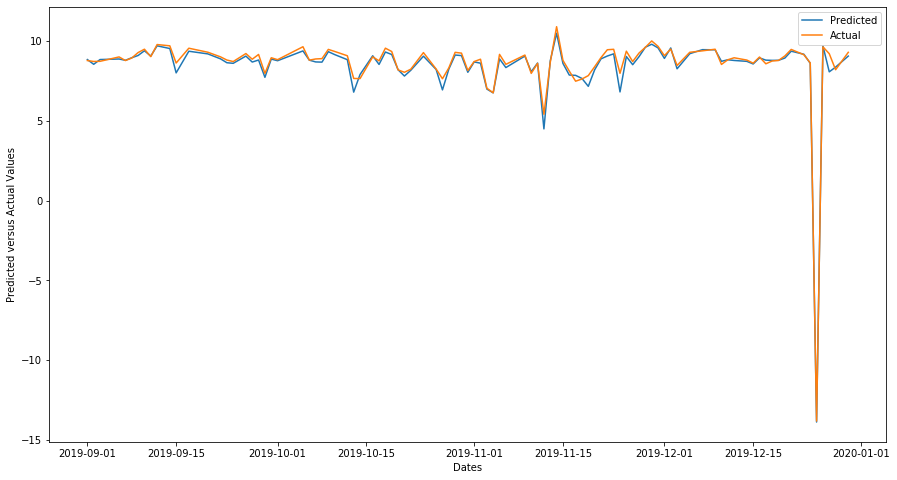

=====fort st john=====
[06:20:38] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for fort st john = 0.093


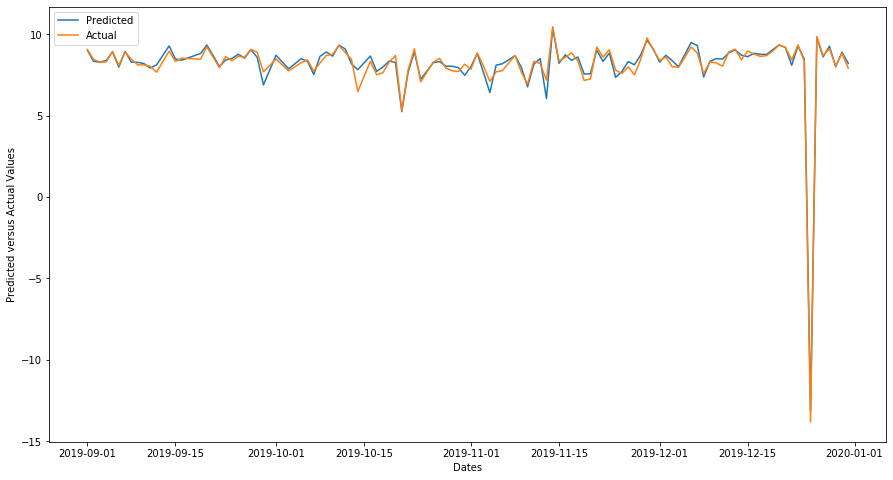

=====kamloops=====
[06:20:38] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kamloops = 0.017


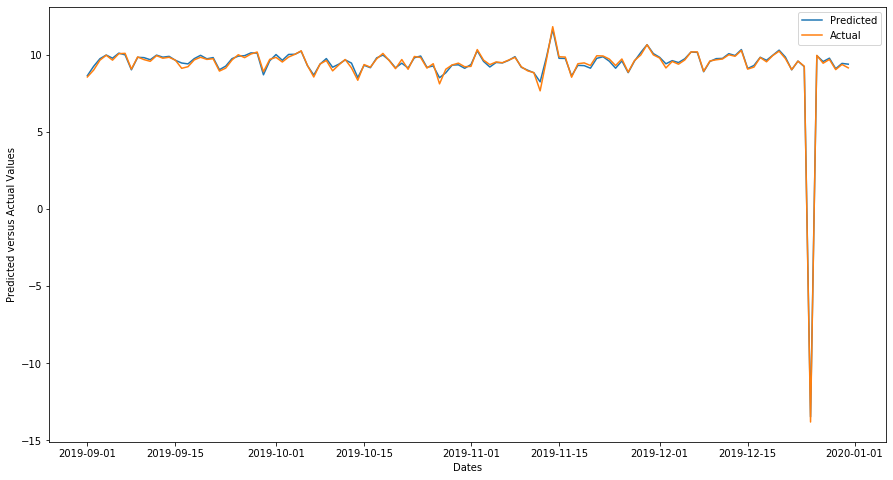

=====kelowna=====
[06:20:39] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kelowna = 0.068


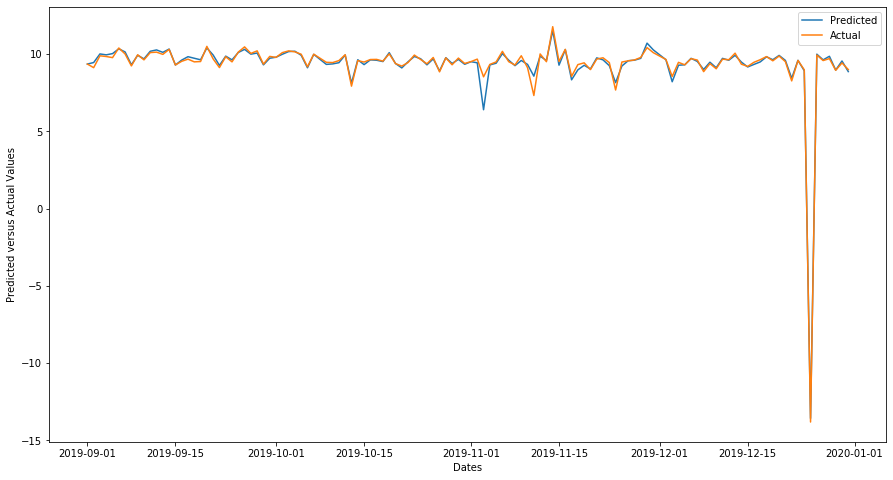

=====calgary=====
[06:20:39] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for calgary = 0.011


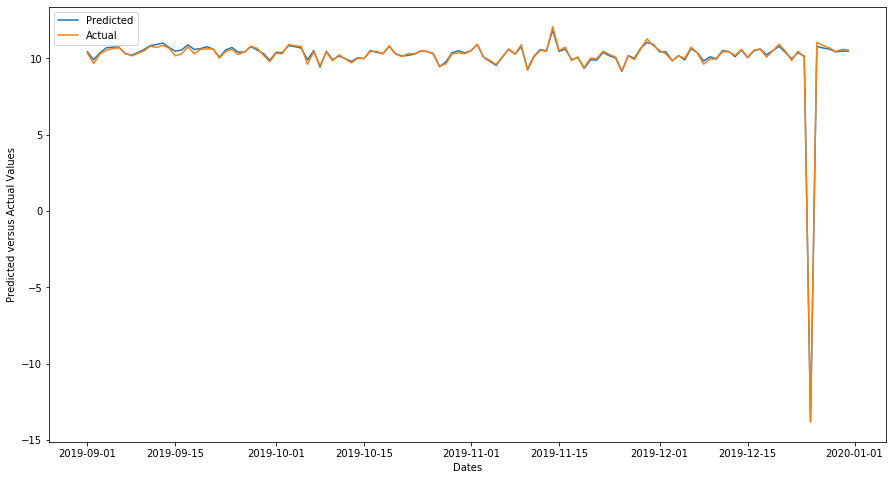

=====penticton=====
[06:20:39] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for penticton = 0.043


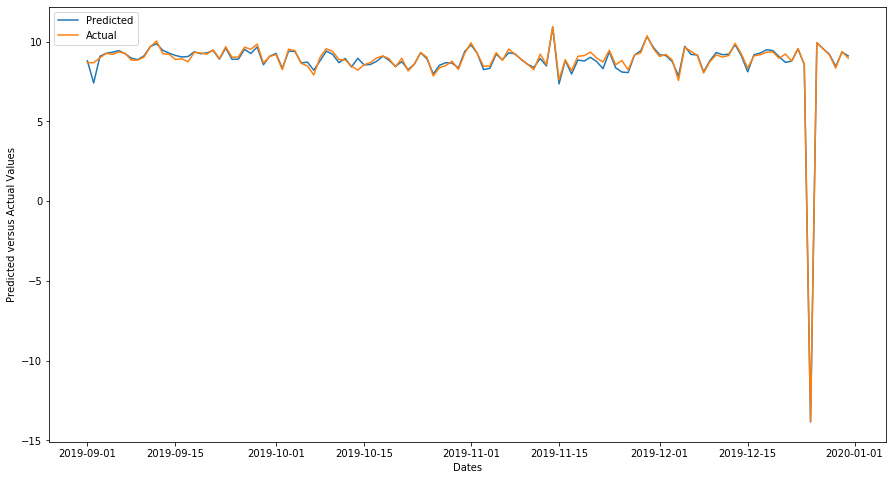

=====port alberni=====
[06:20:40] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for port alberni = 0.088


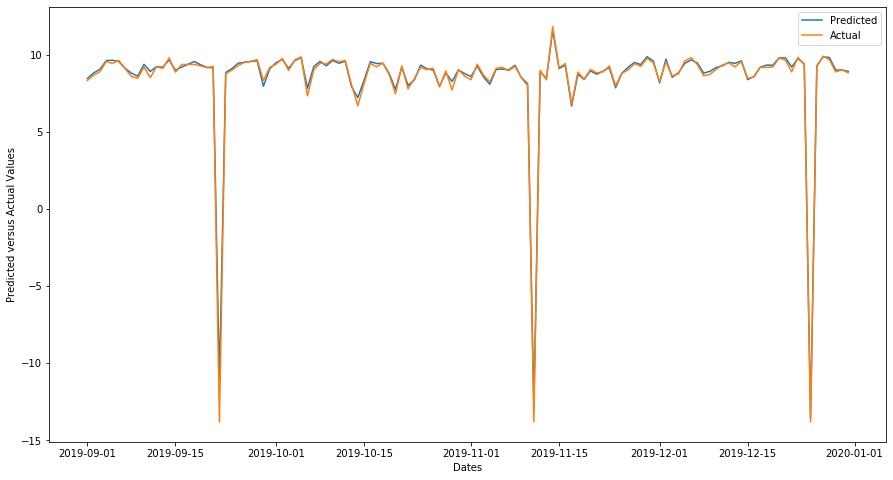

=====quesnel=====
[06:20:40] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for quesnel = 0.067


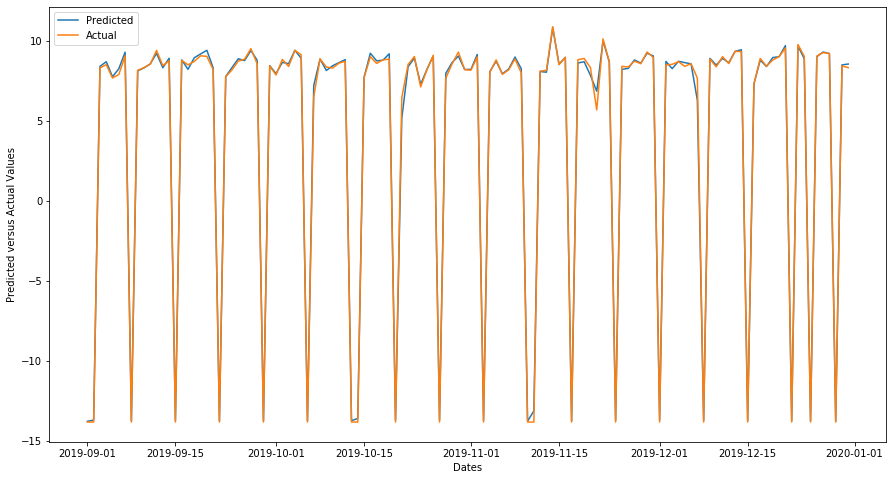

=====salmon arm=====
[06:20:40] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for salmon arm = 0.025


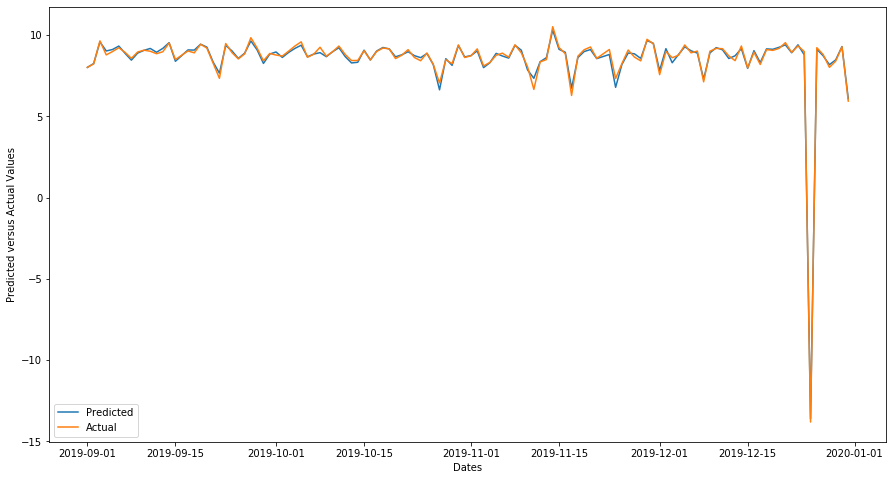

=====trail=====
[06:20:41] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for trail = 0.042


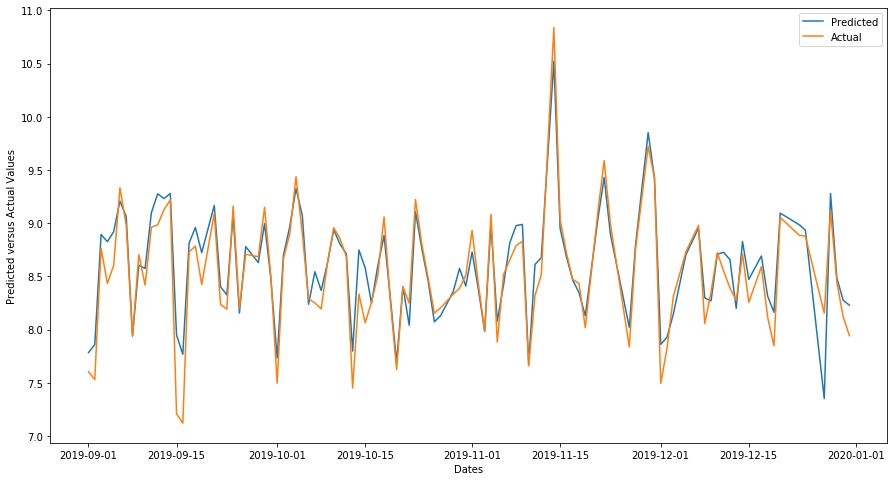

=====vernon=====
[06:20:41] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for vernon = 0.025


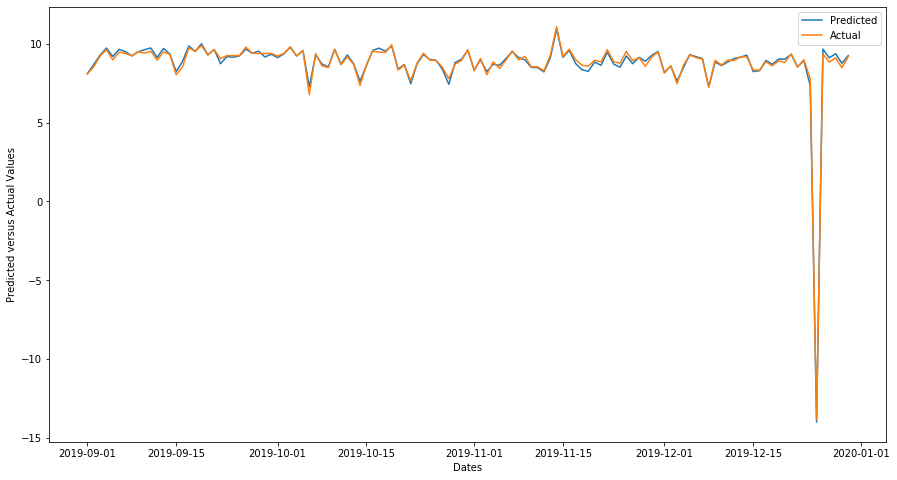

=====white rock=====
[06:20:42] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for white rock = 0.018


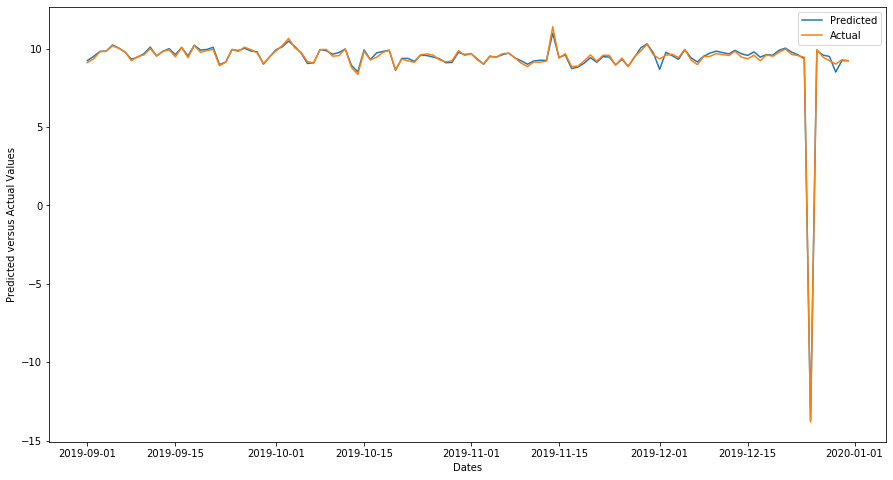

=====williams lake=====
[06:20:42] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for williams lake = 0.028


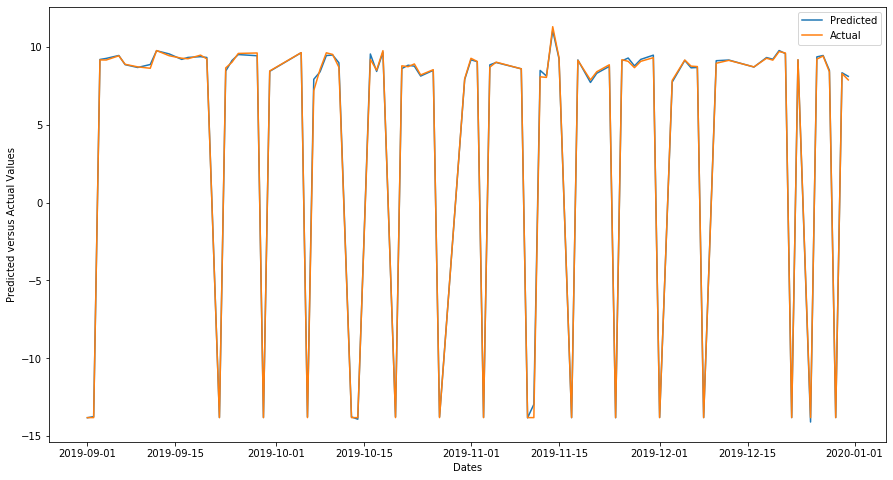

=====regina=====
[06:20:42] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for regina = 0.032


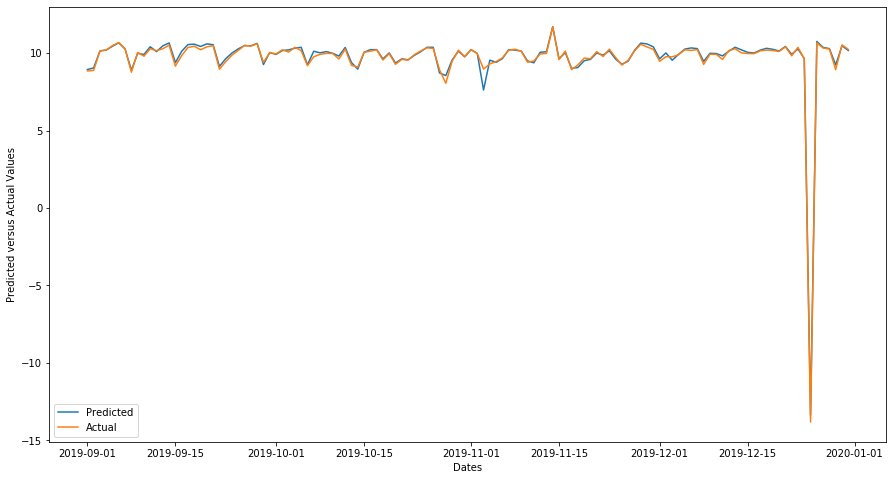

=====saskatoon=====
[06:20:43] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for saskatoon = 0.021


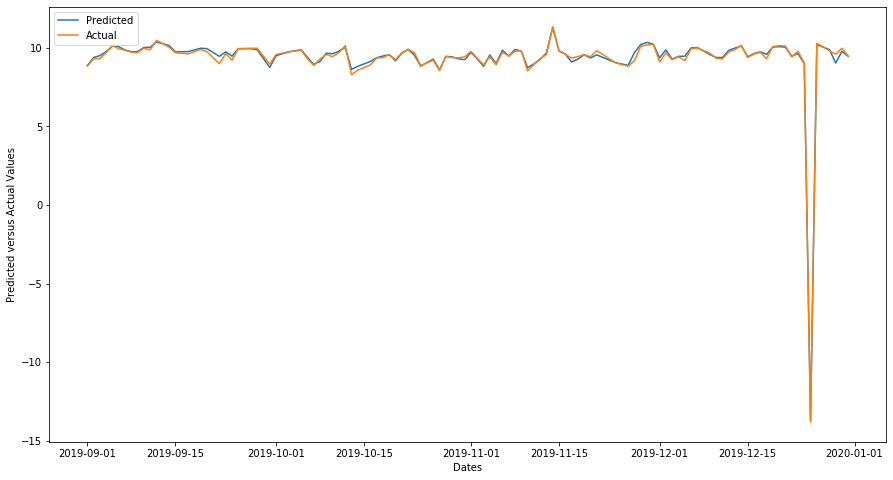

=====swift current=====
[06:20:43] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for swift current = 0.093


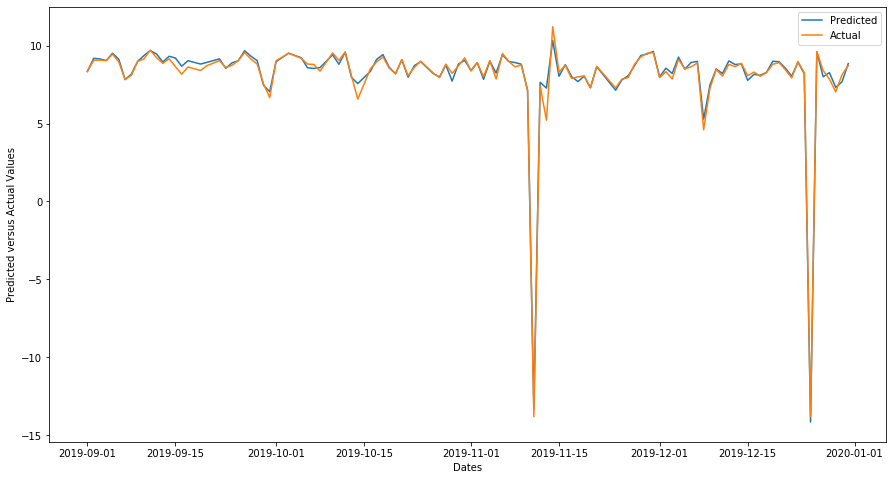

=====wainwright=====
[06:20:43] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for wainwright = 0.057


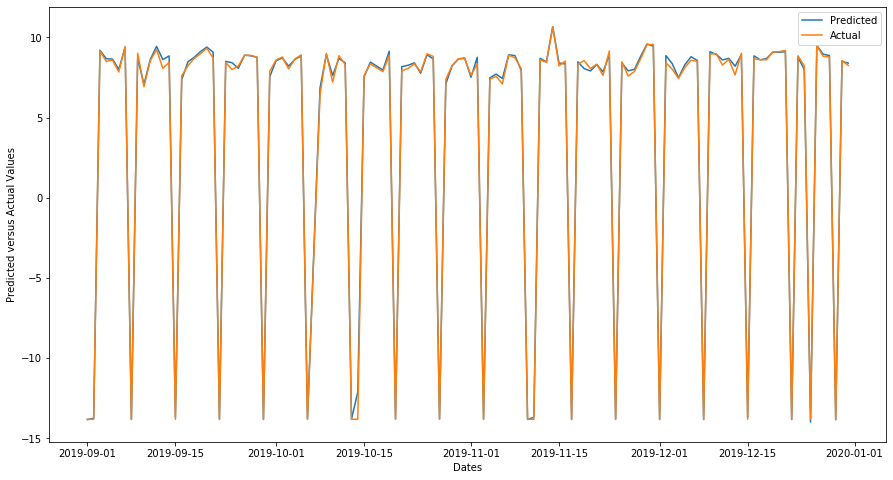

=====stettler=====
[06:20:44] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for stettler = 0.024


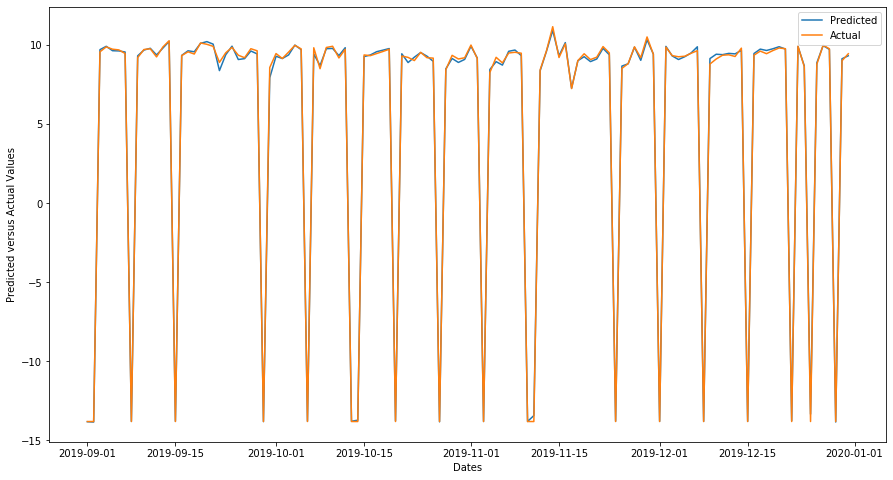

=====nelson=====
No records to test for nelson city
=====edmonton=====
[06:20:44] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for edmonton = 0.047


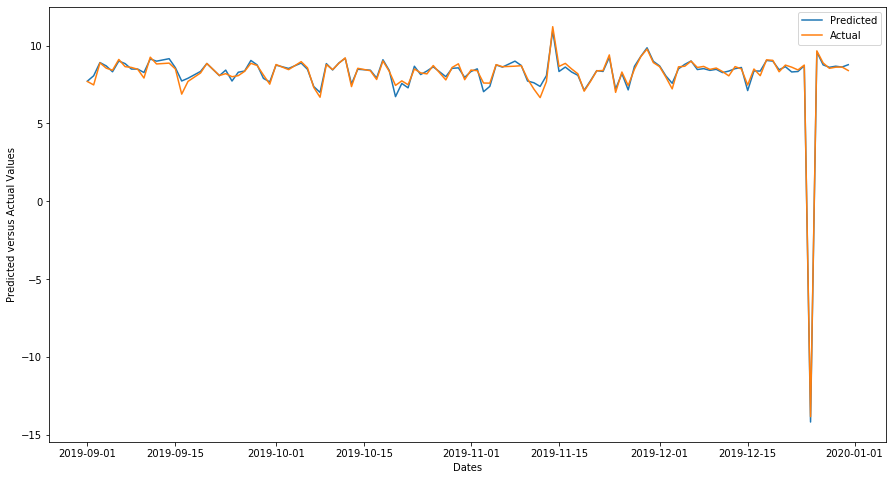

=====olds=====
[06:20:44] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for olds = 0.068


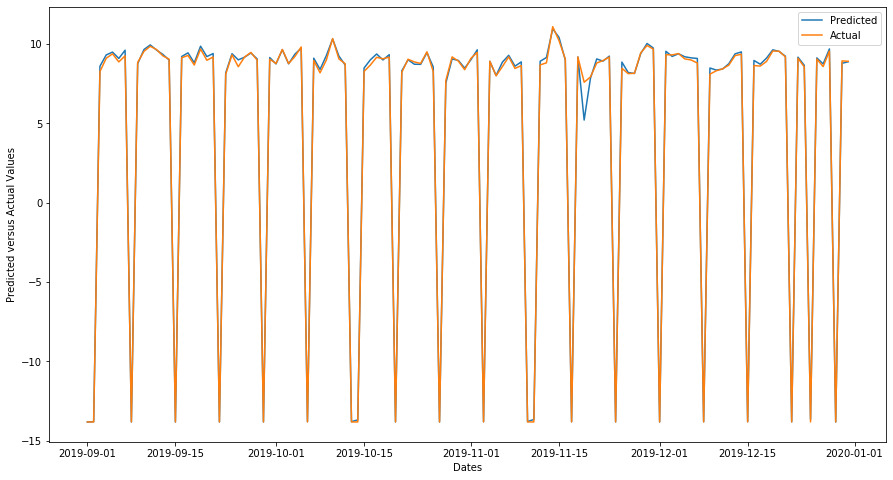

=====red deer=====
[06:20:45] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for red deer = 0.107


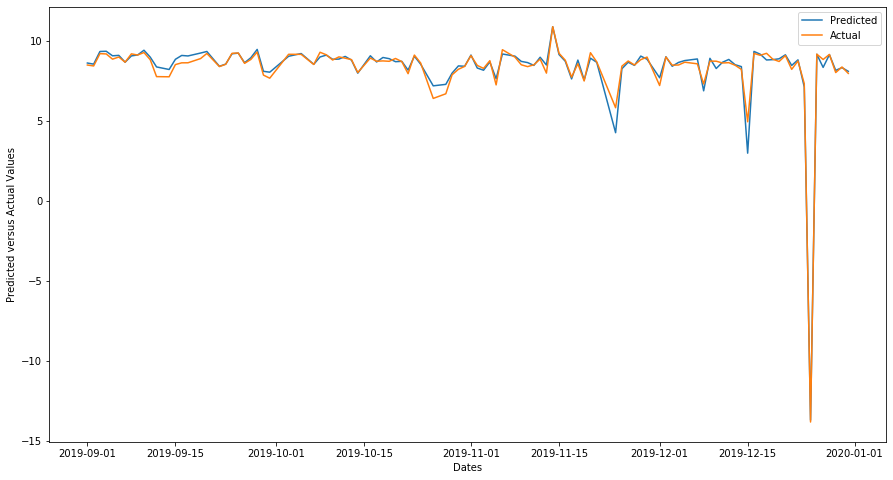

=====camrose=====
[06:20:45] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for camrose = 0.072


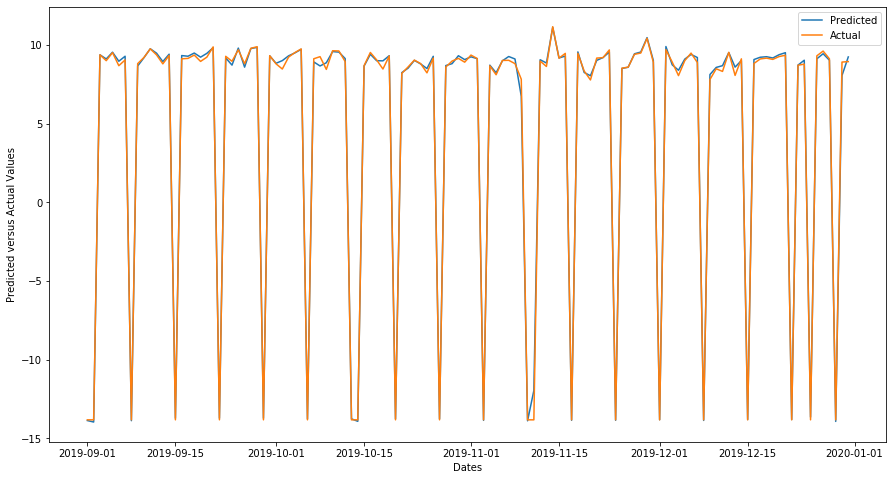

=====lethbridge=====
[06:20:45] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for lethbridge = 0.076


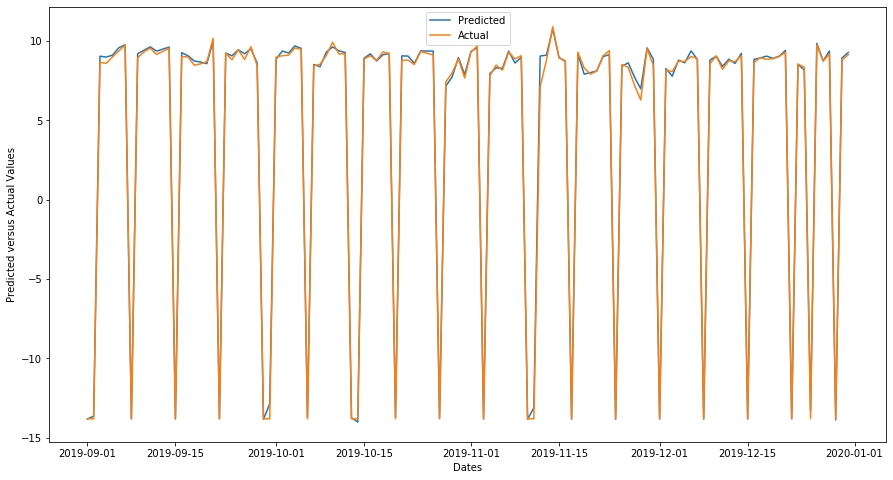

=====terrace=====
[06:20:46] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for terrace = 0.082


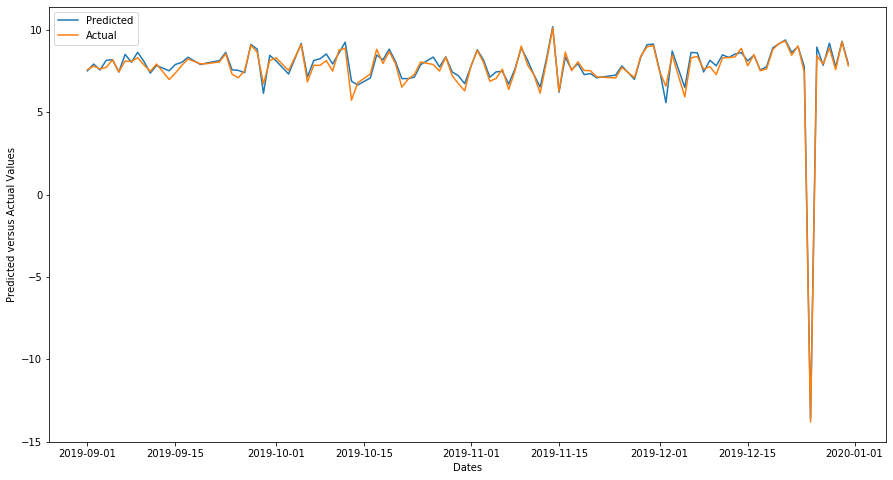

In [79]:
XGB=sales_modeling(tr_data,te_data,'xgb',False)

=====medicine hat=====
RMSE loss for medicine hat = 0.100


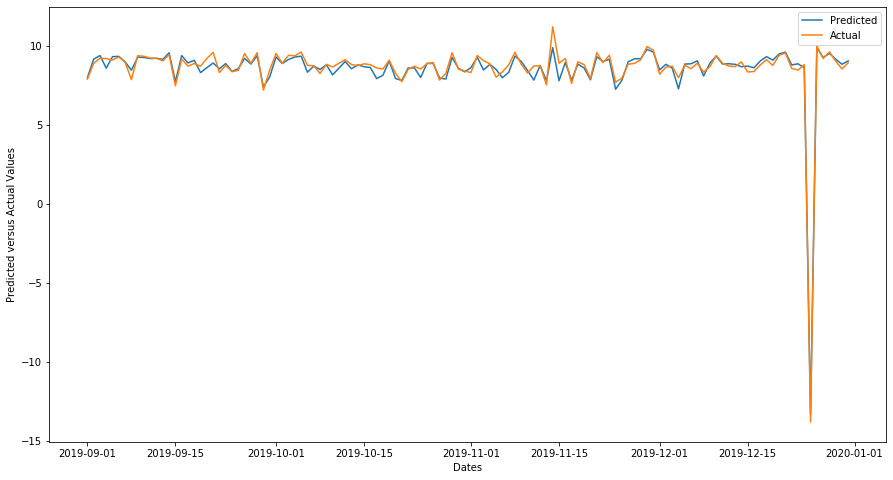

=====yorkton=====
RMSE loss for yorkton = 2.717


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



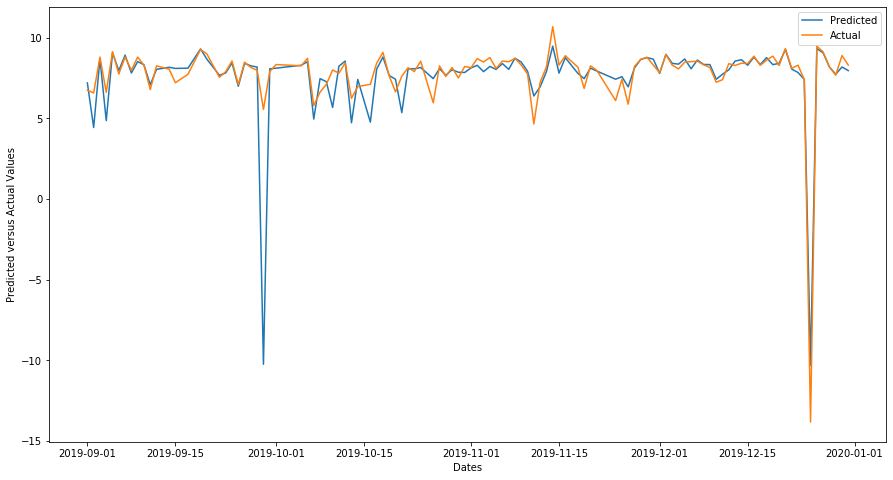

=====cranbrook=====
RMSE loss for cranbrook = 0.123


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



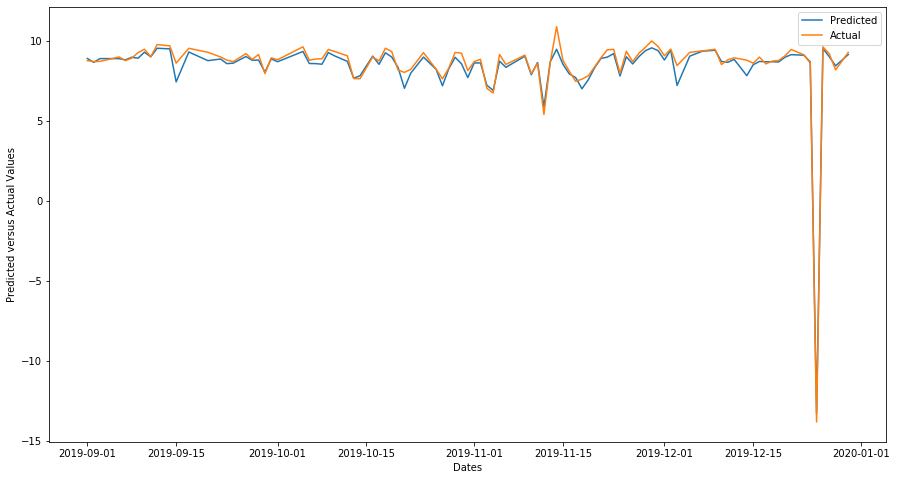

=====fort st john=====
RMSE loss for fort st john = 0.228


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



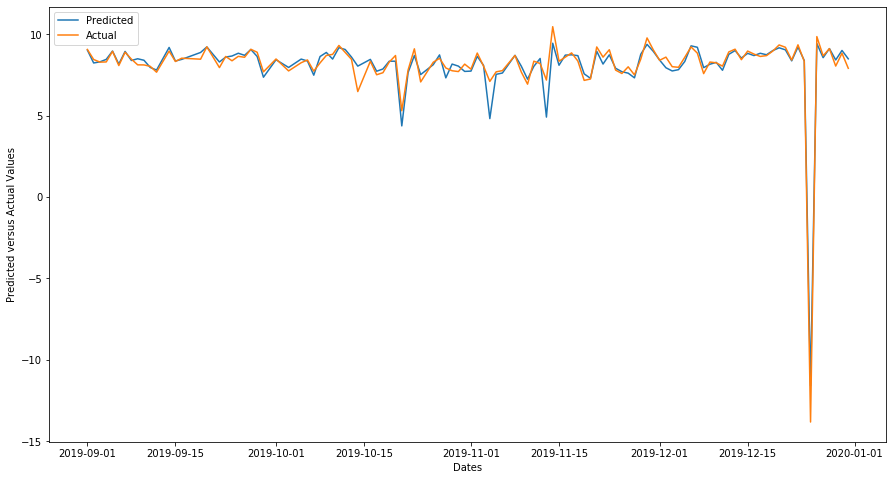

=====kamloops=====
RMSE loss for kamloops = 0.265


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



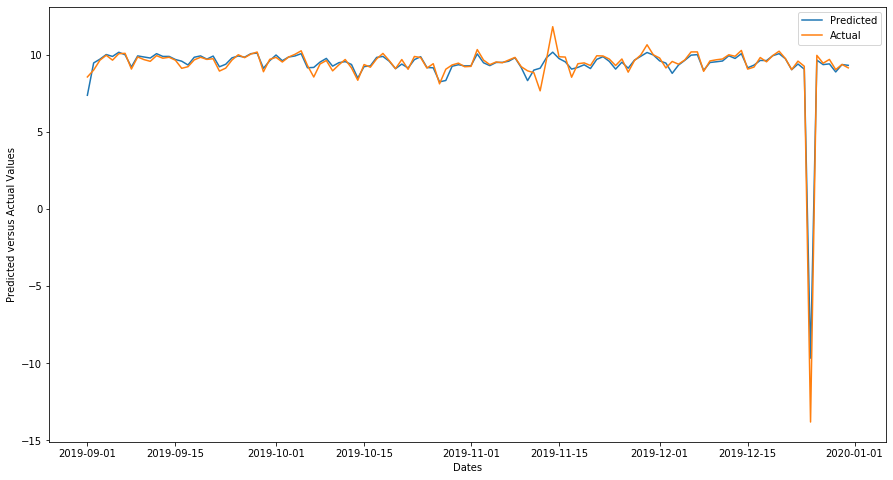

=====kelowna=====
RMSE loss for kelowna = 0.210


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



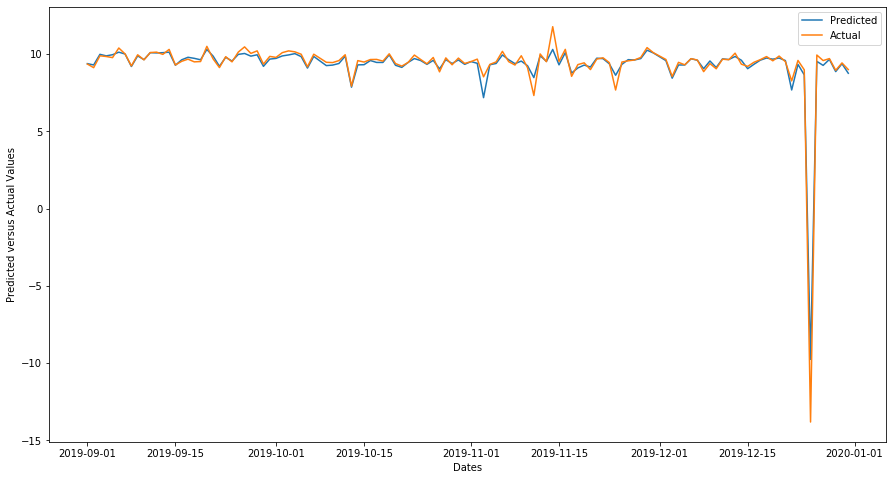

=====calgary=====
RMSE loss for calgary = 0.233


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



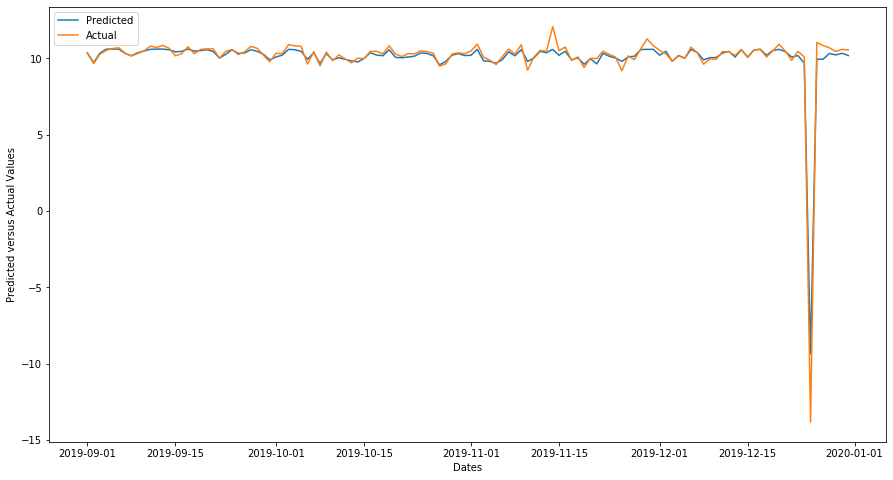

=====penticton=====
RMSE loss for penticton = 0.475


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



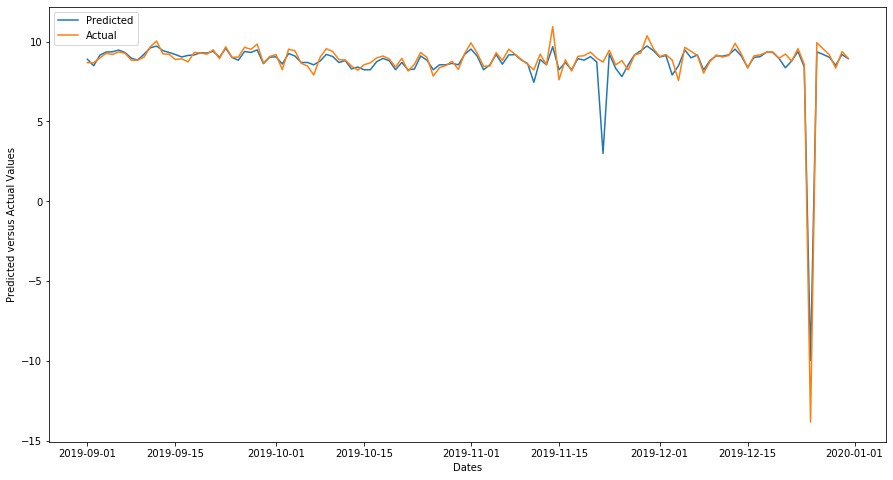

=====port alberni=====
RMSE loss for port alberni = 0.113


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



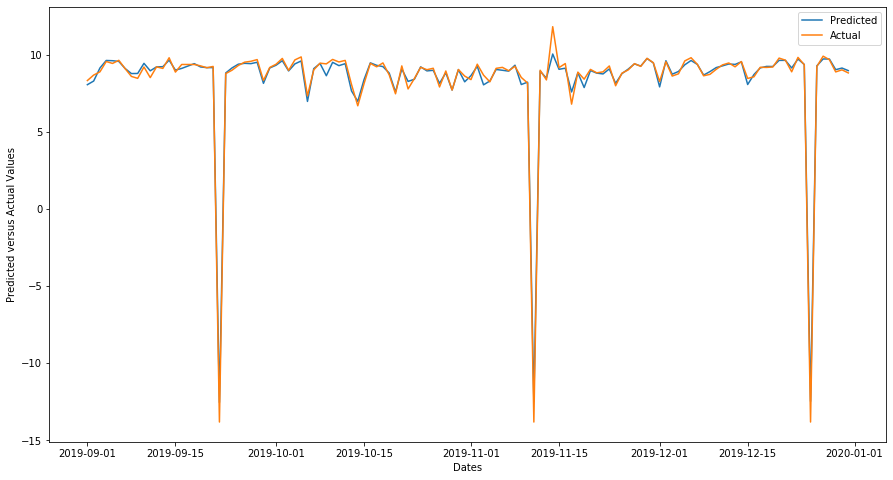

=====quesnel=====
RMSE loss for quesnel = 0.164


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



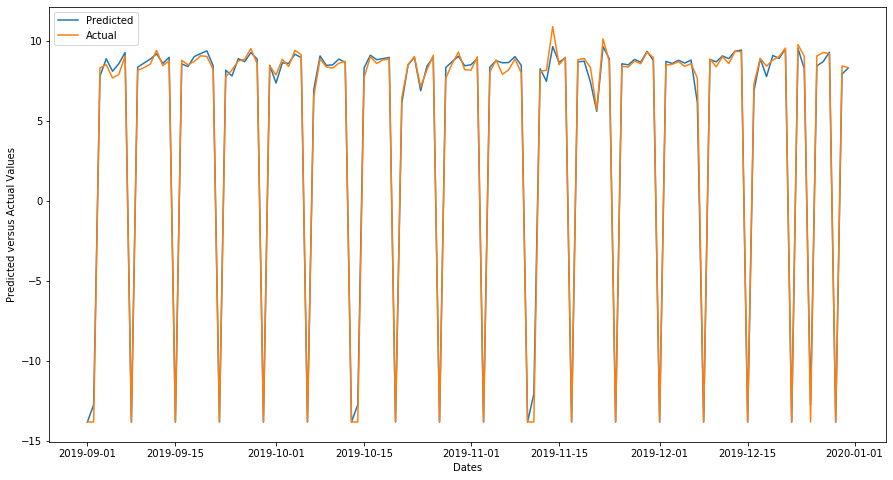

=====salmon arm=====
RMSE loss for salmon arm = 0.382


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



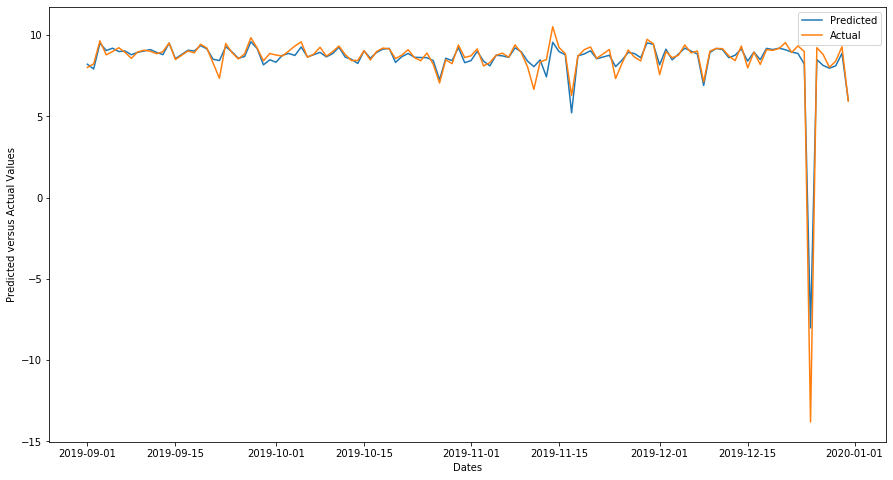

=====trail=====
RMSE loss for trail = 0.081


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



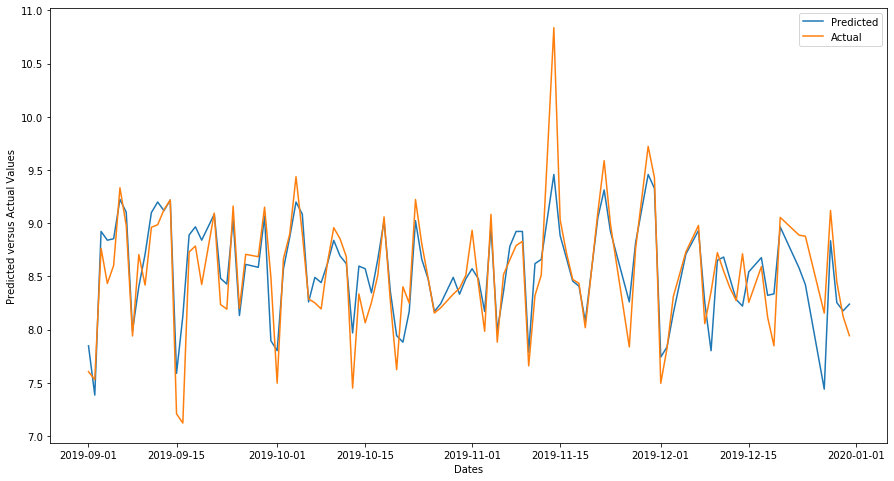

=====vernon=====
RMSE loss for vernon = 0.097


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



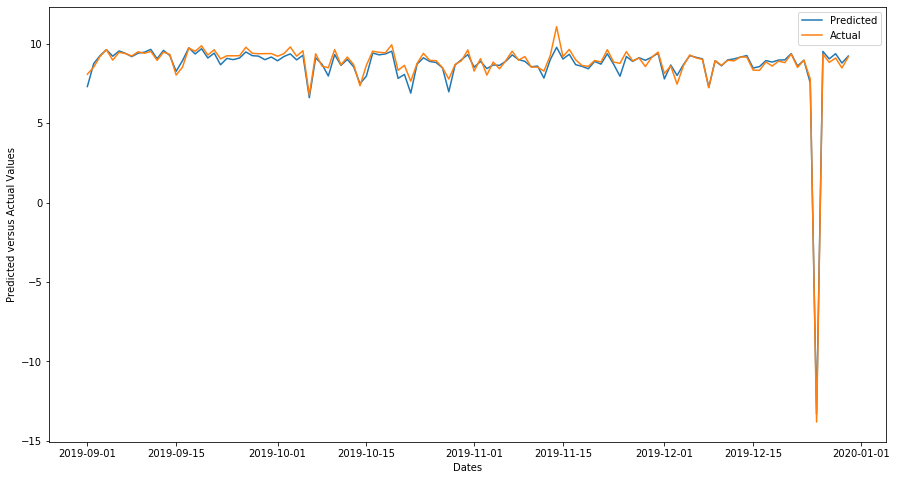

=====white rock=====
RMSE loss for white rock = 0.138


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



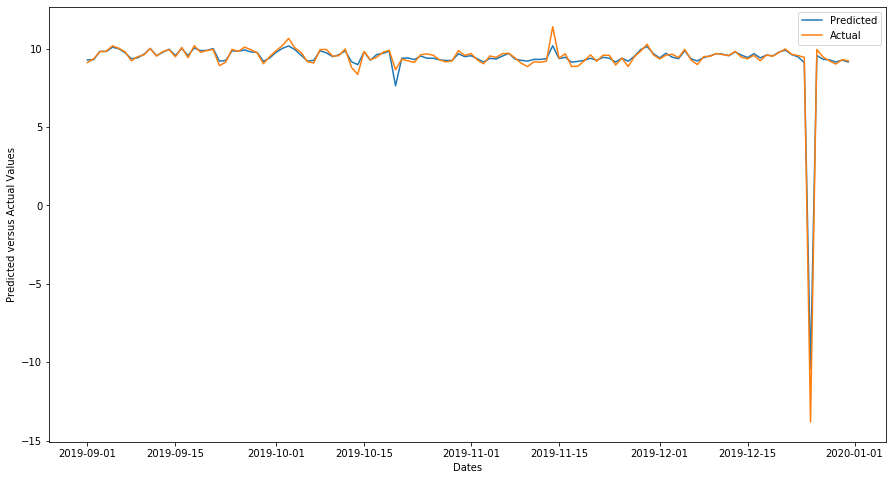

=====williams lake=====
RMSE loss for williams lake = 0.194


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



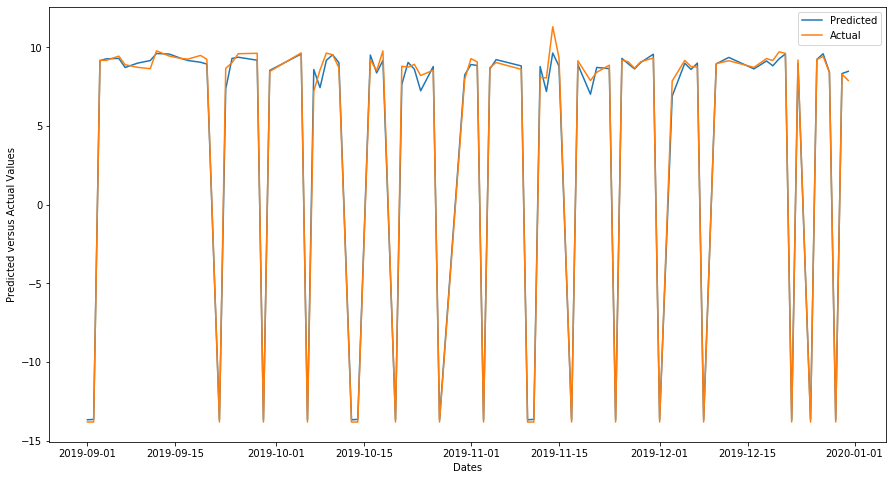

=====regina=====
RMSE loss for regina = 2.073


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



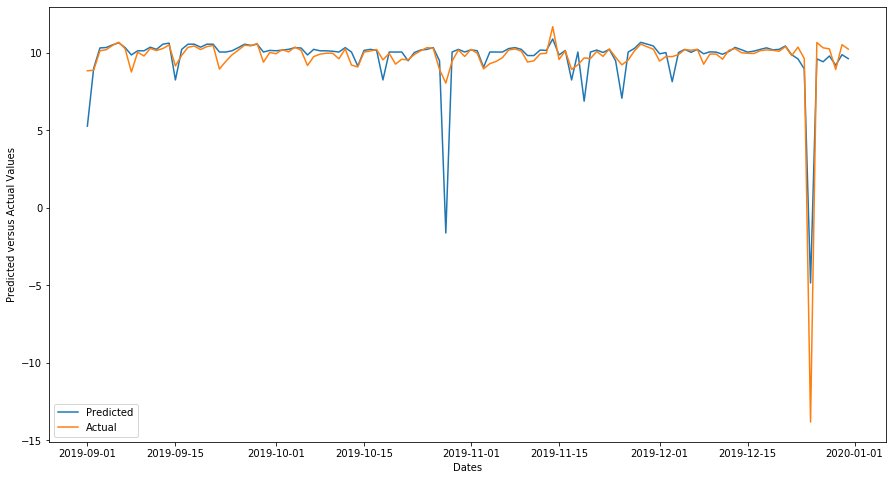

=====saskatoon=====
RMSE loss for saskatoon = 0.619


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



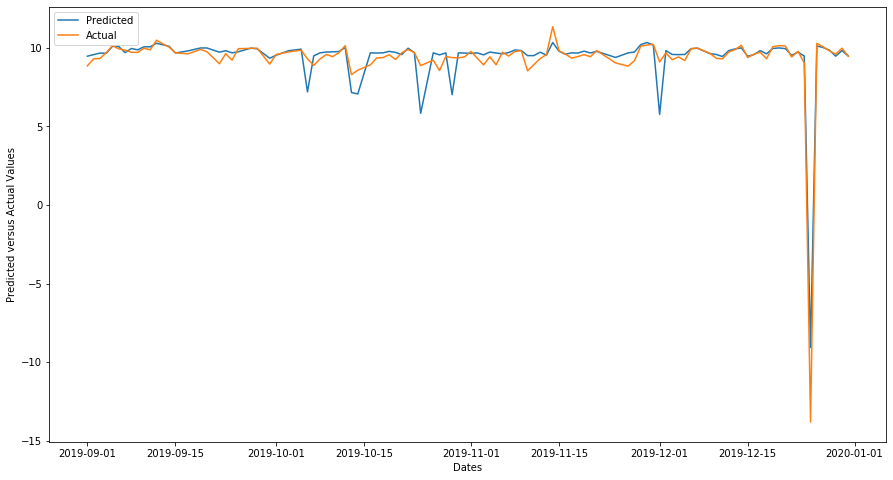

=====swift current=====
RMSE loss for swift current = 0.148


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



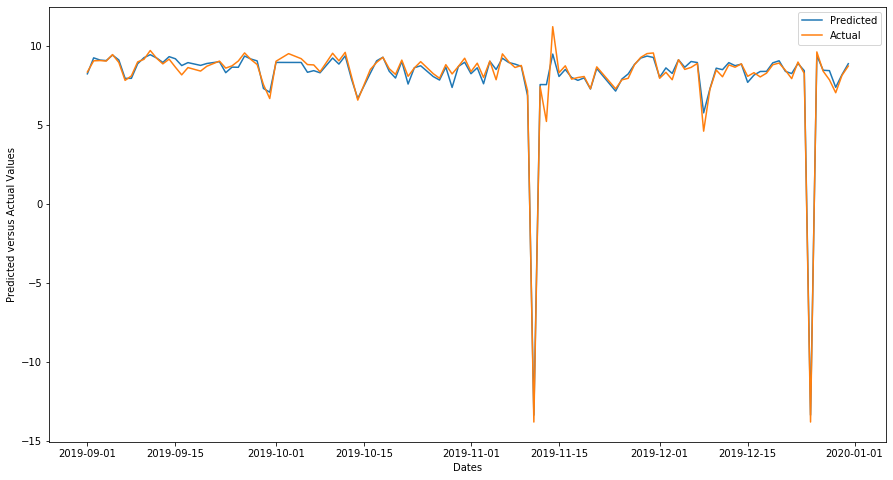

=====wainwright=====
RMSE loss for wainwright = 0.254


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



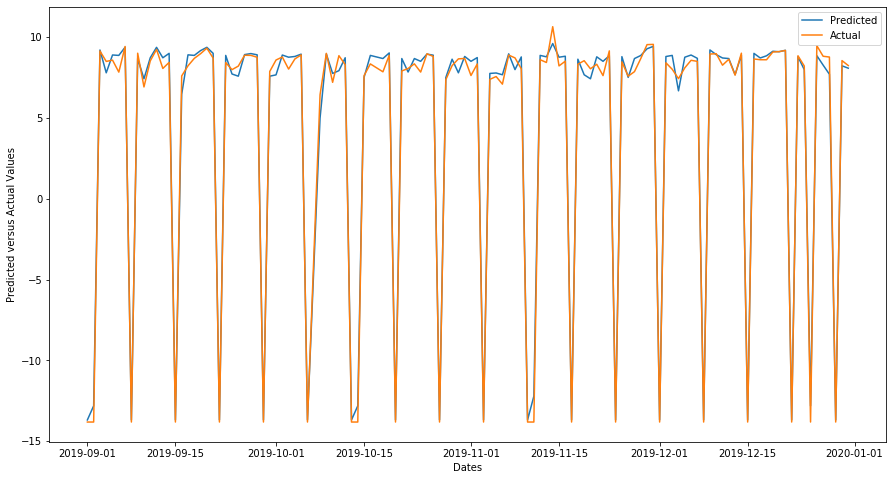

=====stettler=====
RMSE loss for stettler = 0.108


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



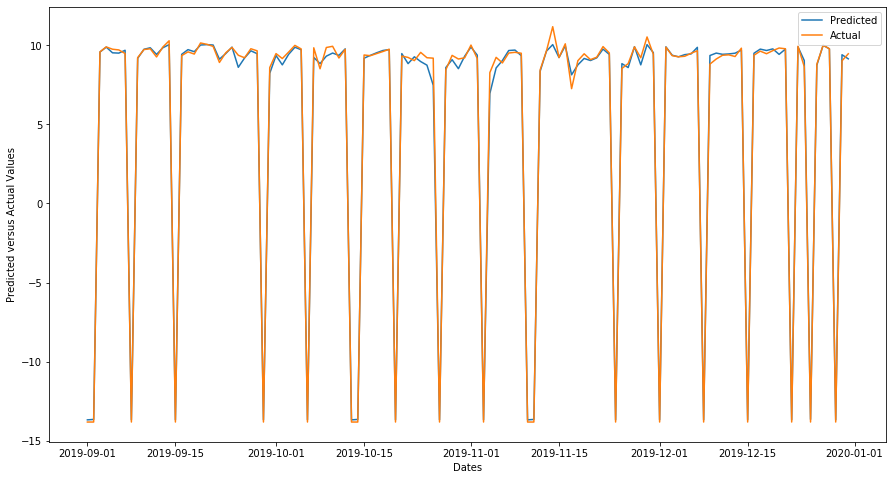

=====nelson=====
No records to test for nelson city
=====edmonton=====
RMSE loss for edmonton = 0.645


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



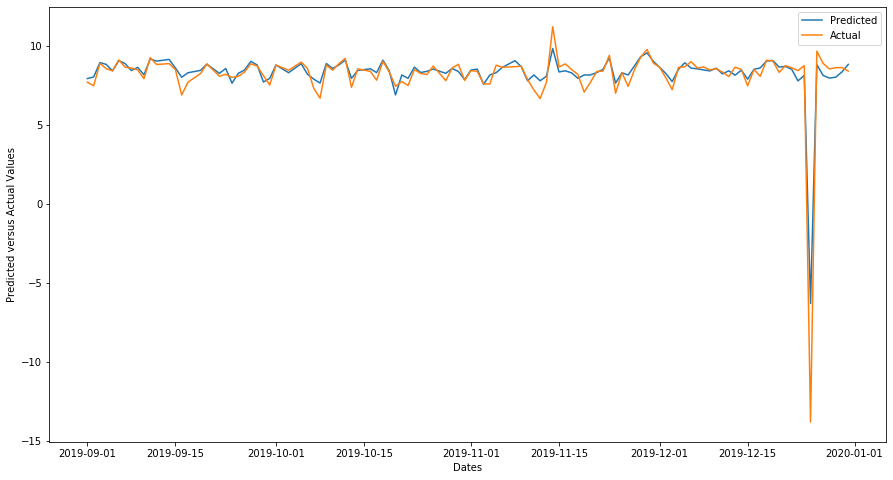

=====olds=====
RMSE loss for olds = 0.269


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



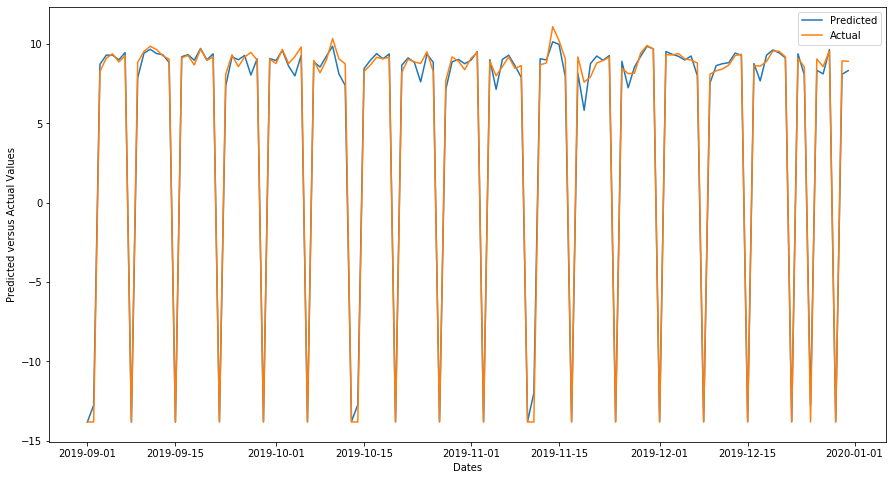

=====red deer=====
RMSE loss for red deer = 8.041


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



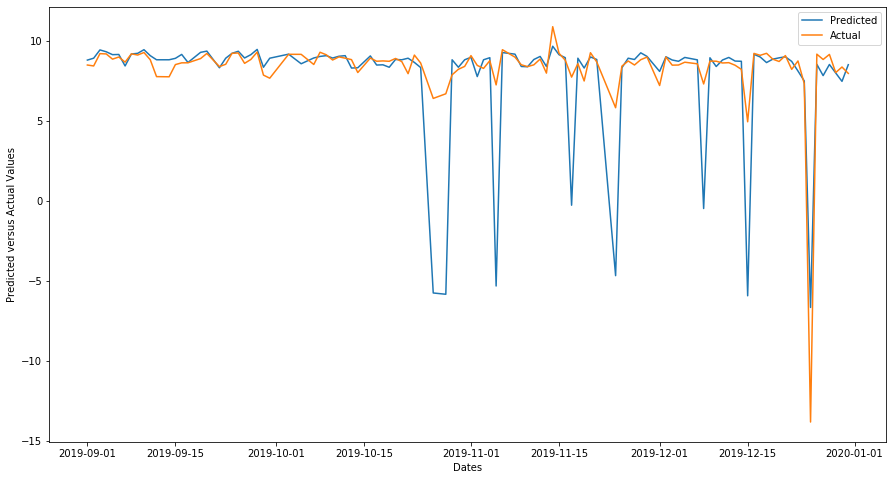

=====camrose=====
RMSE loss for camrose = 0.323


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



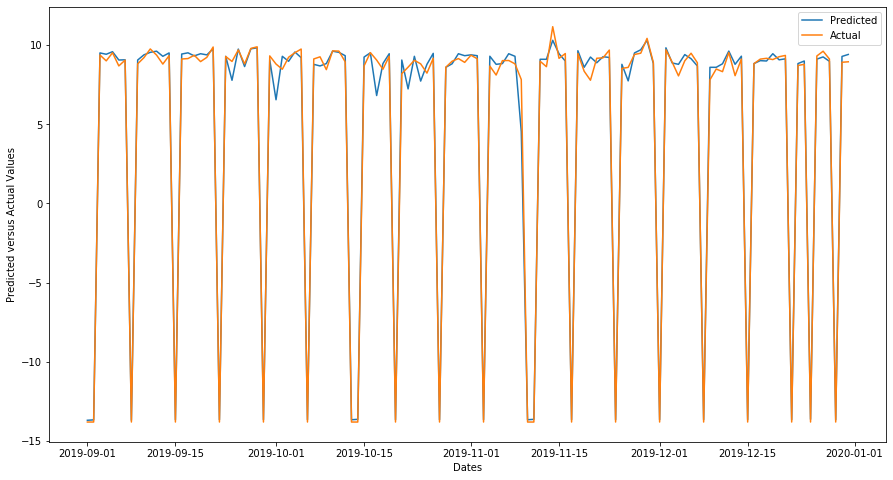

=====lethbridge=====
RMSE loss for lethbridge = 0.305


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



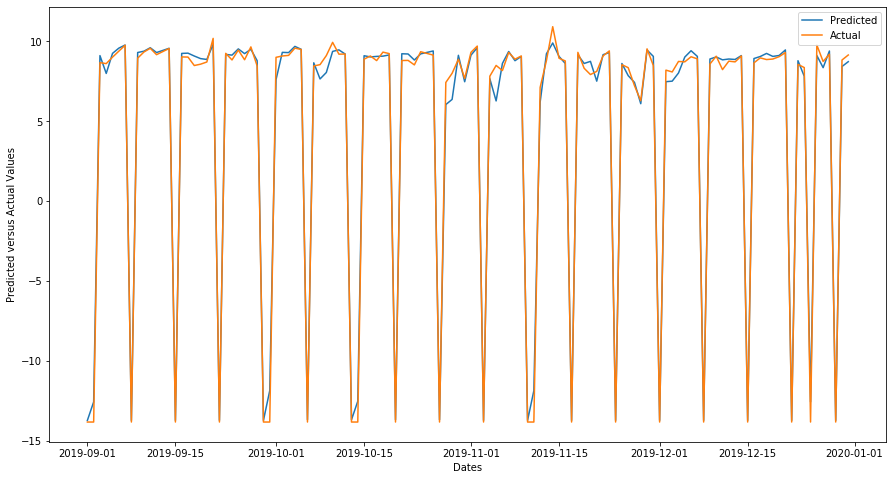

=====terrace=====
RMSE loss for terrace = 1.400


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



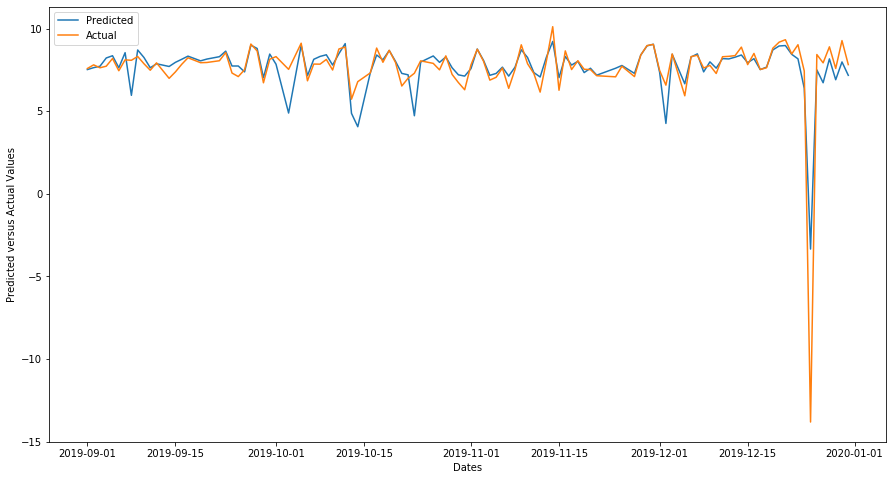

In [81]:
LGBM = sales_modeling(tr_data,te_data,'lgbm',False)

=====medicine hat=====
[06:23:17] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for medicine hat = 0.028


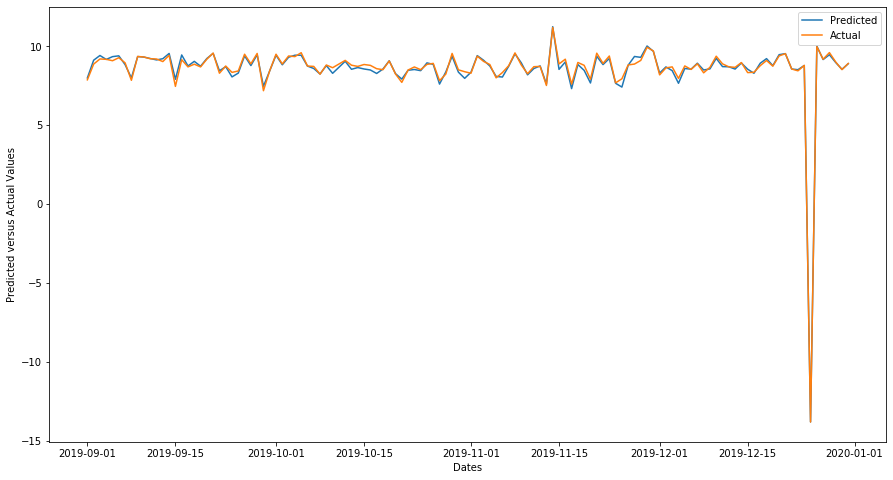

=====yorkton=====
[06:23:27] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for yorkton = 0.064


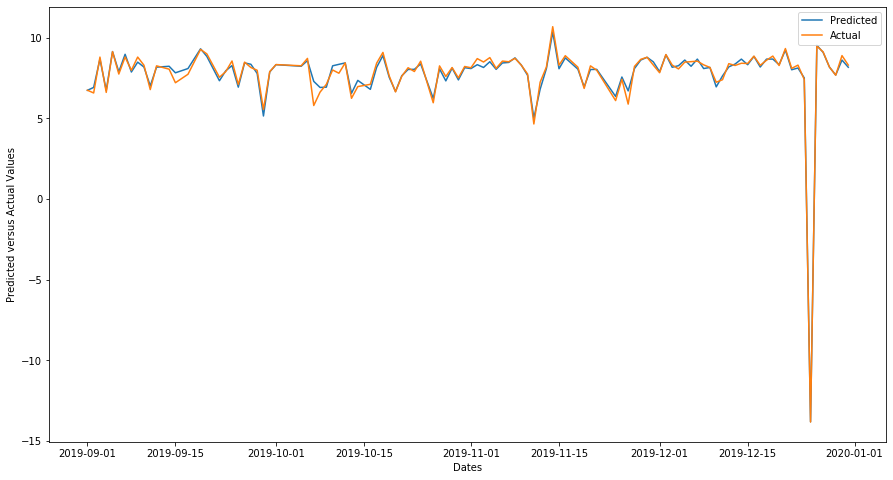

=====cranbrook=====
[06:23:37] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for cranbrook = 0.078


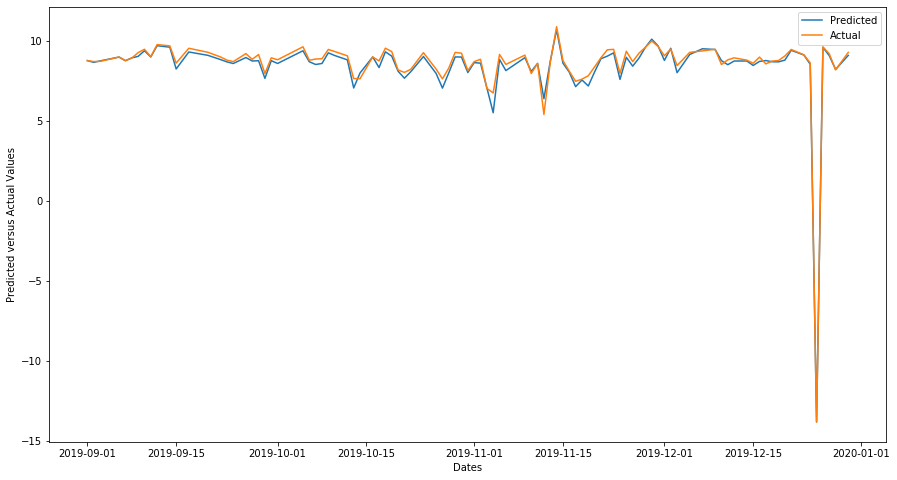

=====fort st john=====
[06:23:47] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for fort st john = 0.061


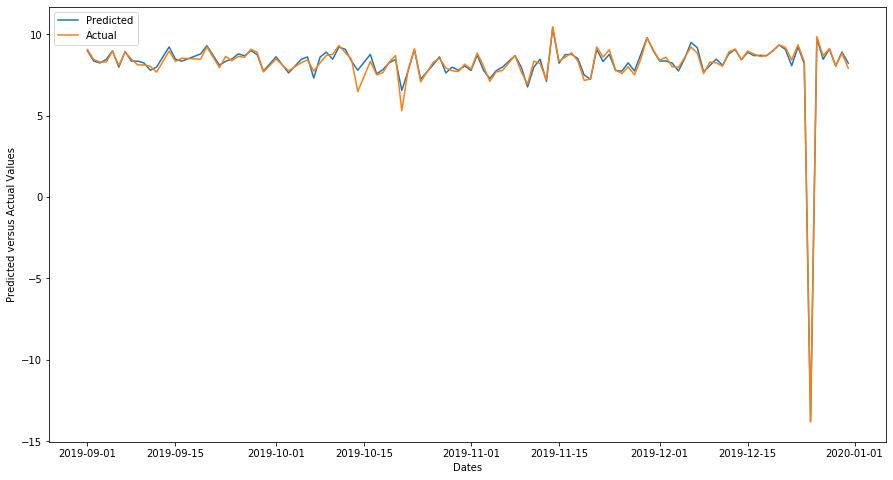

=====kamloops=====
[06:24:01] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kamloops = 0.024


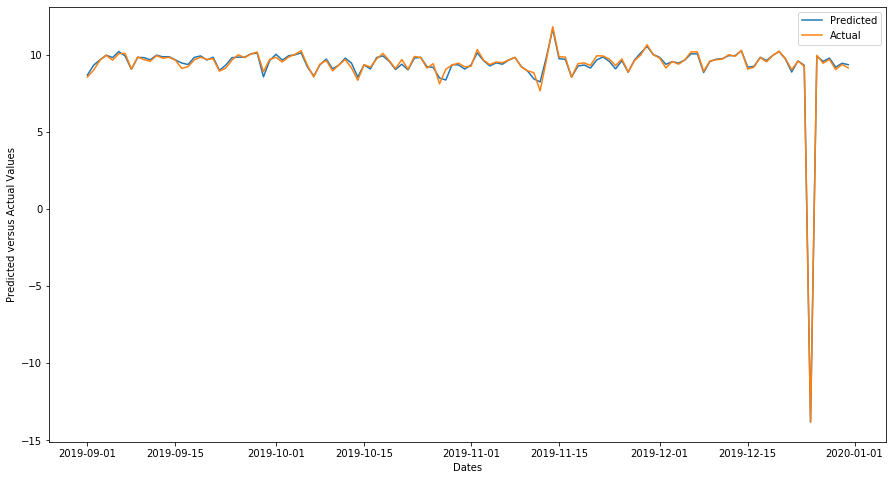

=====kelowna=====
[06:24:14] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kelowna = 0.020


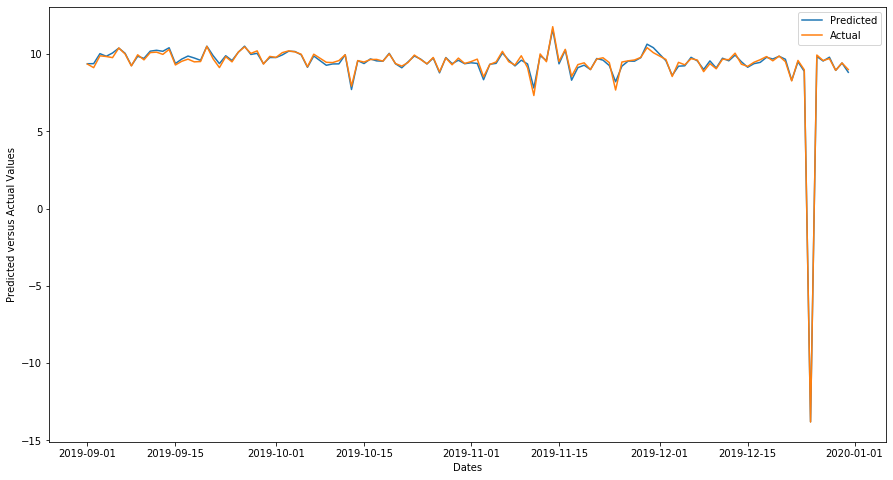

=====calgary=====
[06:24:28] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for calgary = 0.012


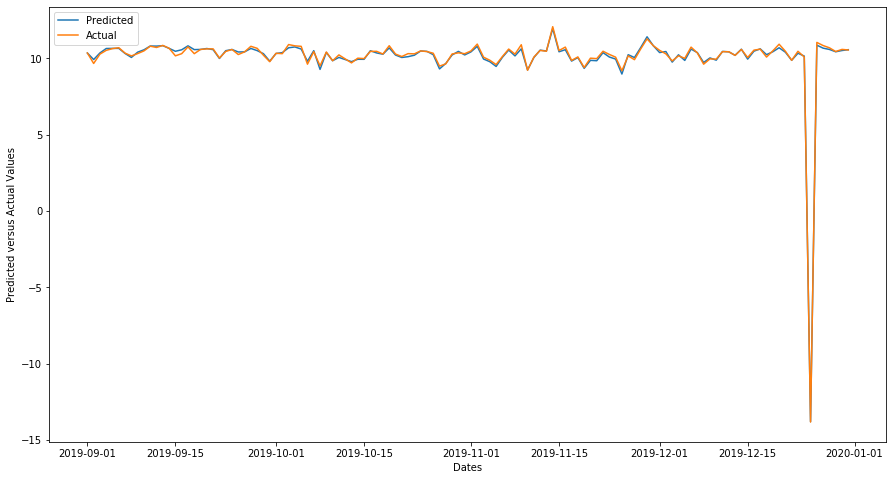

=====penticton=====
[06:24:41] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for penticton = 0.028


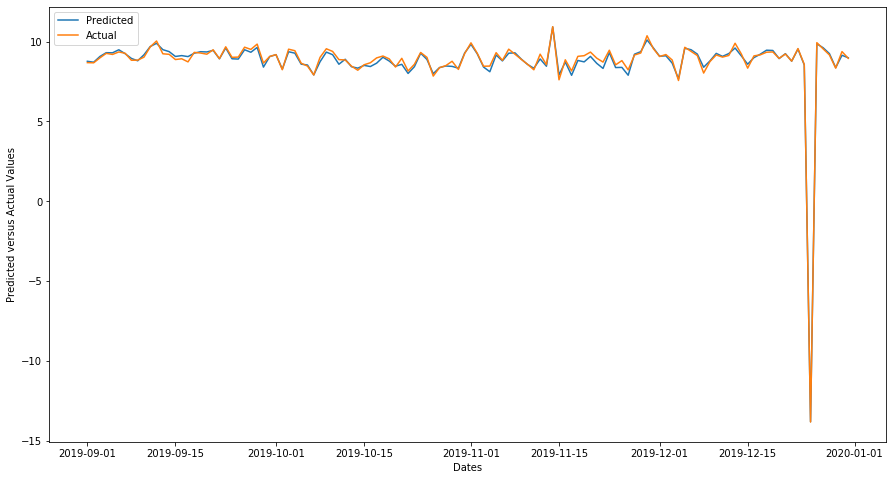

=====port alberni=====
[06:24:54] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for port alberni = 2.970


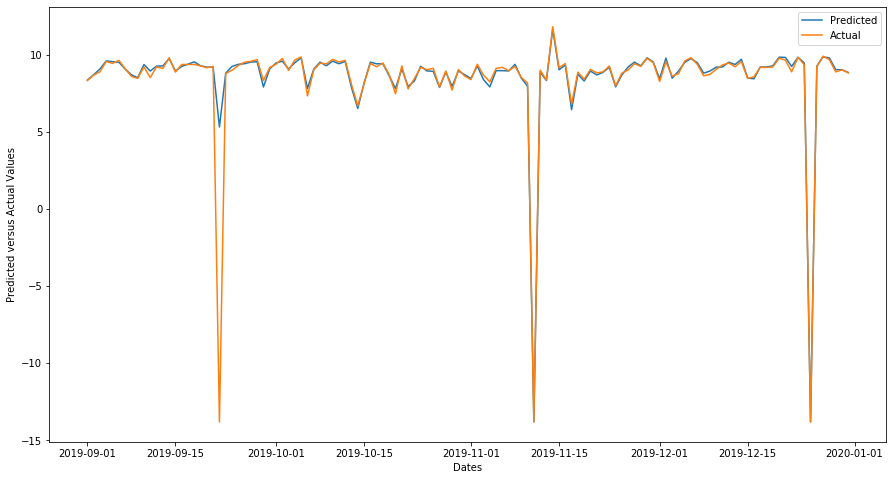

=====quesnel=====
[06:25:05] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for quesnel = 0.038


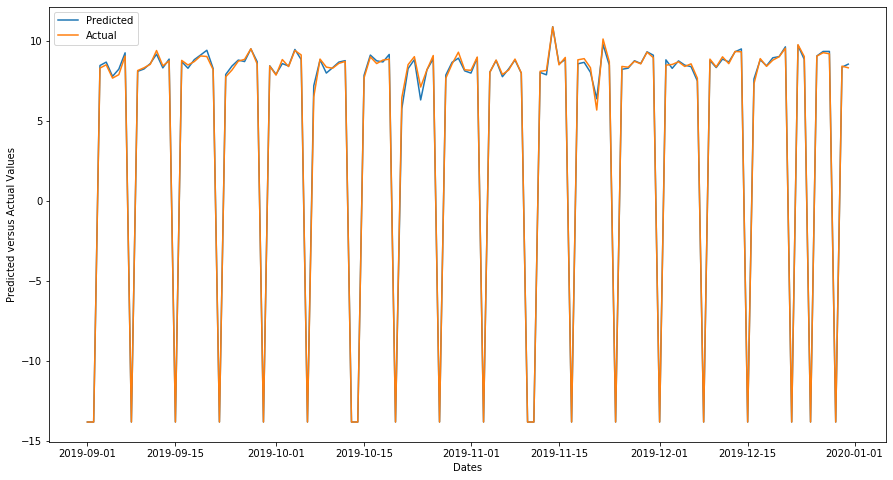

=====salmon arm=====
[06:25:18] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for salmon arm = 0.041


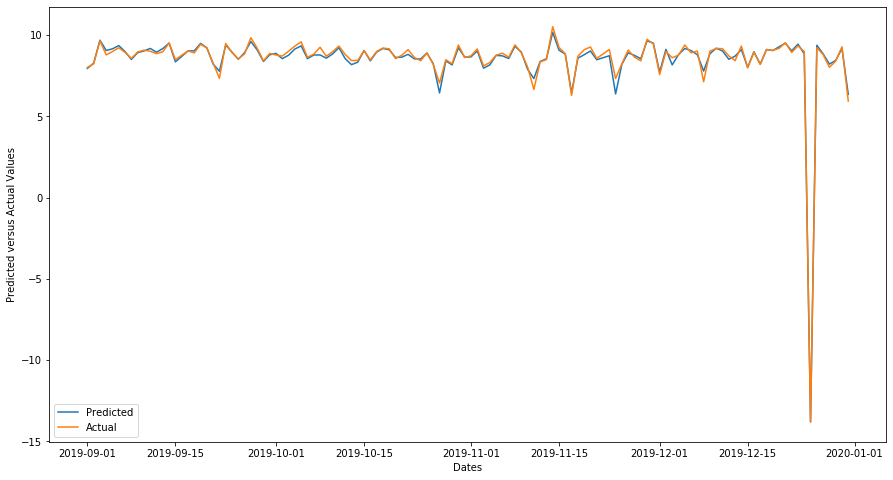

=====trail=====
[06:25:30] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for trail = 0.038


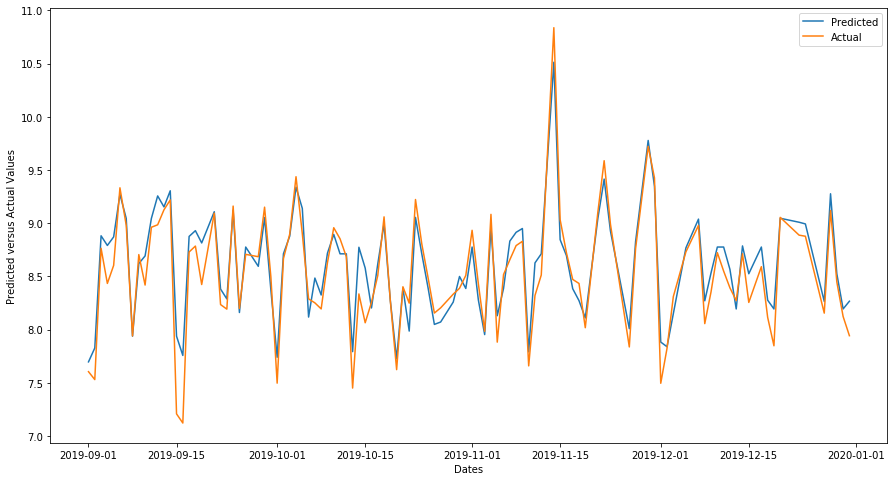

=====vernon=====
[06:25:43] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for vernon = 0.030


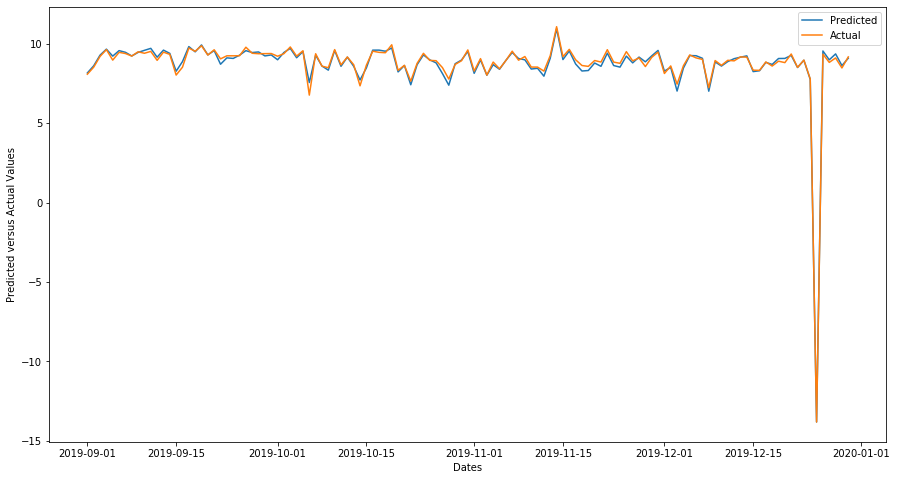

=====white rock=====
[06:25:57] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for white rock = 0.016


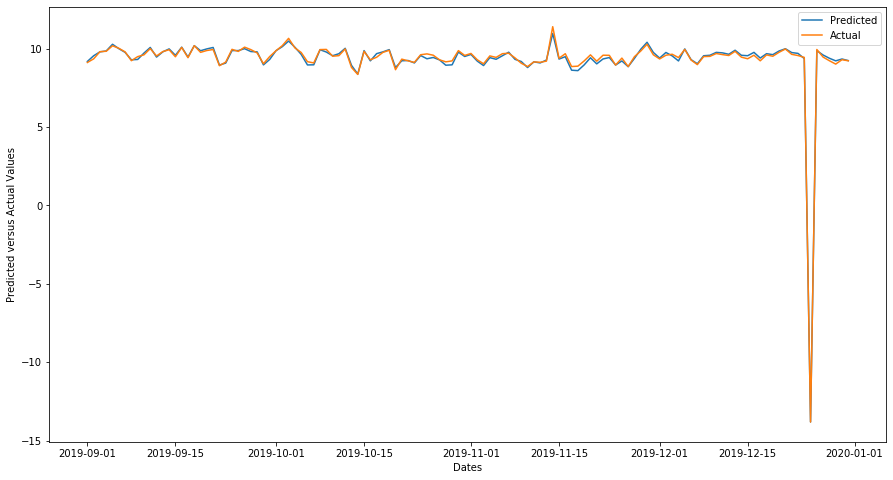

=====williams lake=====
[06:26:05] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for williams lake = 0.021


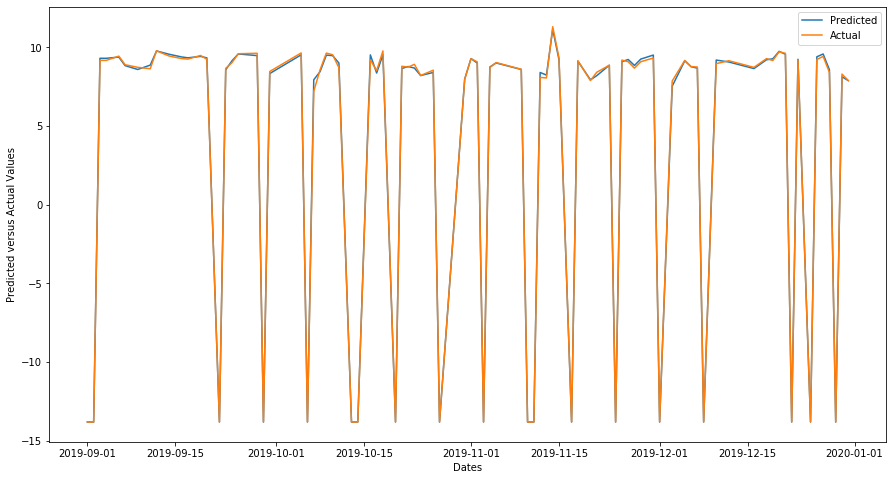

=====regina=====
[06:26:19] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for regina = 0.016


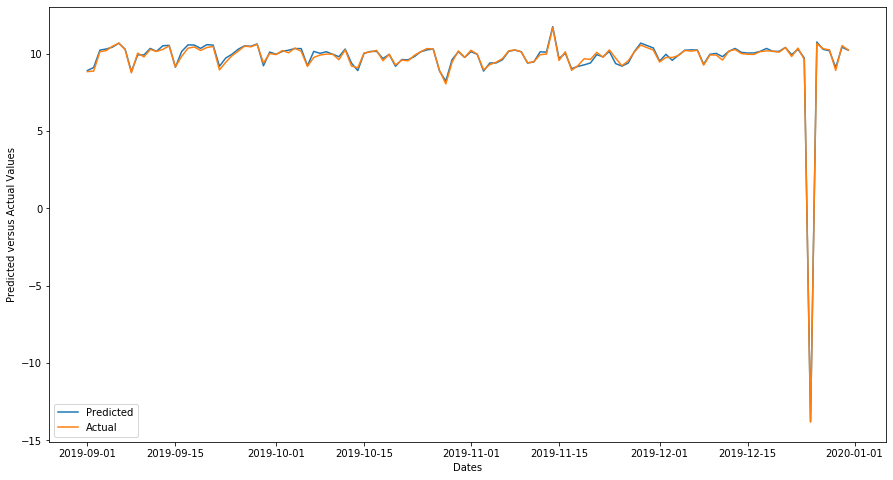

=====saskatoon=====
[06:26:30] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for saskatoon = 0.021


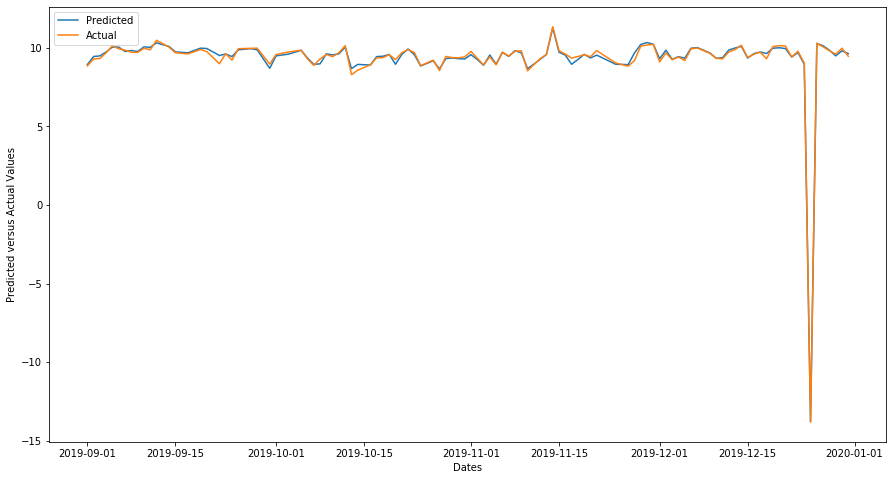

=====swift current=====
[06:26:40] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for swift current = 0.087


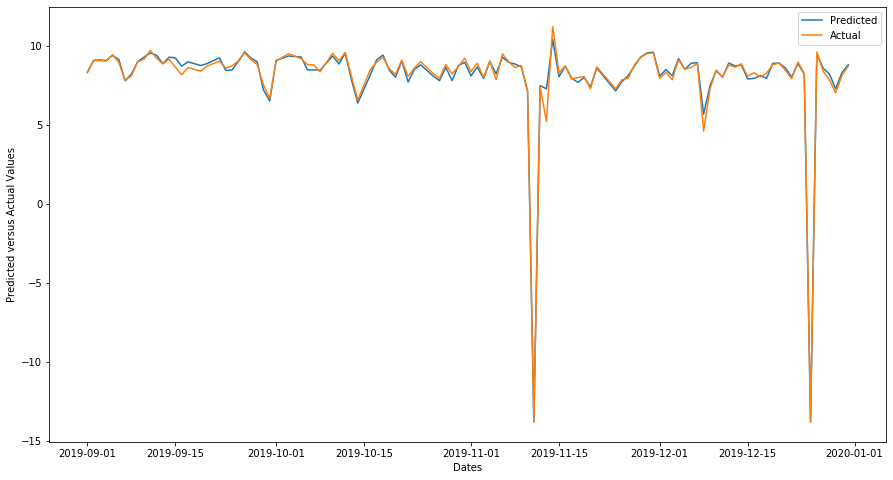

=====wainwright=====
[06:26:52] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for wainwright = 0.034


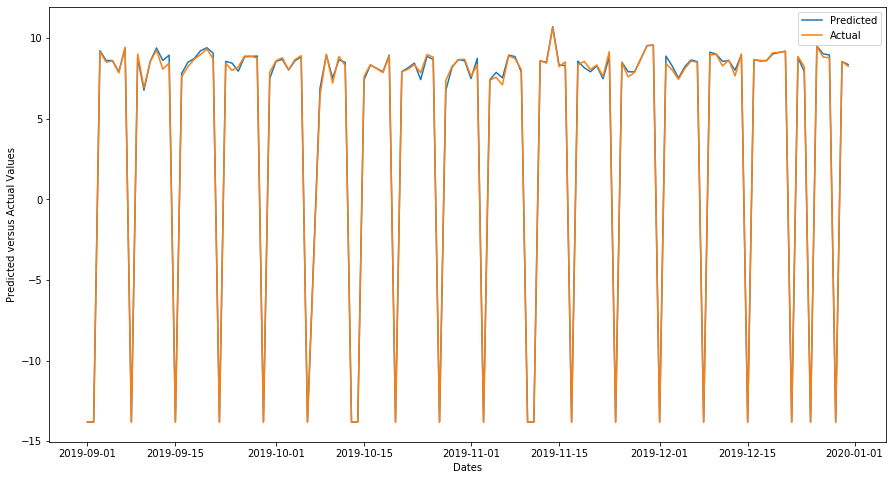

=====stettler=====
[06:27:04] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for stettler = 0.028


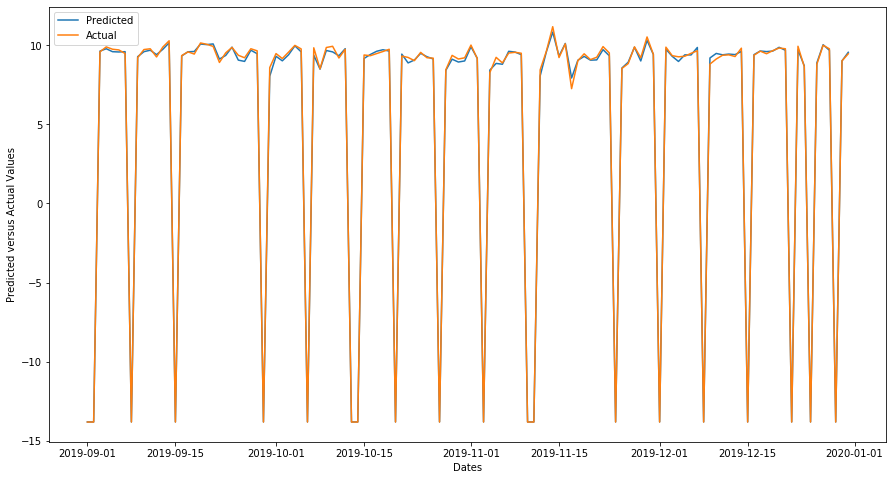

=====nelson=====
No records to test for nelson city
=====edmonton=====
[06:27:13] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for edmonton = 0.055


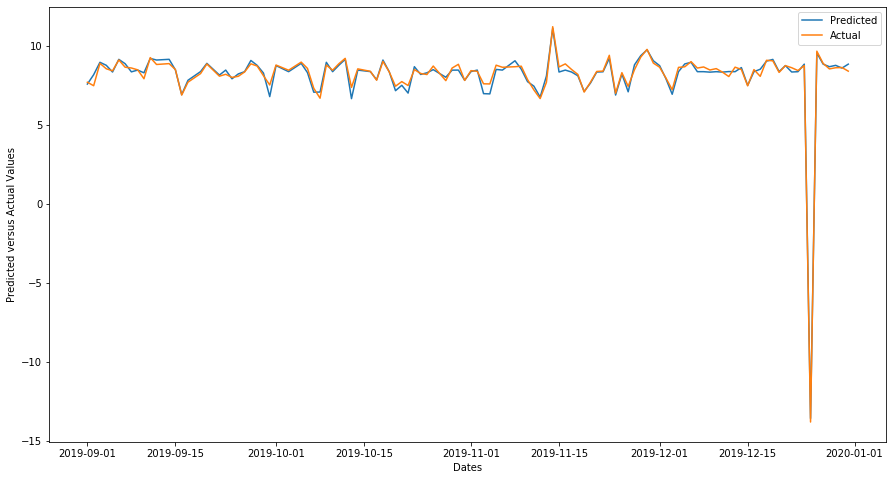

=====olds=====
[06:27:25] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for olds = 0.018


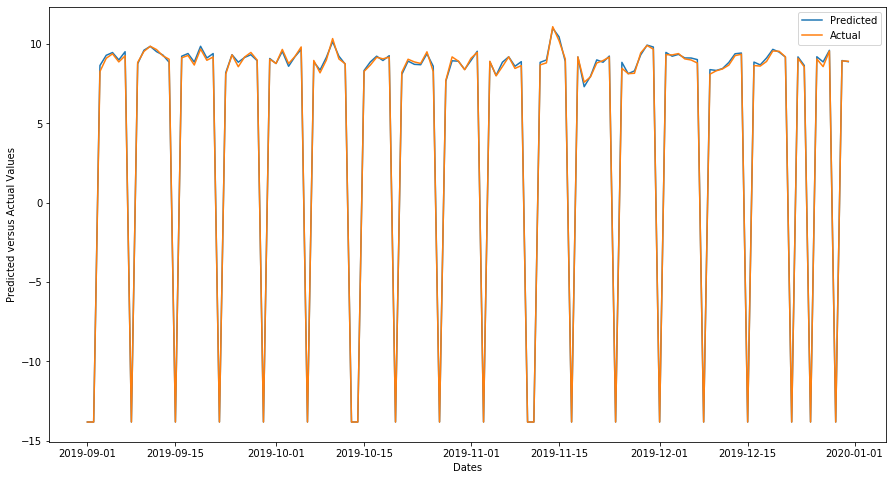

=====red deer=====
[06:27:36] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for red deer = 0.063


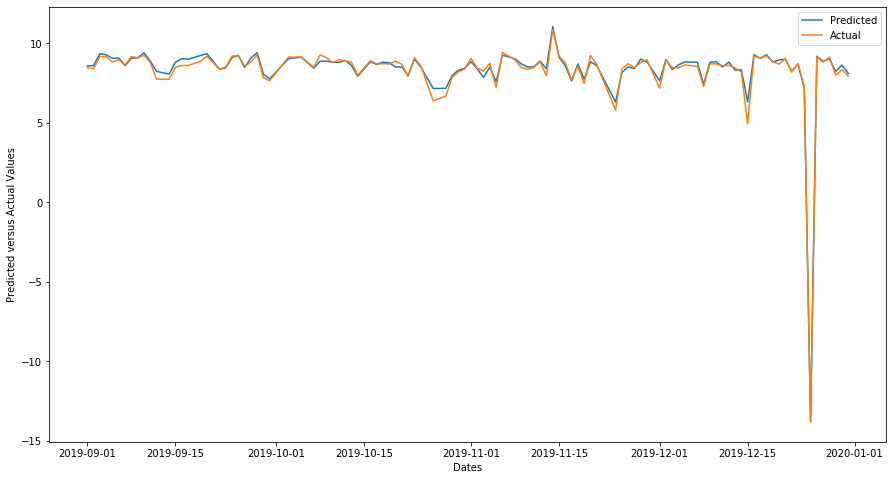

=====camrose=====
[06:27:47] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for camrose = 0.018


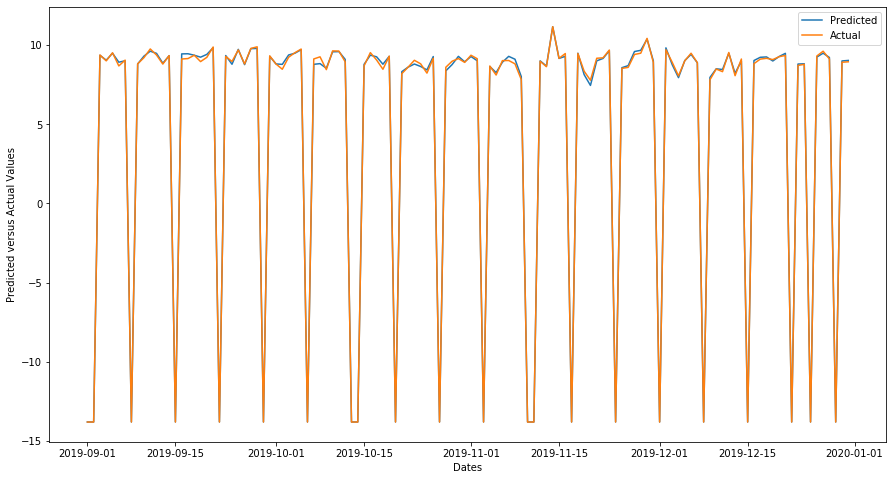

=====lethbridge=====
[06:27:59] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for lethbridge = 1.254


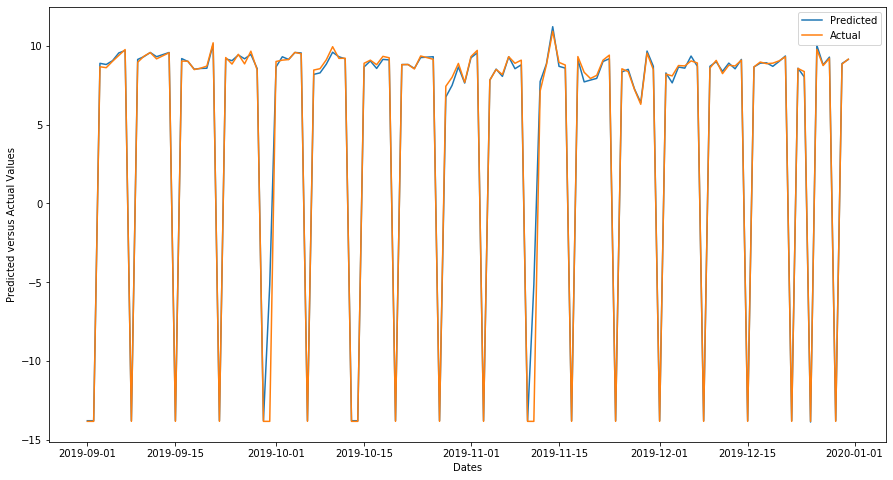

=====terrace=====
[06:28:08] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for terrace = 0.066


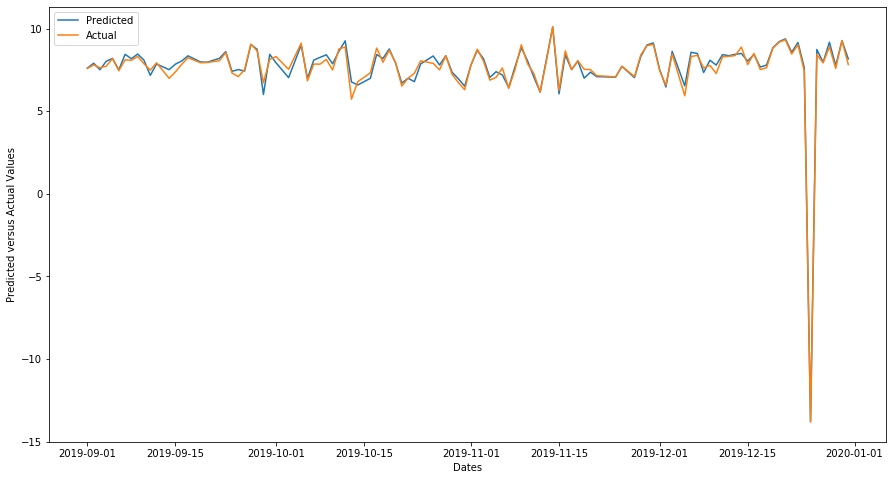

In [82]:
ST = sales_modeling(tr_data,te_data,'st',False)

## Performance for Sales without weather!

### For XGboost

In [87]:
columns=['RMSE_xgb','MAE_xgb','R2_xgb','city','time_xgb']
df_xgb= pd.DataFrame(XGB,columns=columns)

In [89]:
#City wise!
df_xgb

,RMSE_xgb,MAE_xgb,R2_xgb,city,time_xgb
0,0.033901,0.144333,0.992342,medicine hat,0.15
1,0.588187,0.268860,0.882069,yorkton,0.45
2,0.081252,0.188690,0.985312,cranbrook,0.74
3,0.093471,0.219788,0.980251,fort st john,1.06
4,0.017195,0.098020,0.996265,kamloops,1.40
5,0.067839,0.129674,0.985566,kelowna,1.75
6,0.010672,0.081646,0.997794,calgary,2.08
7,0.043289,0.136796,0.990161,penticton,2.43
8,0.087727,0.150031,0.993095,port alberni,2.78
9,0.066875,0.147907,0.999170,quesnel,3.12


In [91]:
df_xgb[['RMSE_xgb','MAE_xgb','R2_xgb','time_xgb']].mean()

RMSE_xgb    0.073305
MAE_xgb     0.146234
R2_xgb      0.983921
time_xgb    4.364231
dtype: float64

### For LightGBM

In [93]:
columns=['RMSE_lgbm','MAE_lgbm','R2_lgbm','city','time_lgbm']
df_lgbm= pd.DataFrame(LGBM,columns=columns)

In [94]:
#City Wise!
df_lgbm

,RMSE_lgbm,MAE_lgbm,R2_lgbm,city,time_lgbm
0,0.100007,0.233894,0.977411,medicine hat,0.04
1,2.716588,0.551374,0.455324,yorkton,0.26
2,0.123409,0.246136,0.977691,cranbrook,0.49
3,0.228328,0.277819,0.951757,fort st john,0.71
4,0.265055,0.246609,0.942426,kamloops,0.93
5,0.209930,0.197755,0.955333,kelowna,1.16
6,0.233284,0.210102,0.951774,calgary,1.39
7,0.474836,0.293777,0.892080,penticton,1.62
8,0.113375,0.200511,0.991076,port alberni,1.86
9,0.163993,0.261964,0.997965,quesnel,2.09


In [95]:
df_lgbm[['RMSE_lgbm','MAE_lgbm','R2_lgbm','time_lgbm']].mean()

RMSE_lgbm    0.757940
MAE_lgbm     0.331345
R2_lgbm      0.849235
time_lgbm    2.955769
dtype: float64

### For Stacking 

In [96]:
columns=['RMSE_st','MAE_st','R2_st','city','time_st']
df_st= pd.DataFrame(ST,columns=columns)

In [97]:
# City Wise!
df_st

,RMSE_st,MAE_st,R2_st,city,time_st
0,0.027589,0.124699,0.993768,medicine hat,12.53
1,0.064020,0.171201,0.987164,yorkton,22.67
2,0.077827,0.201632,0.985931,cranbrook,32.28
3,0.061034,0.170342,0.987104,fort st john,42.59
4,0.024138,0.110857,0.994757,kamloops,56.23
5,0.019936,0.104873,0.995758,kelowna,69.98
6,0.012330,0.086291,0.997451,calgary,83.99
7,0.028039,0.129894,0.993627,penticton,96.89
8,2.970315,0.269906,0.766198,port alberni,109.80
9,0.037730,0.125184,0.999532,quesnel,120.93


In [98]:
df_st[['RMSE_st','MAE_st','R2_st','time_st']].mean()

RMSE_st      0.197213
MAE_st       0.143311
R2_st        0.980520
time_st    160.984231
dtype: float64

# Sales -  Modeling with weather!

=====medicine hat=====
[06:43:29] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for medicine hat = 0.026


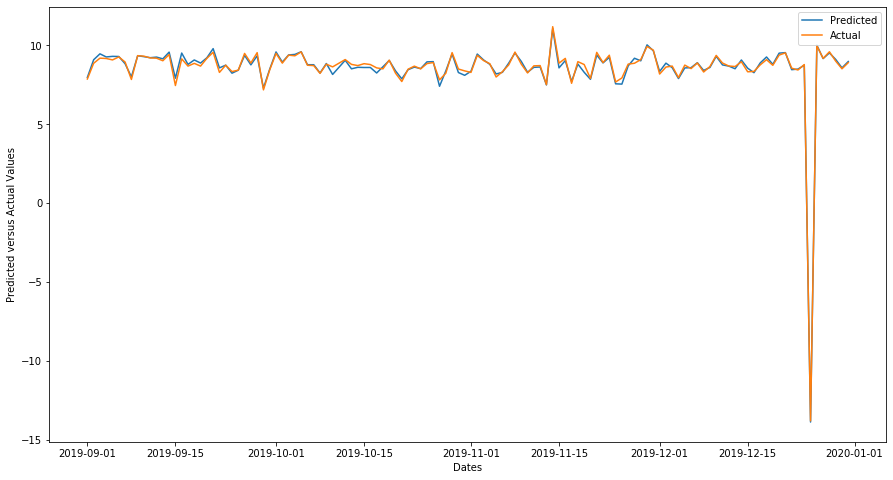

=====yorkton=====
[06:43:29] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for yorkton = 1.344


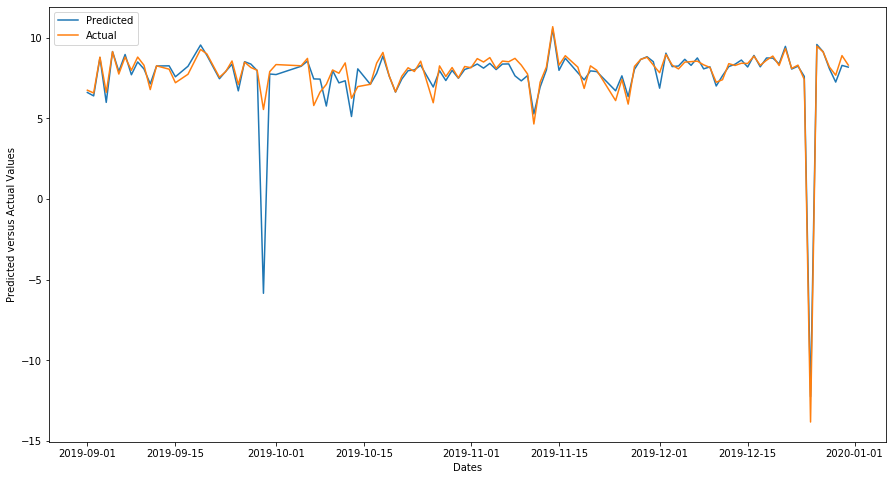

=====cranbrook=====
[06:43:29] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for cranbrook = 0.273


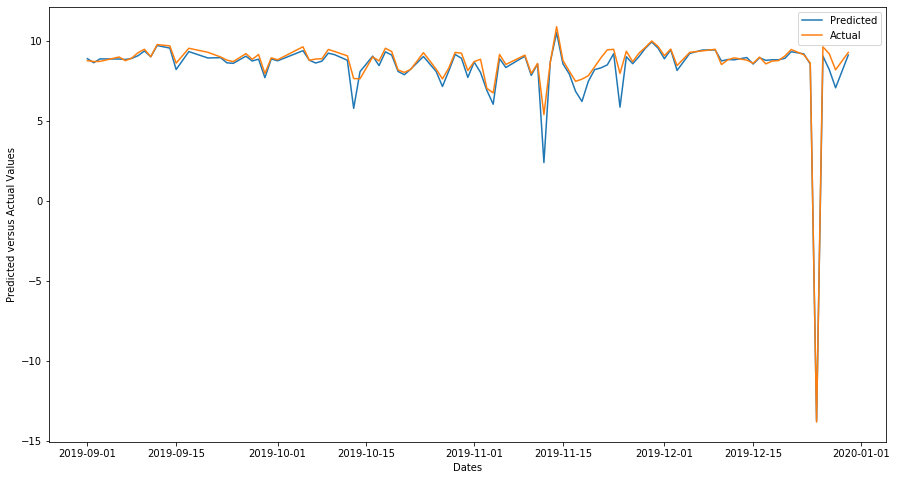

=====fort st john=====
[06:43:30] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for fort st john = 1.396


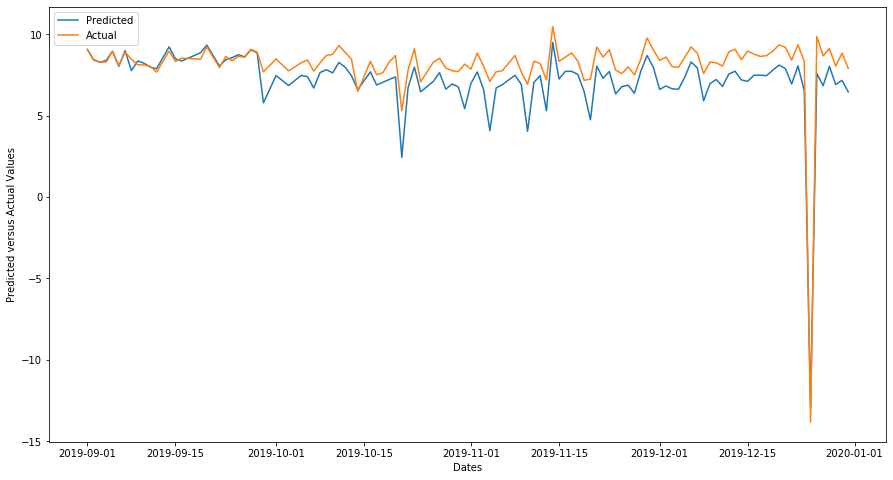

=====kamloops=====
[06:43:30] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kamloops = 0.035


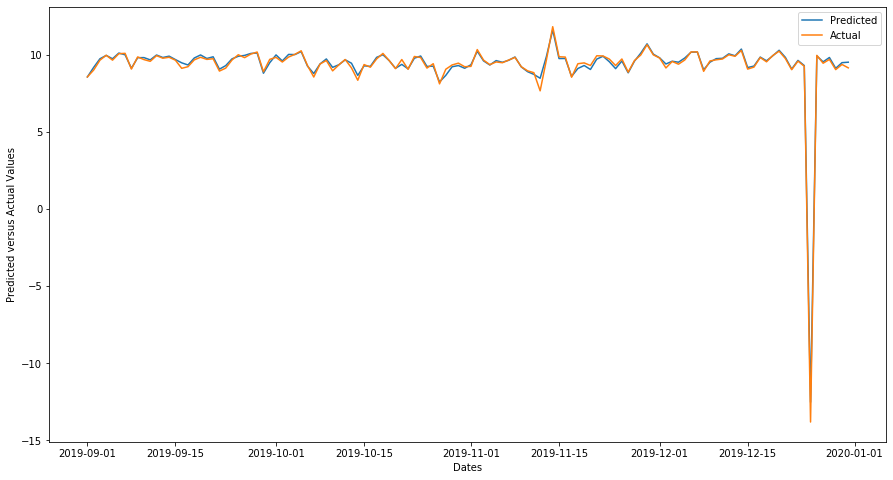

=====kelowna=====
[06:43:30] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kelowna = 0.028


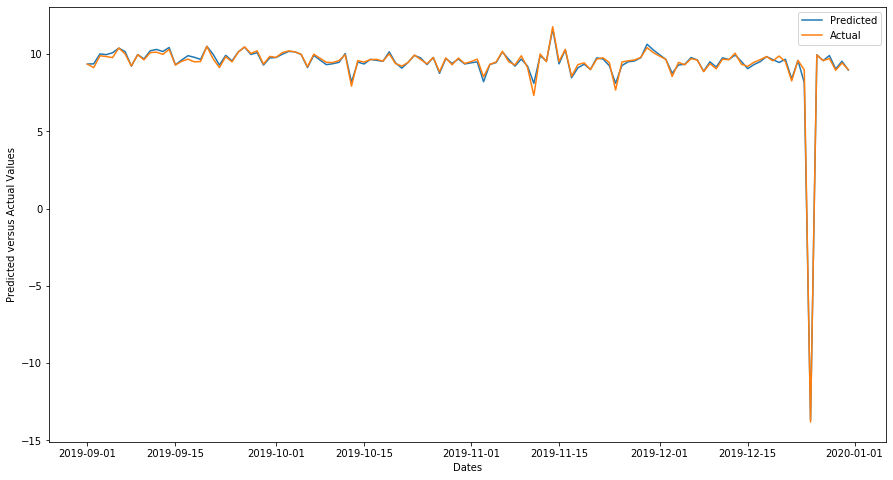

=====calgary=====
[06:43:31] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for calgary = 0.010


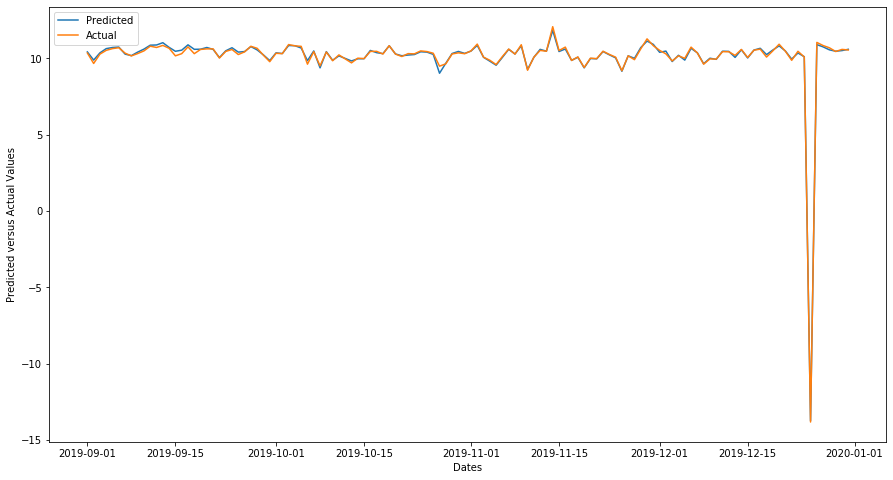

=====penticton=====
[06:43:31] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for penticton = 0.049


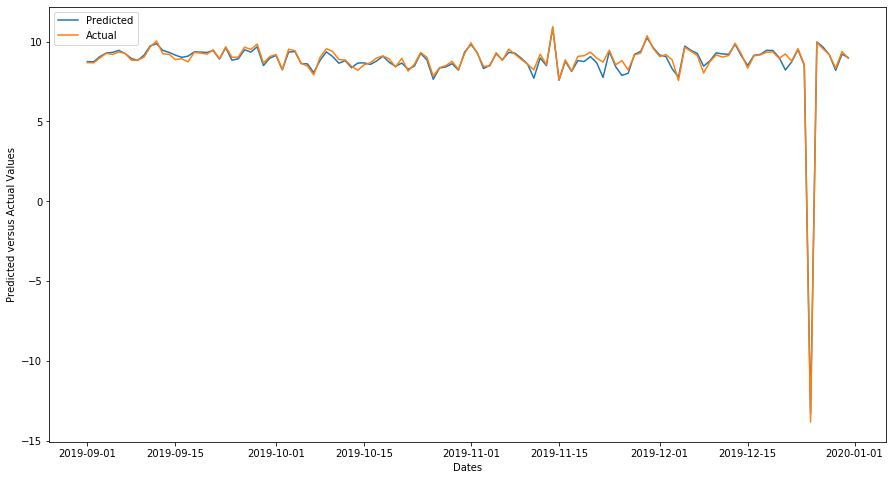

=====port alberni=====
[06:43:31] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for port alberni = 0.241


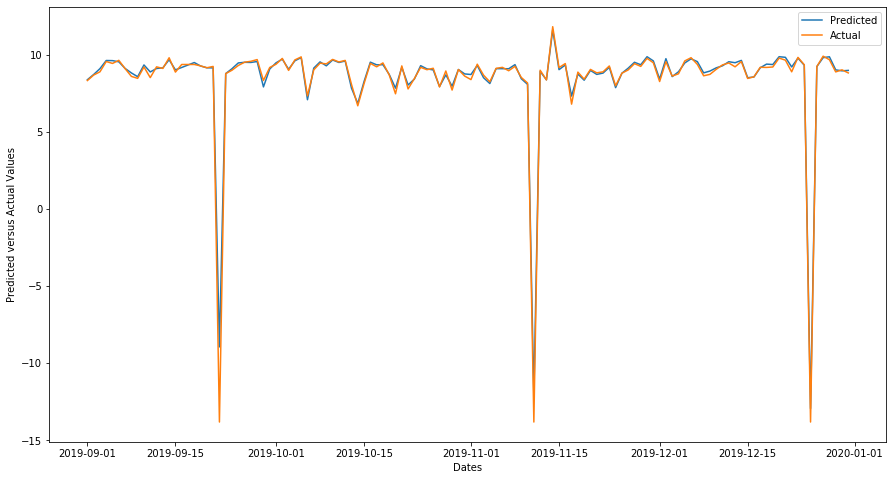

=====quesnel=====
[06:43:32] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for quesnel = 0.937


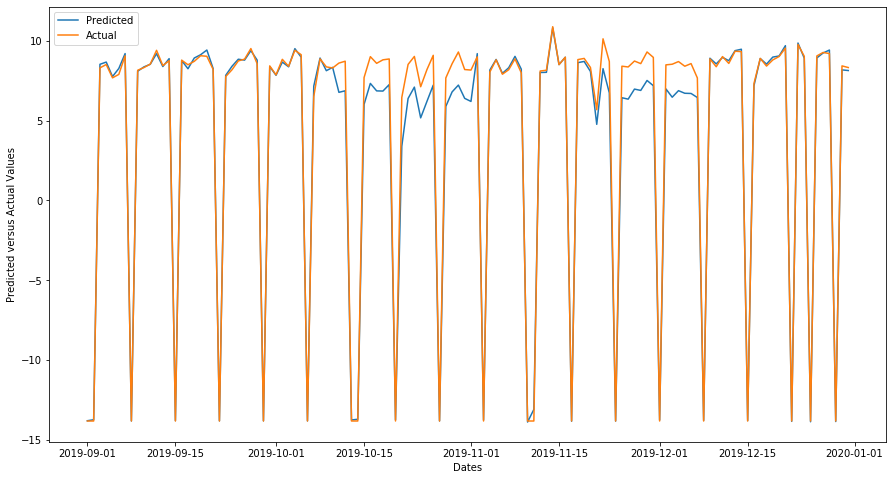

=====salmon arm=====
[06:43:32] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for salmon arm = 0.029


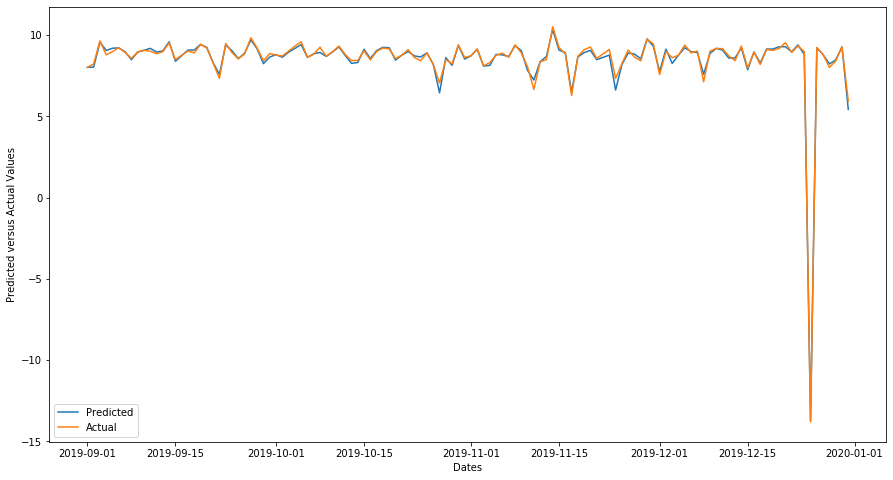

=====trail=====
[06:43:32] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for trail = 0.038


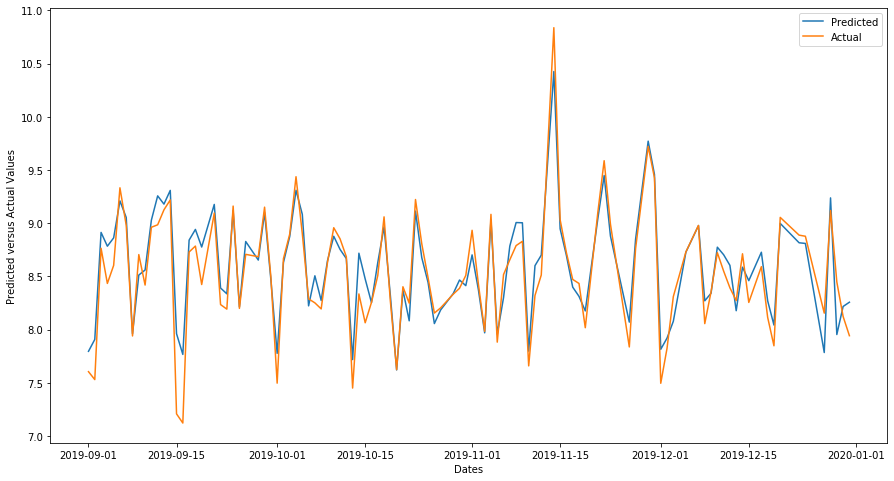

=====vernon=====
[06:43:33] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for vernon = 0.037


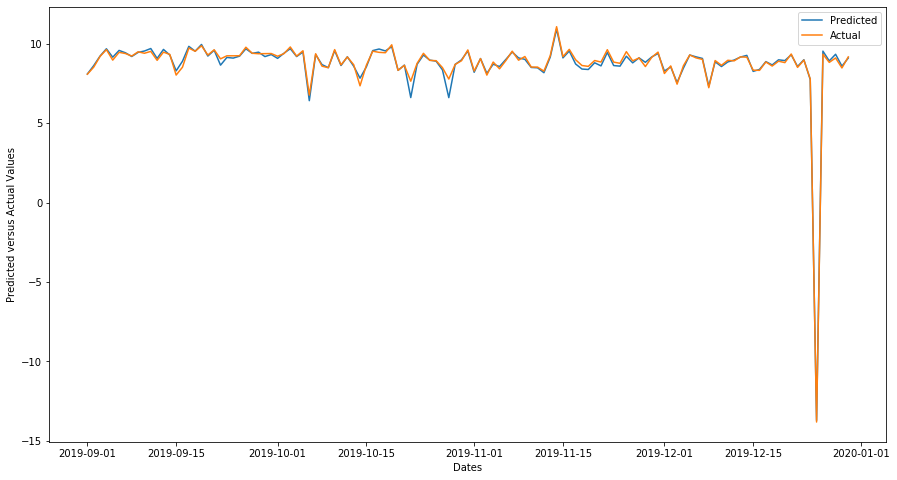

=====white rock=====
[06:43:33] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for white rock = 0.014


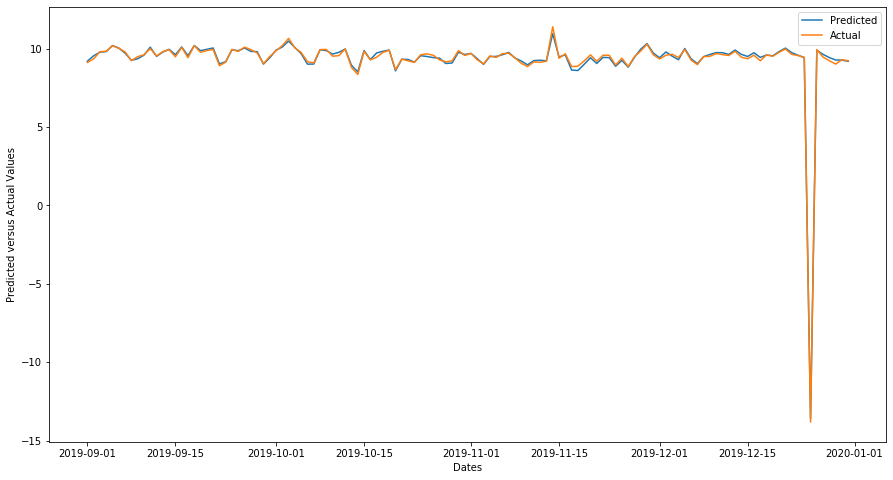

=====williams lake=====
[06:43:34] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for williams lake = 0.044


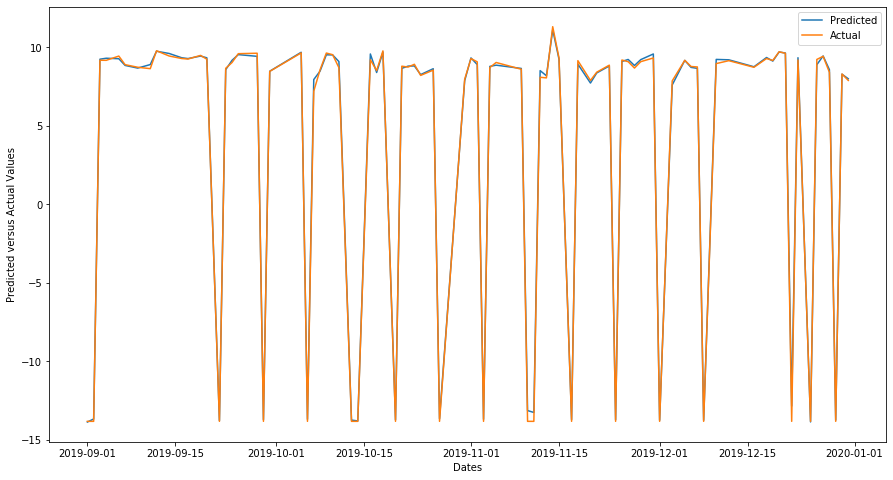

=====regina=====
[06:43:34] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for regina = 0.032


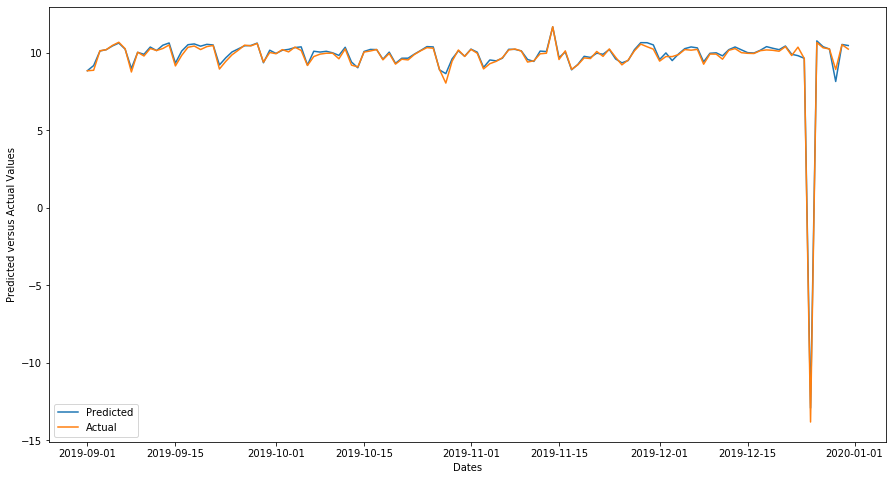

=====saskatoon=====
[06:43:34] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for saskatoon = 0.026


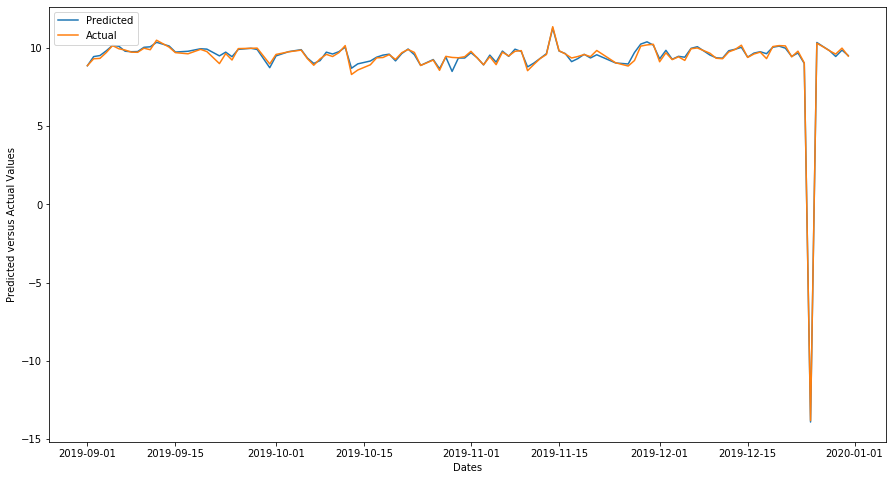

=====swift current=====
[06:43:35] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for swift current = 0.216


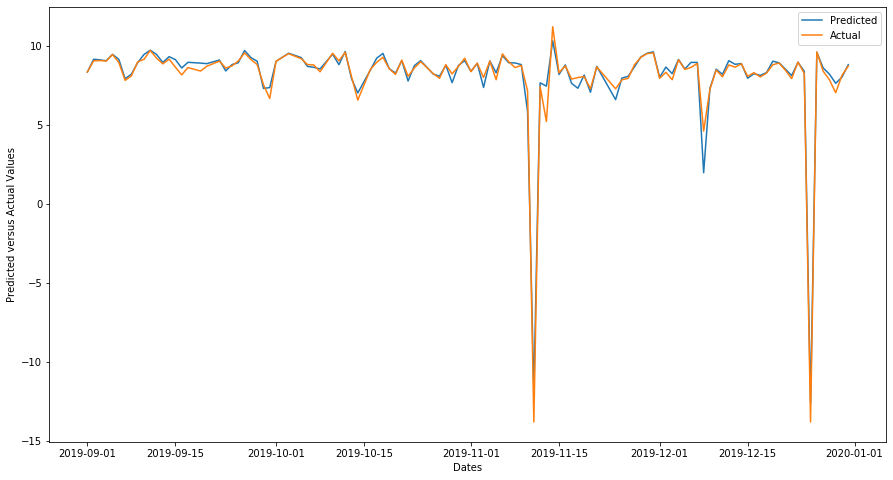

=====wainwright=====
[06:43:35] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for wainwright = 0.047


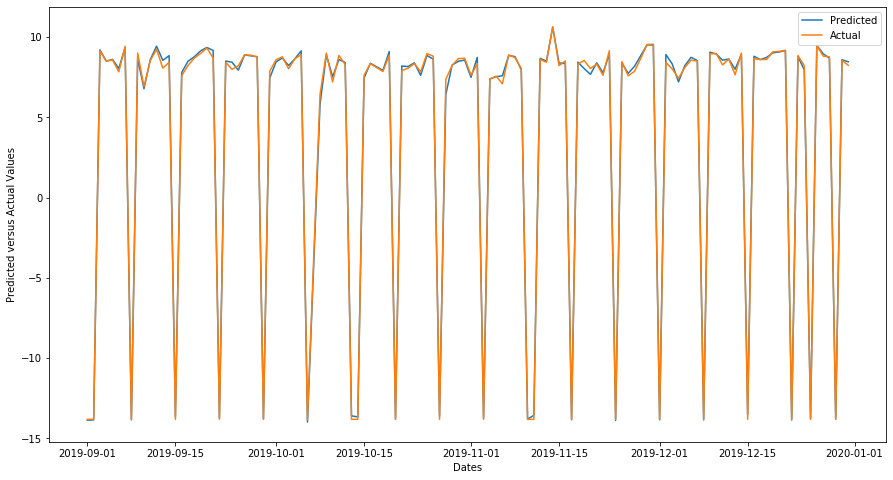

=====stettler=====
[06:43:35] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for stettler = 0.037


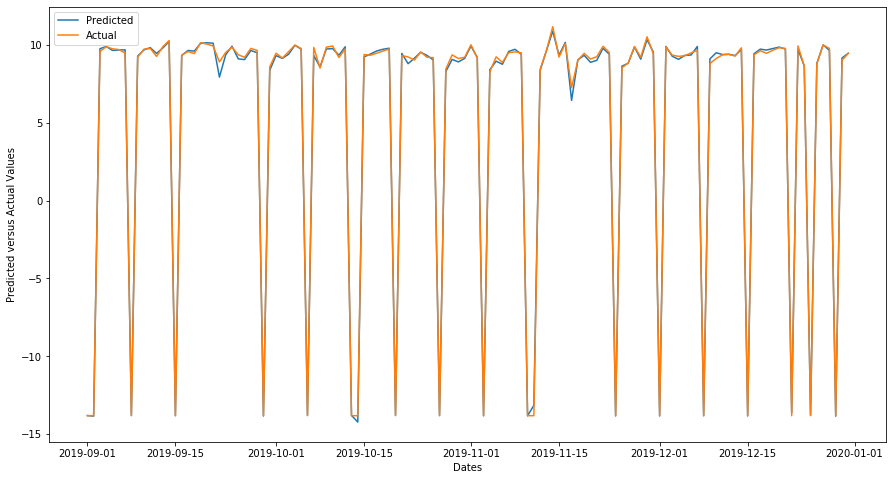

=====nelson=====
No records to test for nelson city
=====edmonton=====
[06:43:36] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for edmonton = 0.068


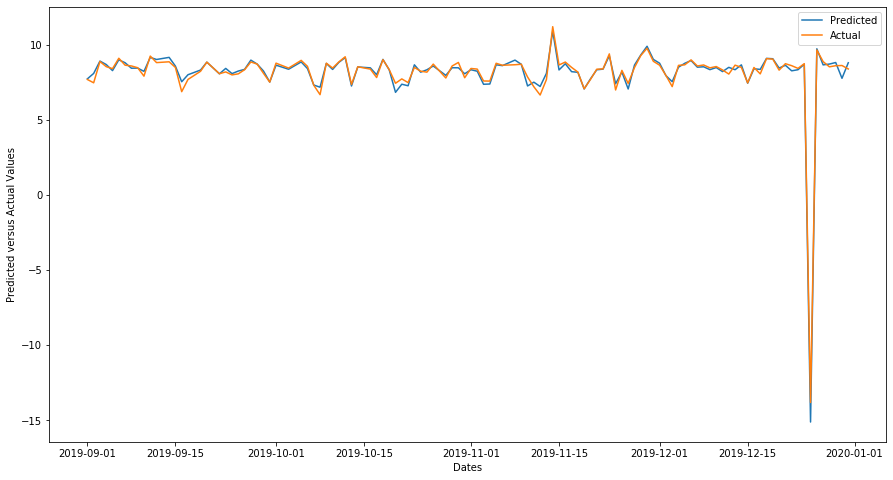

=====olds=====
[06:43:36] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for olds = 0.130


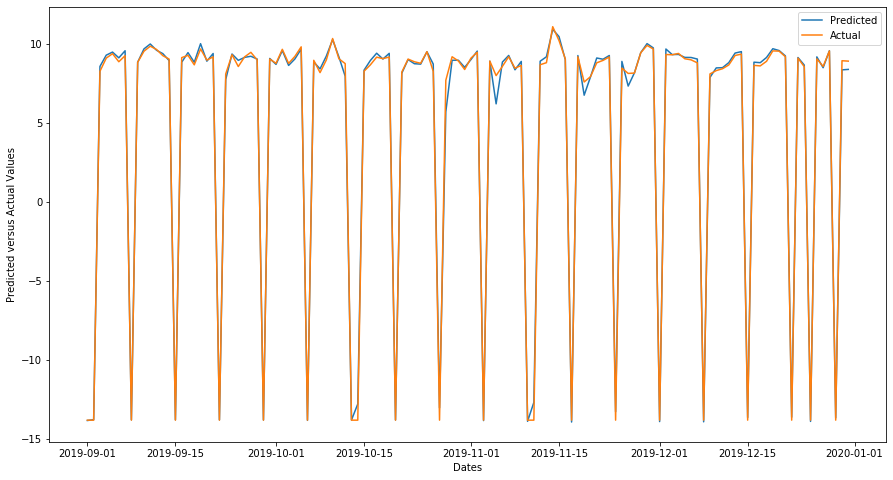

=====red deer=====
[06:43:36] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for red deer = 0.102


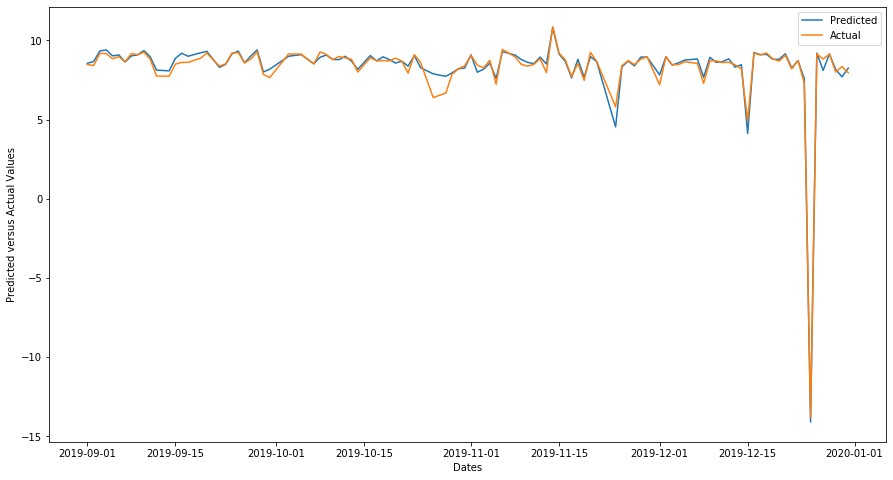

=====camrose=====
[06:43:37] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for camrose = 0.057


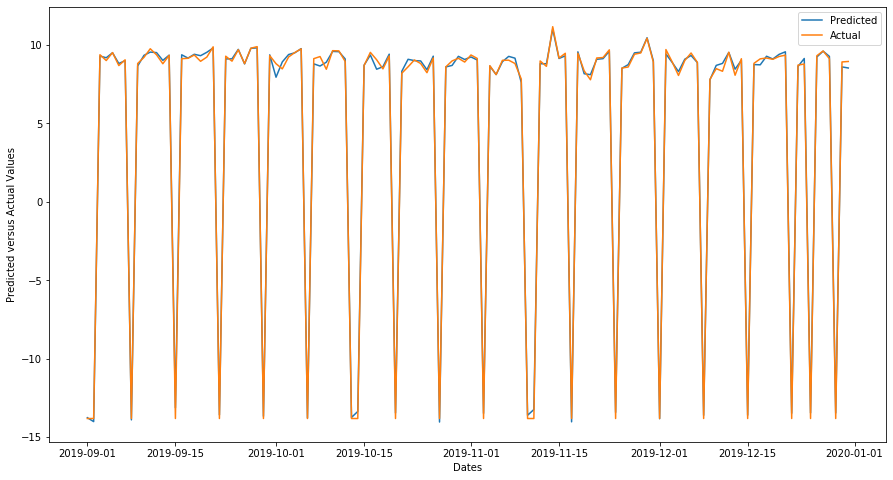

=====lethbridge=====
[06:43:37] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for lethbridge = 0.182


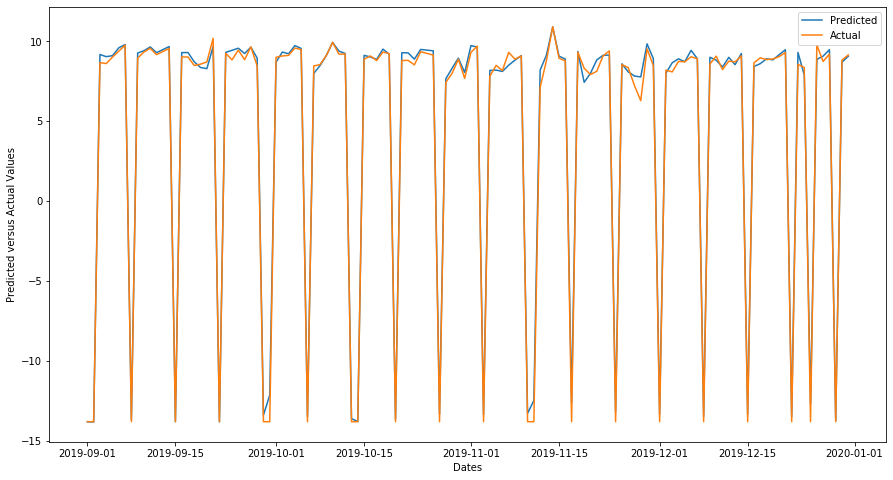

=====terrace=====
[06:43:38] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for terrace = 0.125


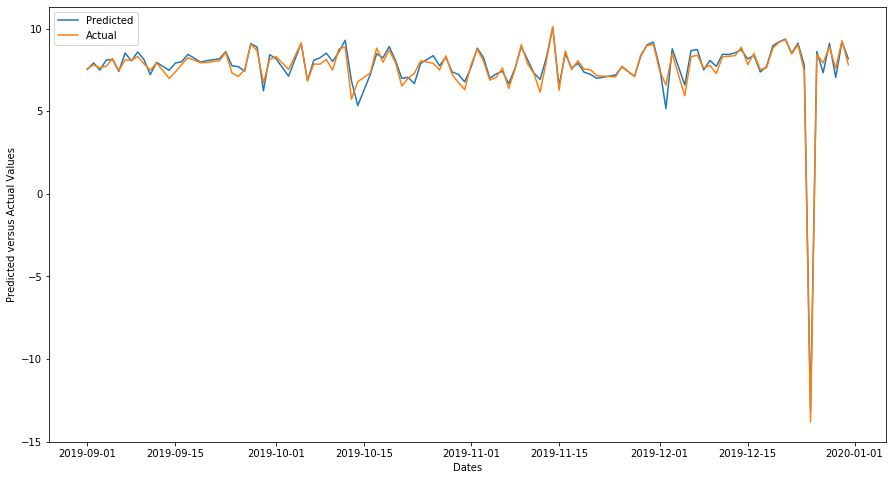

In [99]:
XGB_W =sales_modeling(tr_data,te_data,'xgb',True)

=====medicine hat=====
RMSE loss for medicine hat = 0.063


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



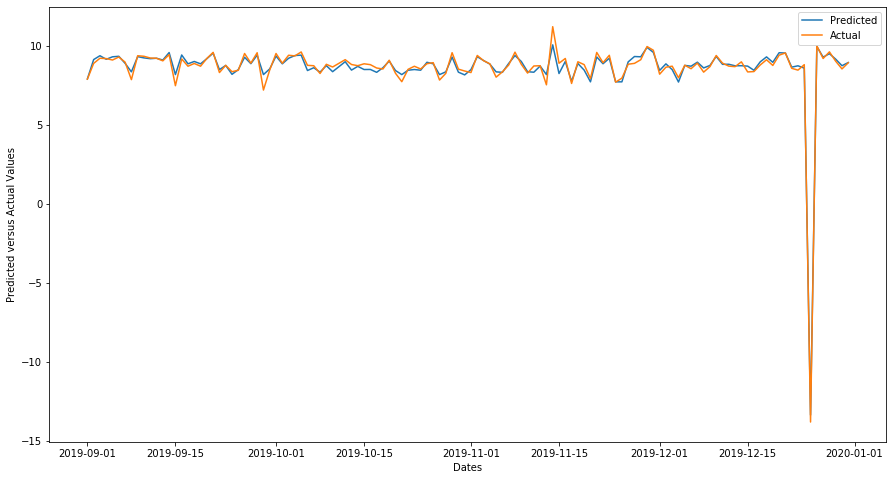

=====yorkton=====
RMSE loss for yorkton = 2.613


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



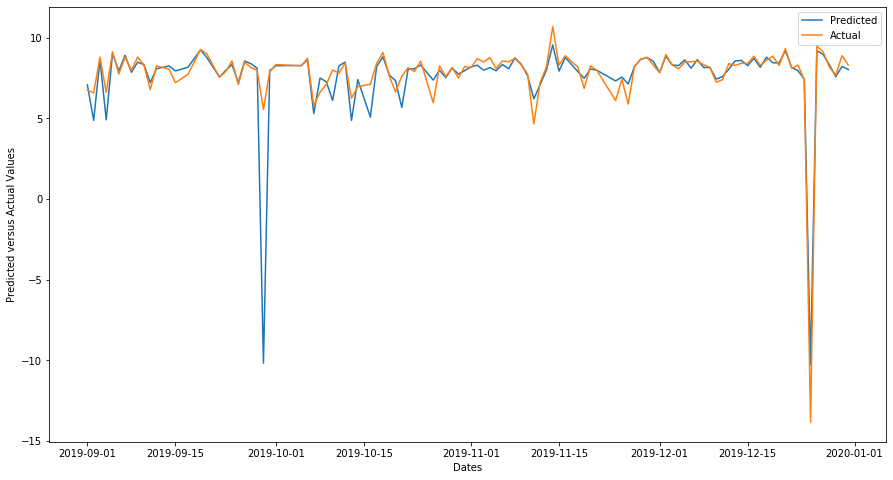

=====cranbrook=====
RMSE loss for cranbrook = 0.261


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



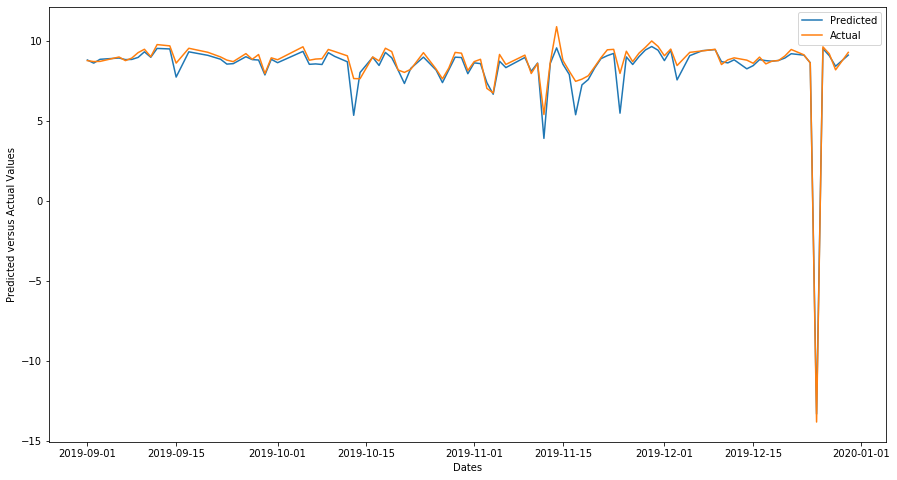

=====fort st john=====
RMSE loss for fort st john = 0.191


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



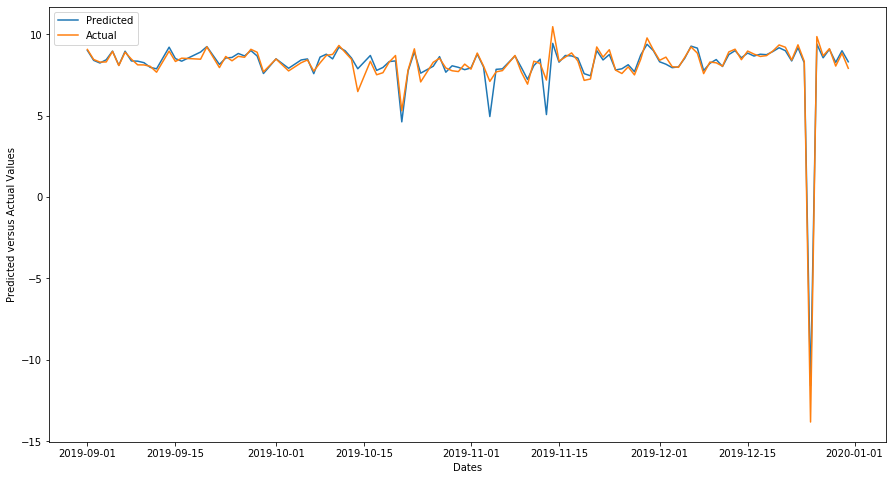

=====kamloops=====
RMSE loss for kamloops = 0.257


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



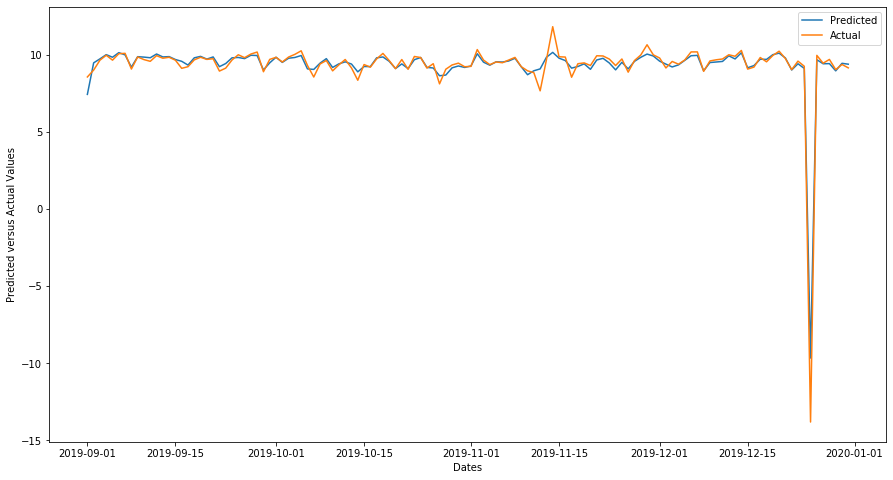

=====kelowna=====
RMSE loss for kelowna = 0.181


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



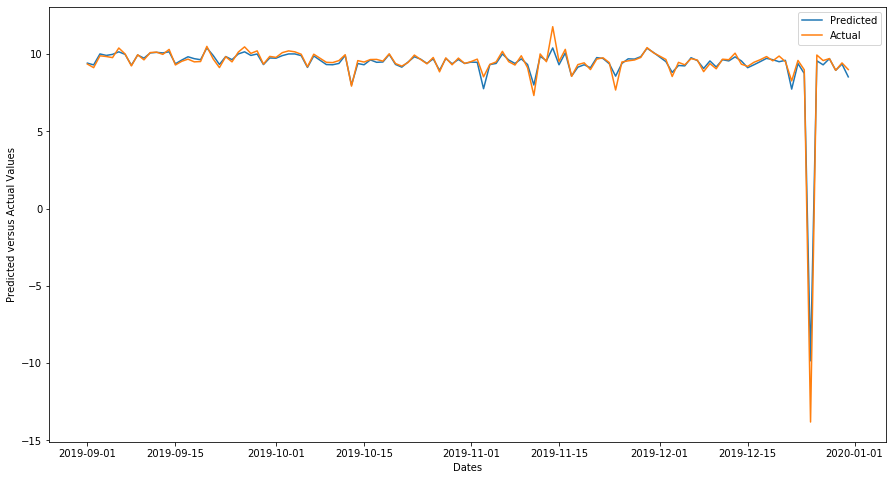

=====calgary=====
RMSE loss for calgary = 0.242


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



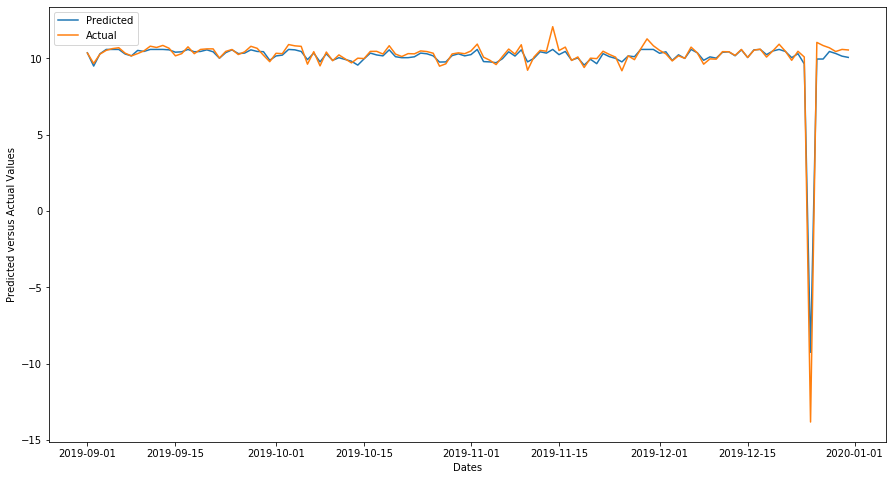

=====penticton=====
RMSE loss for penticton = 0.448


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



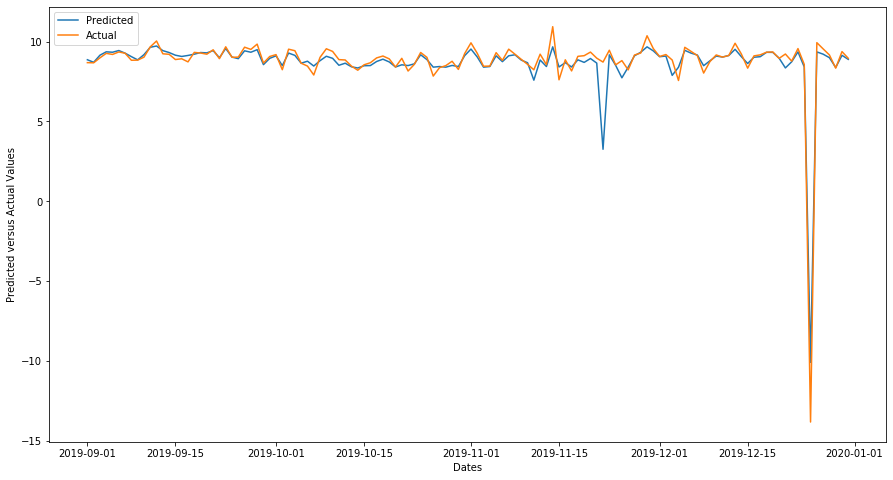

=====port alberni=====
RMSE loss for port alberni = 0.095


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



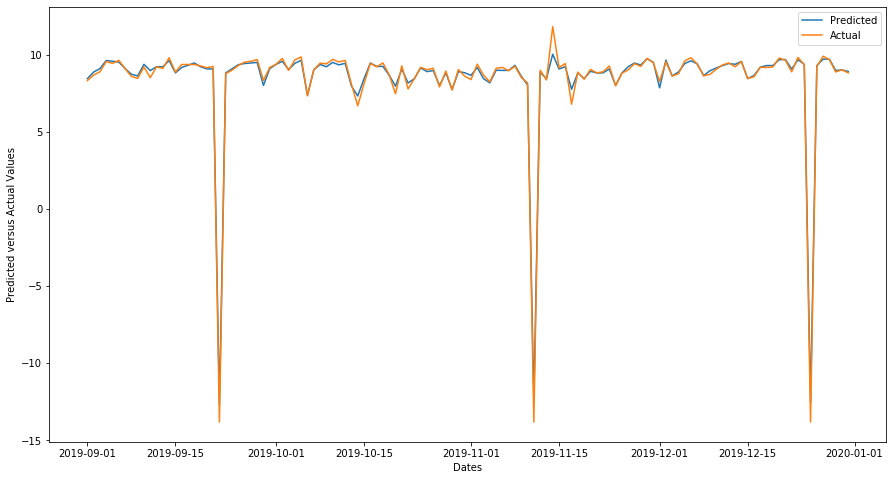

=====quesnel=====
RMSE loss for quesnel = 0.113


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



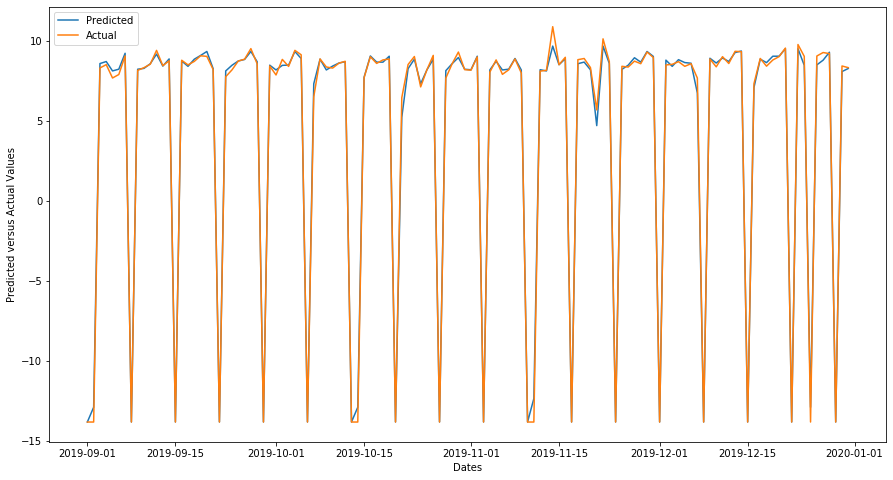

=====salmon arm=====
RMSE loss for salmon arm = 0.407


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



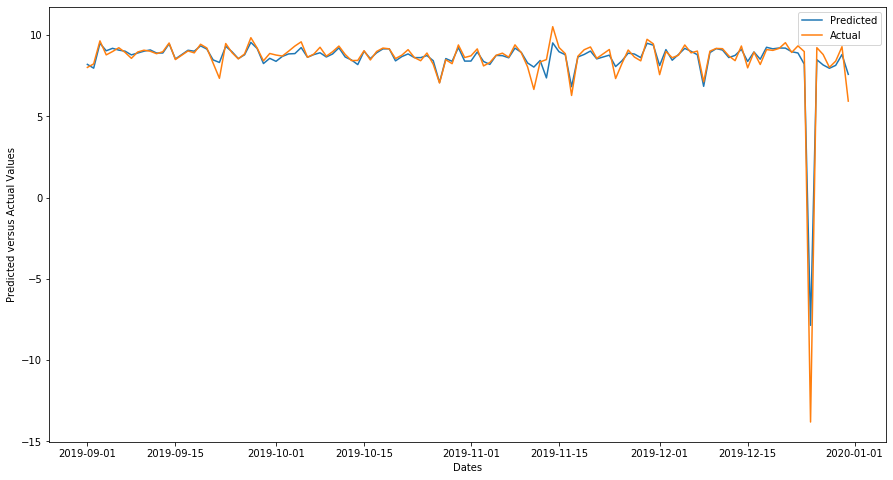

=====trail=====
RMSE loss for trail = 0.083


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



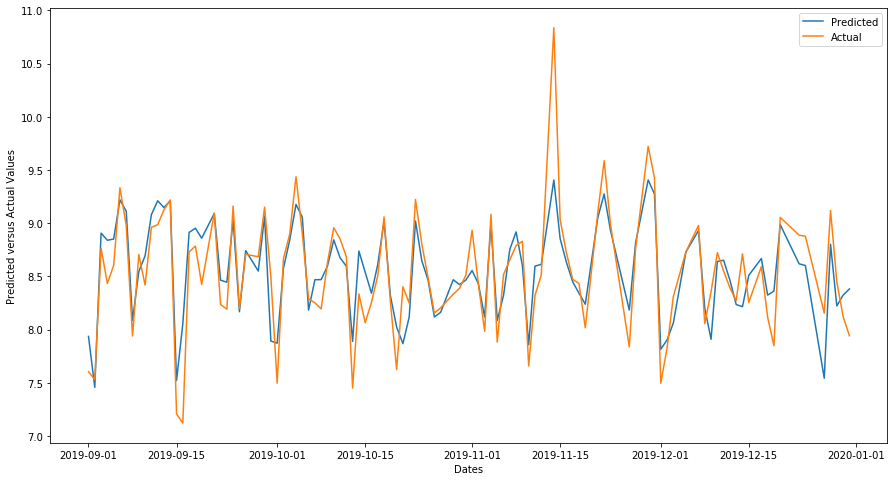

=====vernon=====
RMSE loss for vernon = 0.052


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



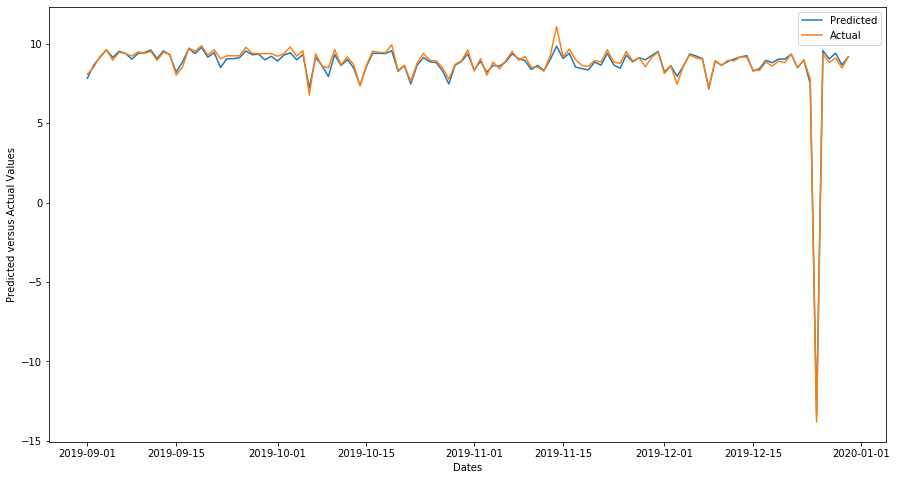

=====white rock=====
RMSE loss for white rock = 0.130


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



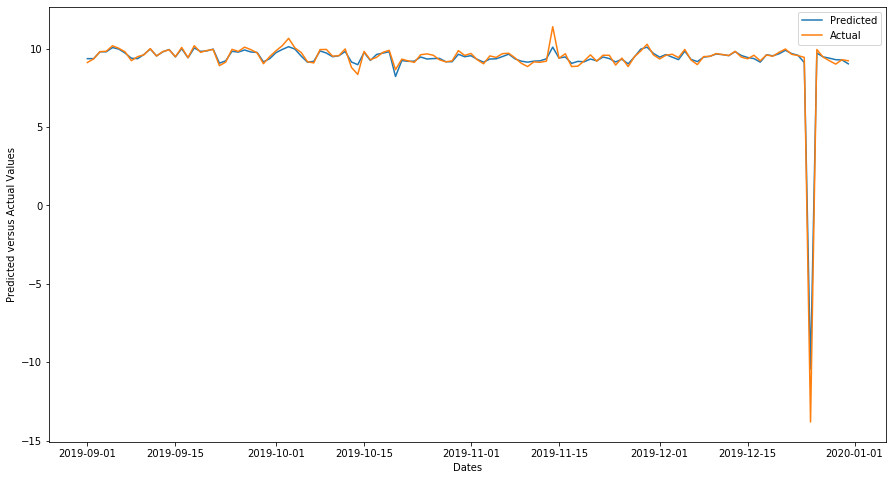

=====williams lake=====
RMSE loss for williams lake = 0.087


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



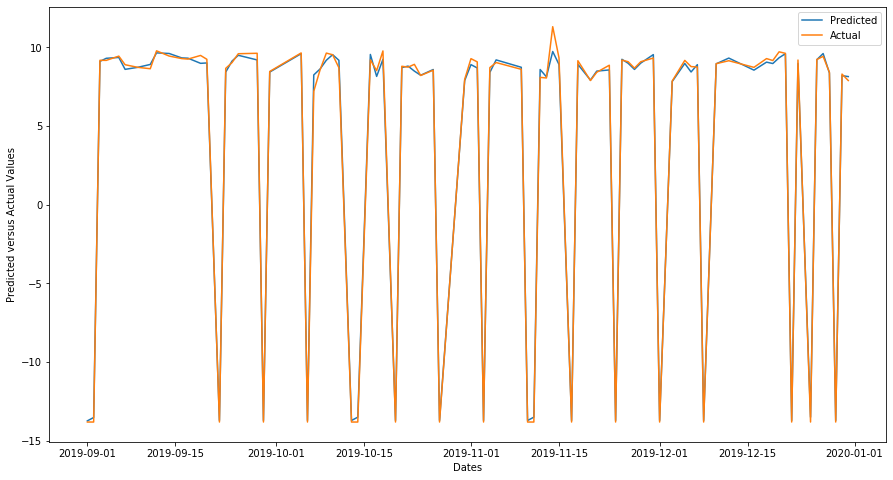

=====regina=====
RMSE loss for regina = 2.010


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



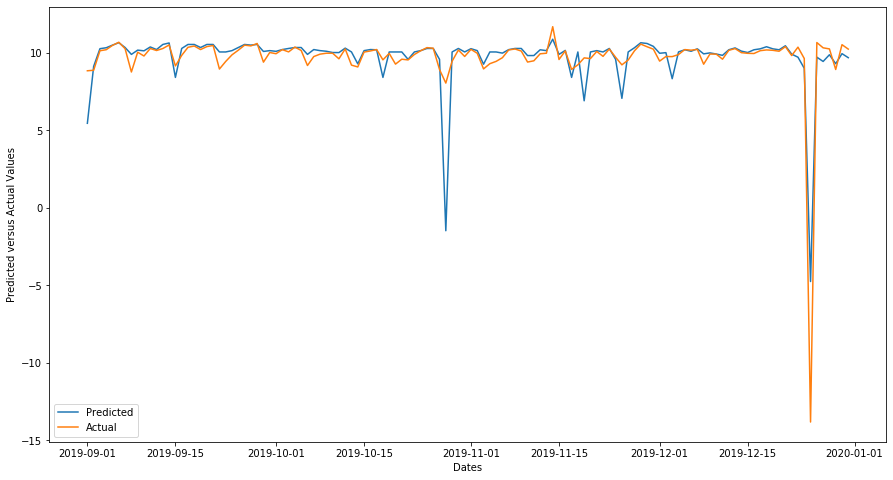

=====saskatoon=====
RMSE loss for saskatoon = 0.611


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



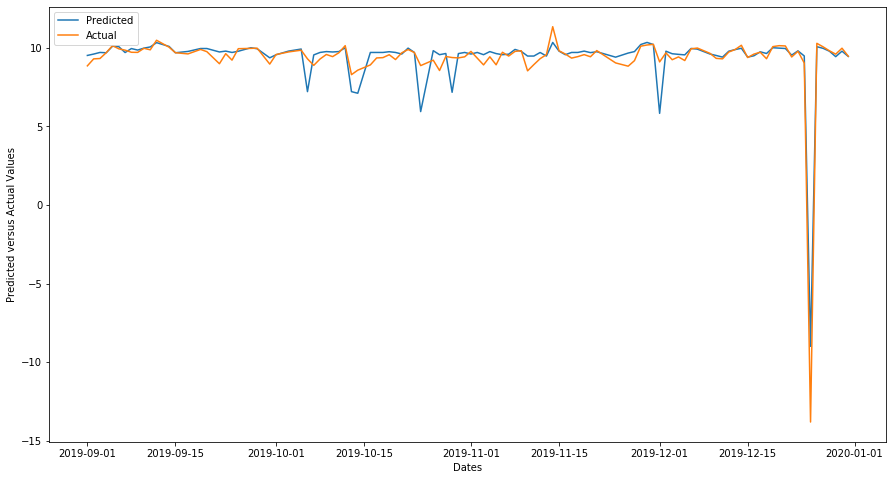

=====swift current=====
RMSE loss for swift current = 0.136


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



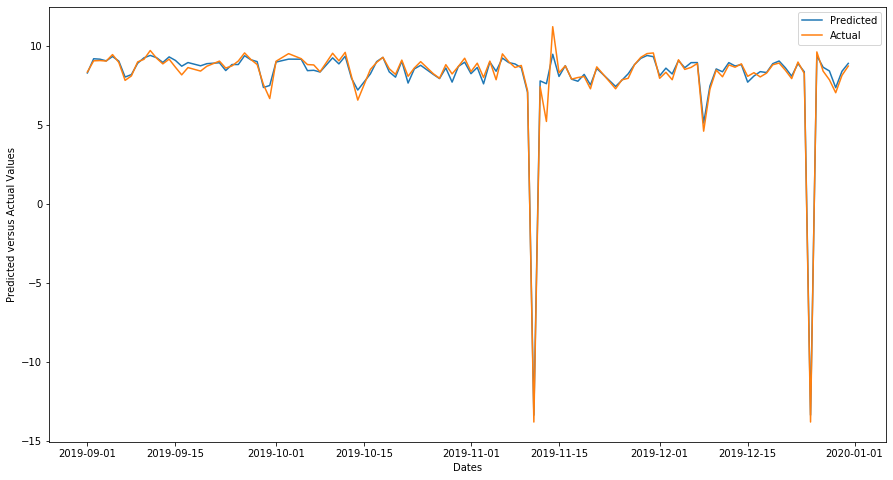

=====wainwright=====
RMSE loss for wainwright = 0.175


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



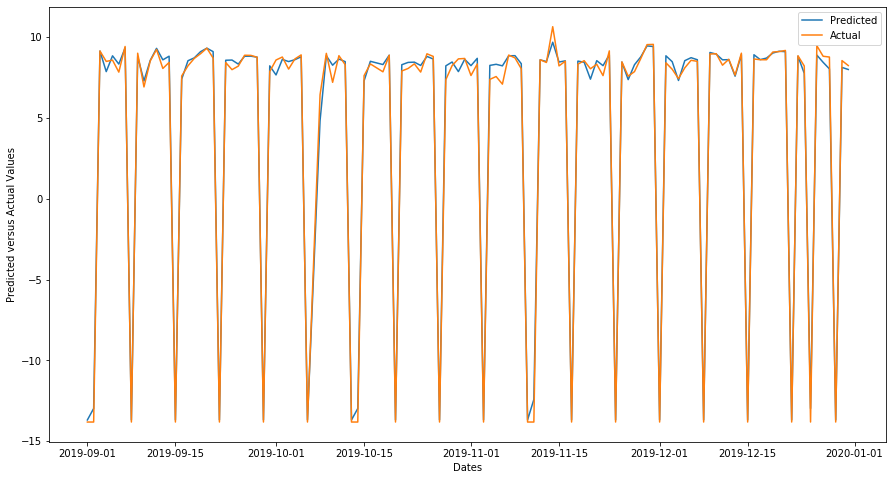

=====stettler=====
RMSE loss for stettler = 0.045


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



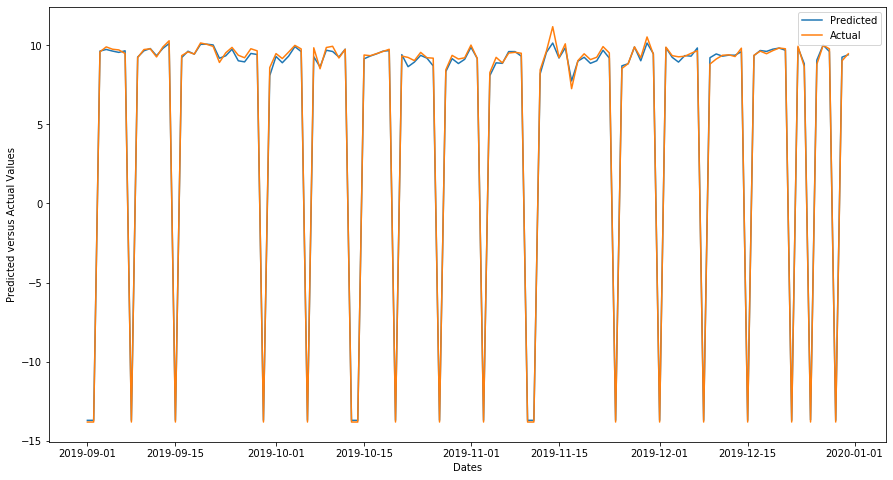

=====nelson=====
No records to test for nelson city
=====edmonton=====
RMSE loss for edmonton = 0.690


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



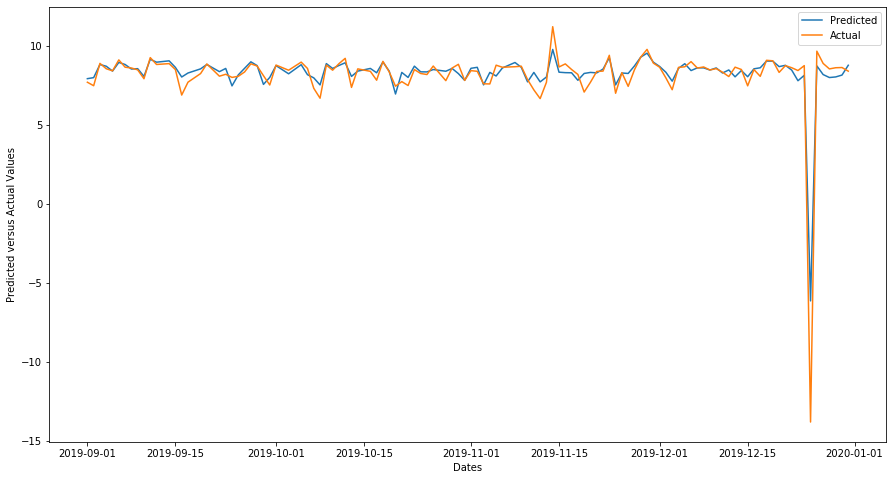

=====olds=====
RMSE loss for olds = 0.144


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



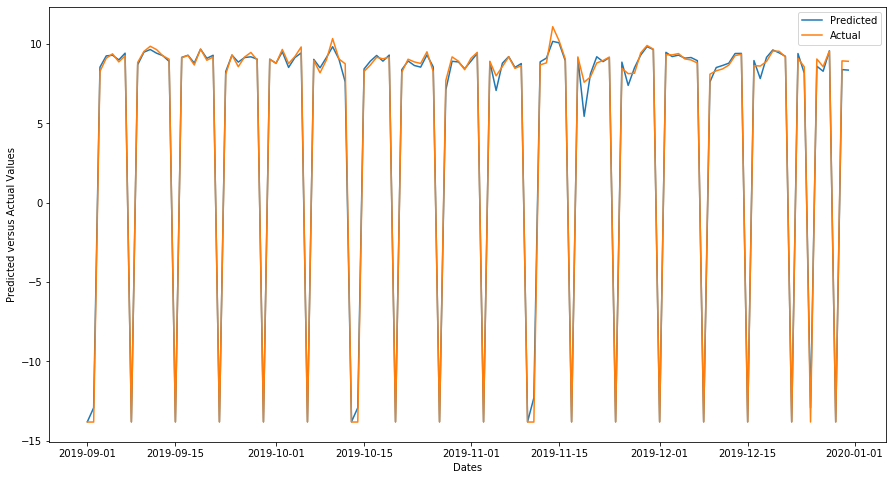

=====red deer=====
RMSE loss for red deer = 7.950


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



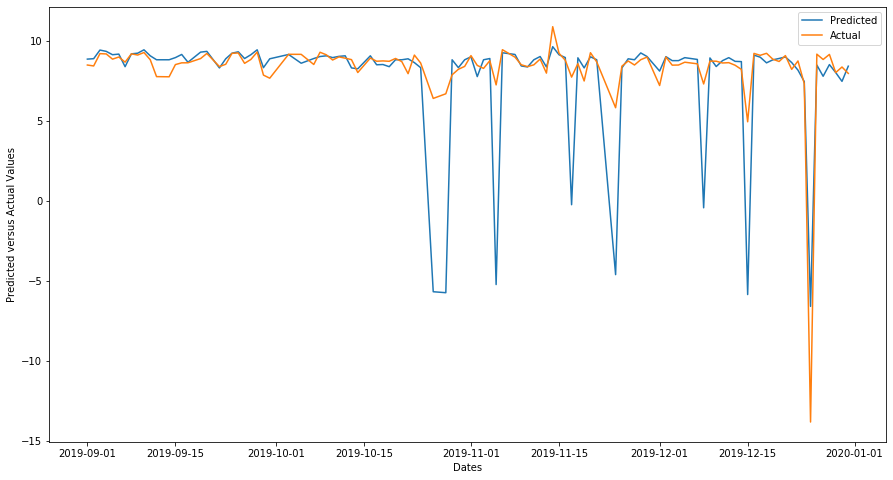

=====camrose=====
RMSE loss for camrose = 0.034


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



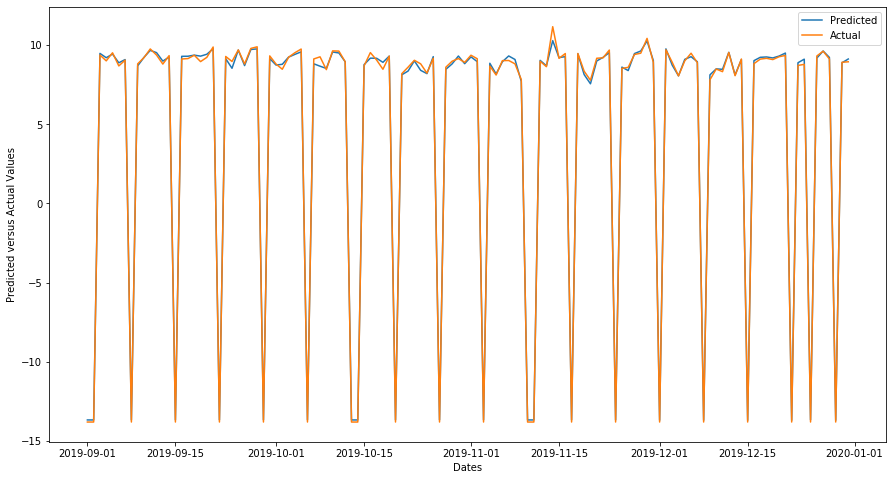

=====lethbridge=====
RMSE loss for lethbridge = 0.169


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



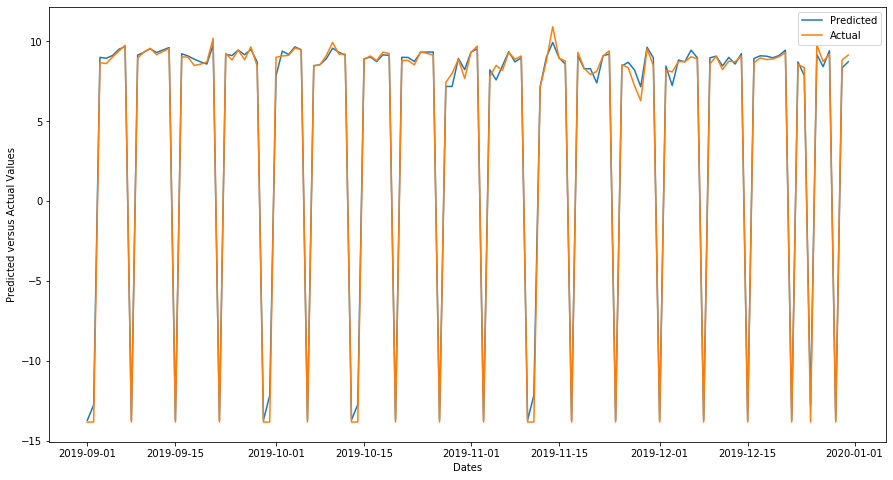

=====terrace=====
RMSE loss for terrace = 1.399


/home/mrizzlybear/.local/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



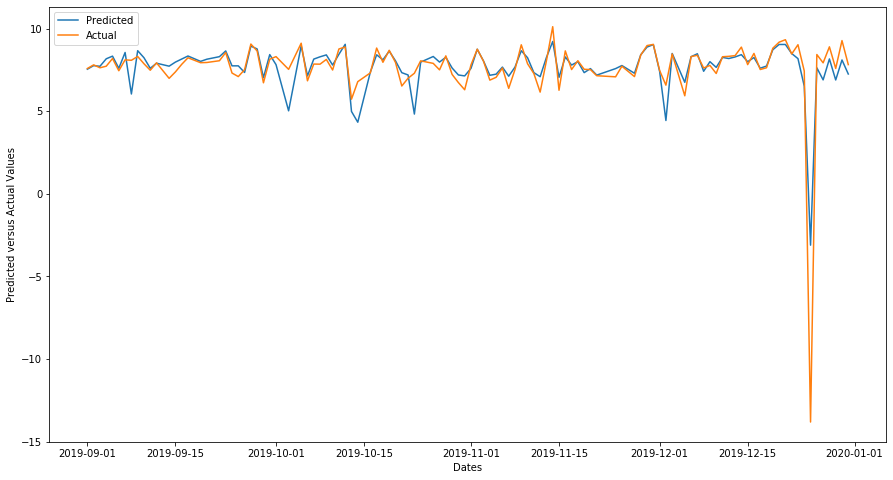

In [100]:
LGBM_W = sales_modeling(tr_data,te_data,'lgbm',True)

=====medicine hat=====
[06:45:18] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for medicine hat = 0.027


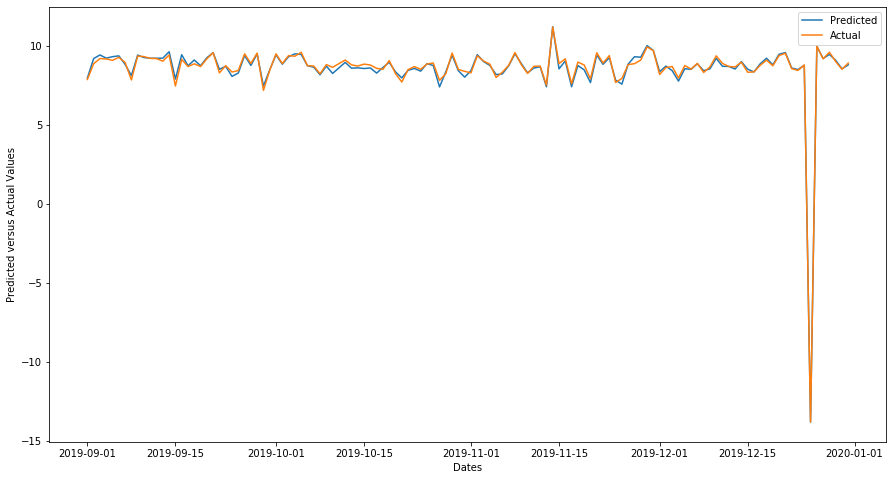

=====yorkton=====
[06:45:30] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for yorkton = 0.139


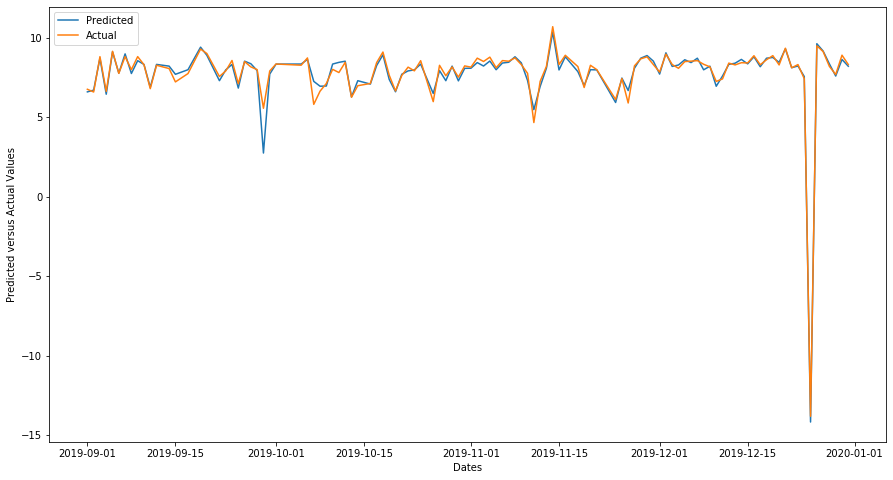

=====cranbrook=====
[06:45:42] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for cranbrook = 0.066


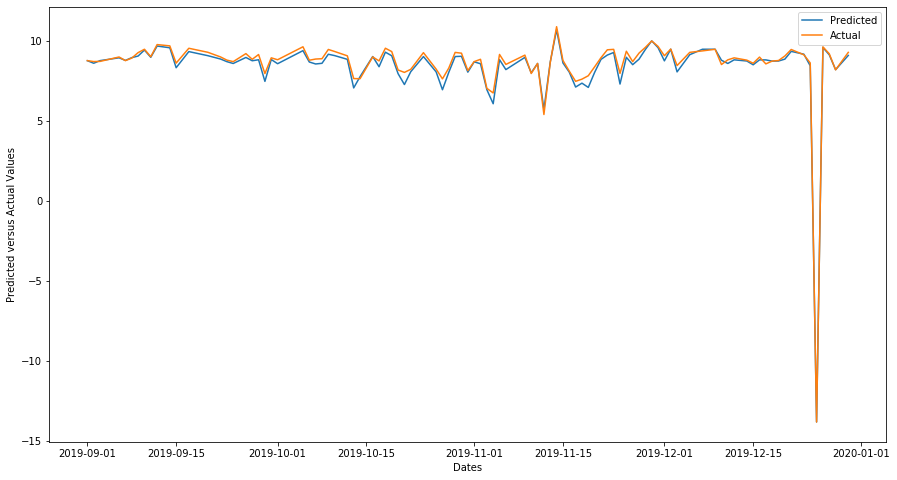

=====fort st john=====
[06:45:55] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for fort st john = 0.161


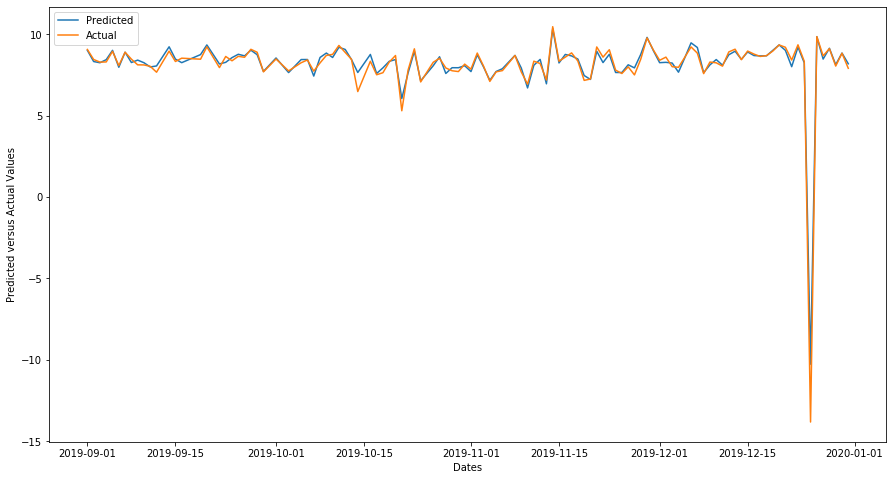

=====kamloops=====
[06:46:12] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kamloops = 0.020


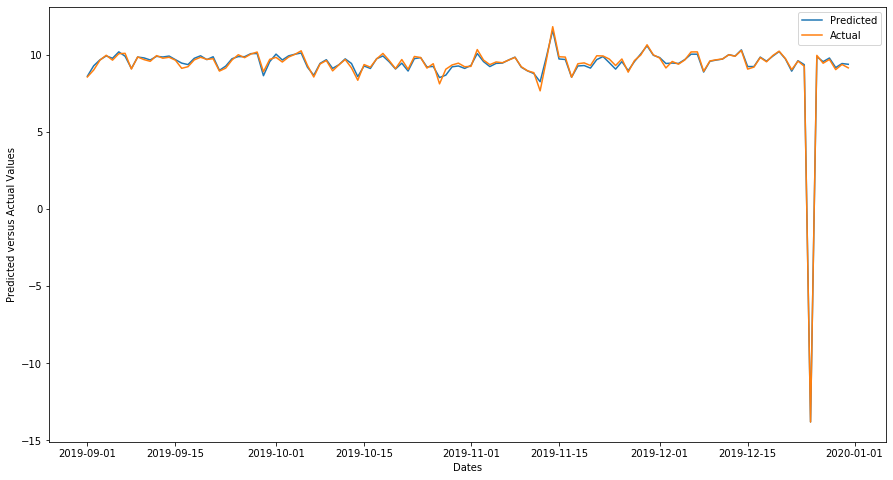

=====kelowna=====
[06:46:29] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kelowna = 0.017


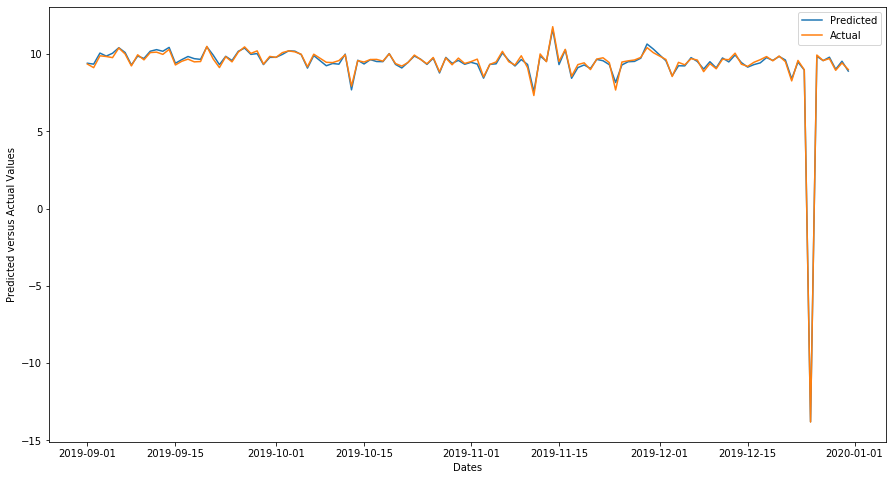

=====calgary=====
[06:46:47] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for calgary = 0.011


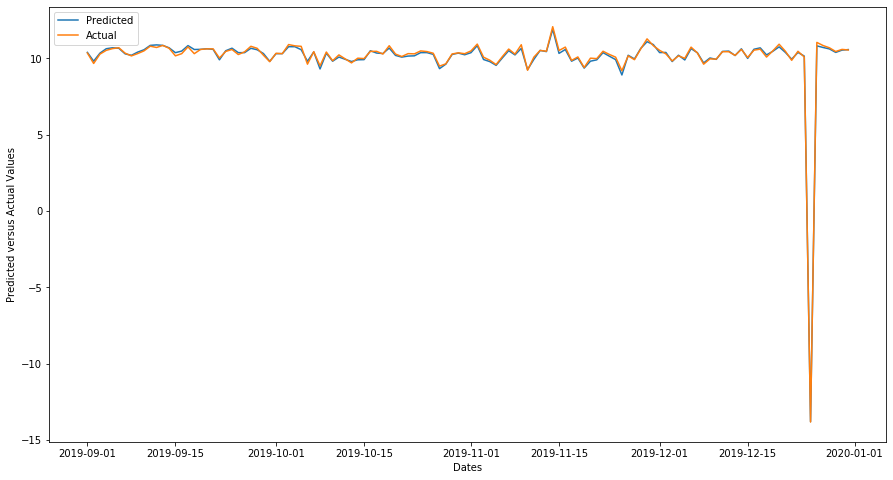

=====penticton=====
[06:47:04] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for penticton = 0.027


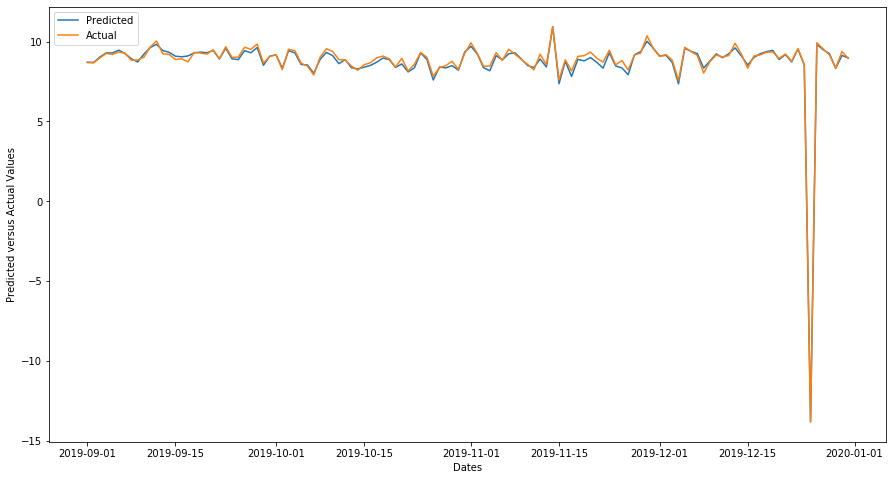

=====port alberni=====
[06:47:21] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for port alberni = 2.373


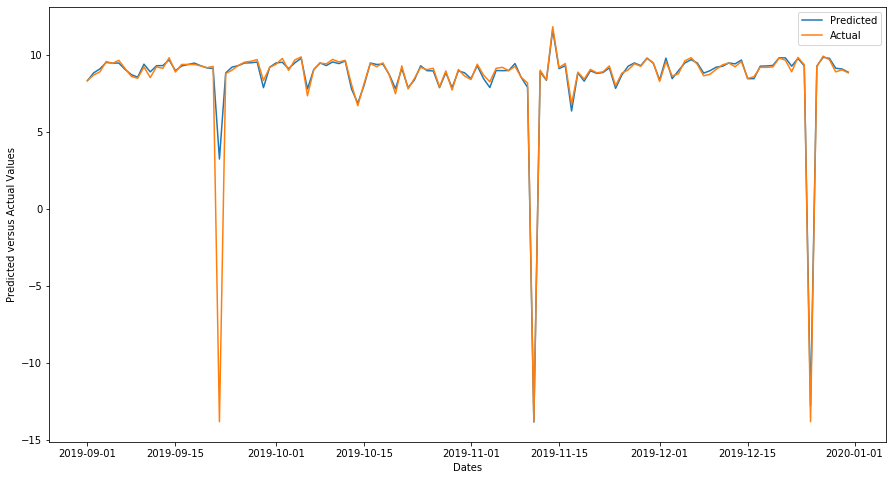

=====quesnel=====
[06:47:35] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for quesnel = 0.024


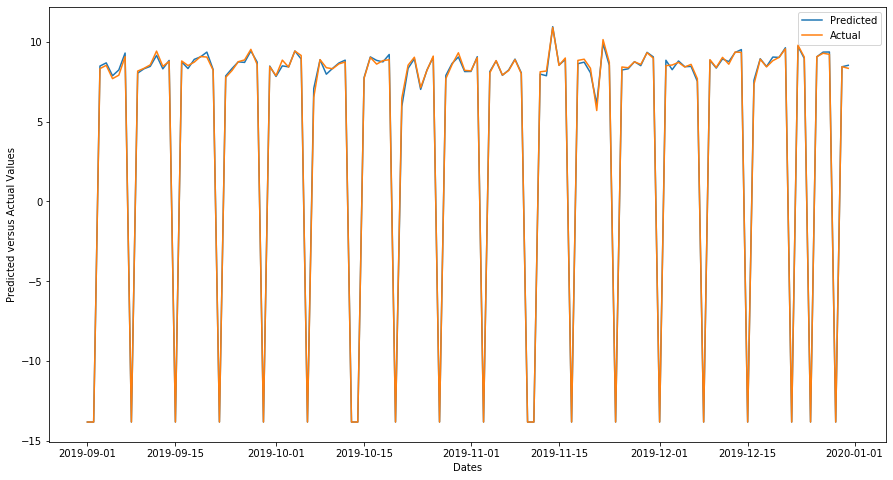

=====salmon arm=====
[06:47:51] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for salmon arm = 0.040


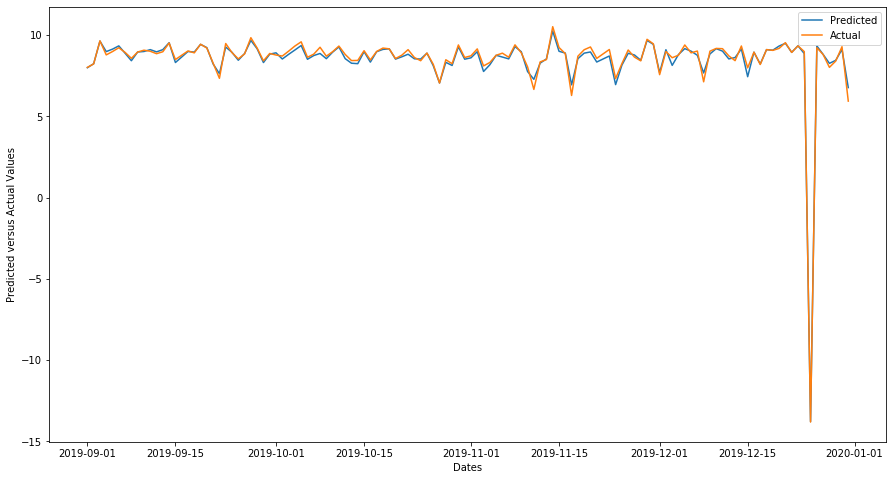

=====trail=====
[06:48:08] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for trail = 0.038


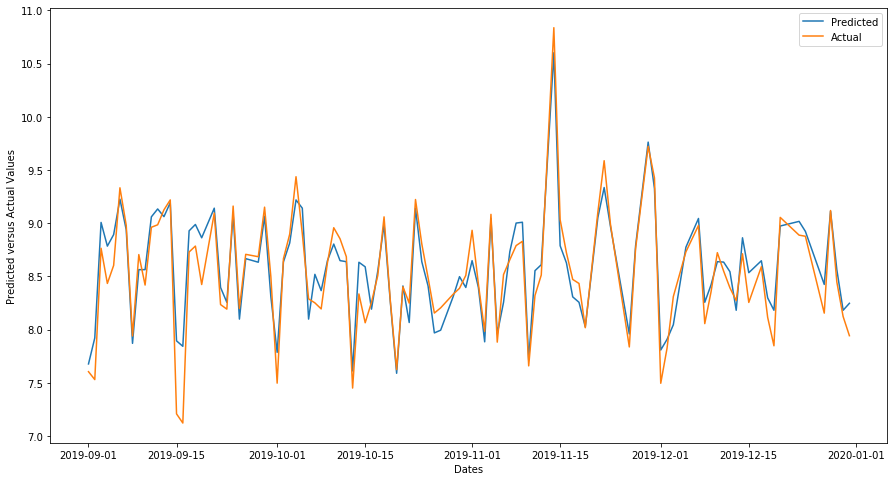

=====vernon=====
[06:48:25] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for vernon = 0.028


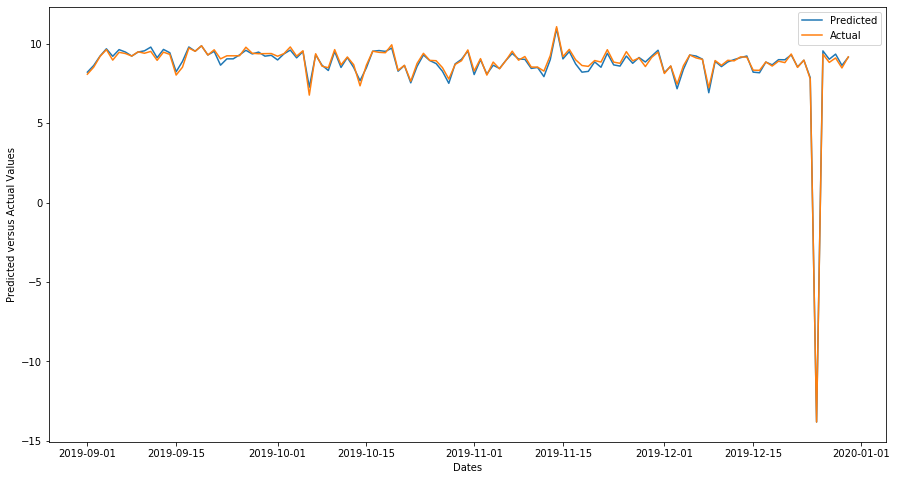

=====white rock=====
[06:48:42] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for white rock = 0.017


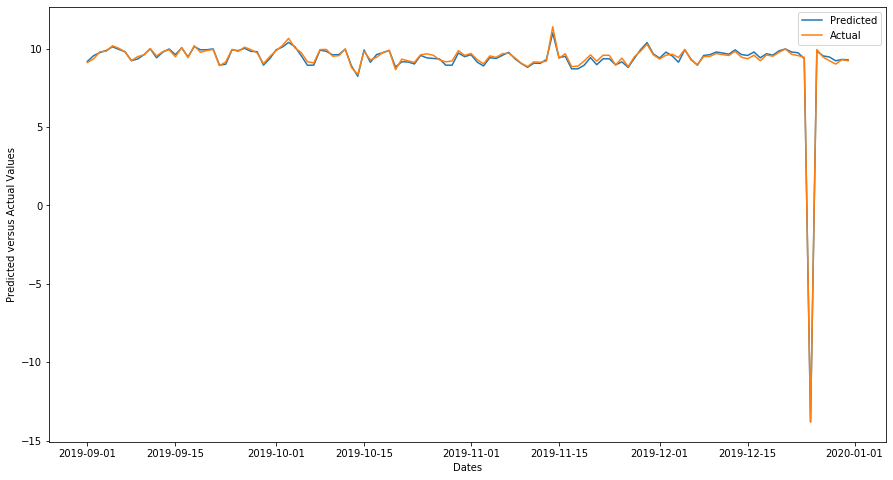

=====williams lake=====
[06:48:53] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for williams lake = 0.024


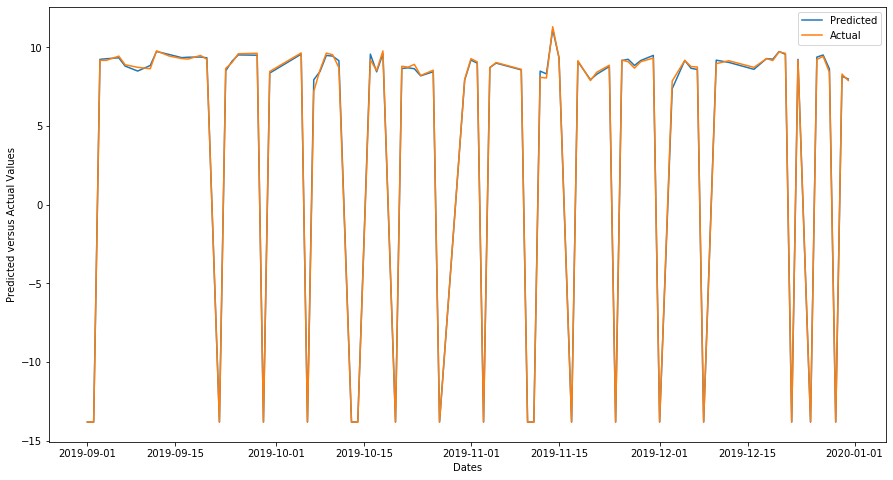

=====regina=====
[06:49:10] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for regina = 0.016


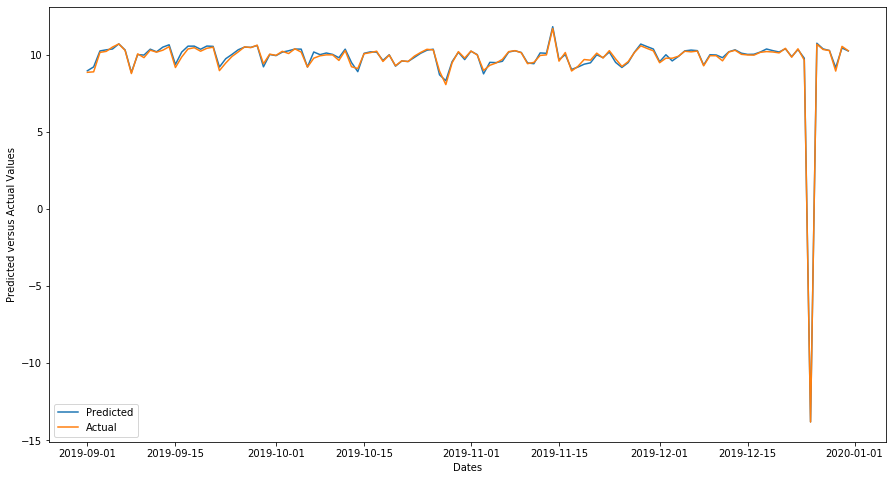

=====saskatoon=====
[06:49:23] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for saskatoon = 0.018


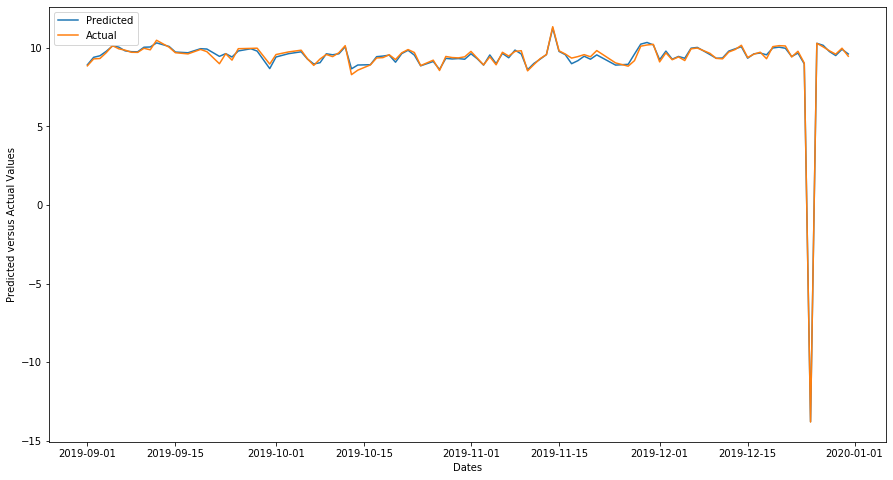

=====swift current=====
[06:49:35] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for swift current = 0.081


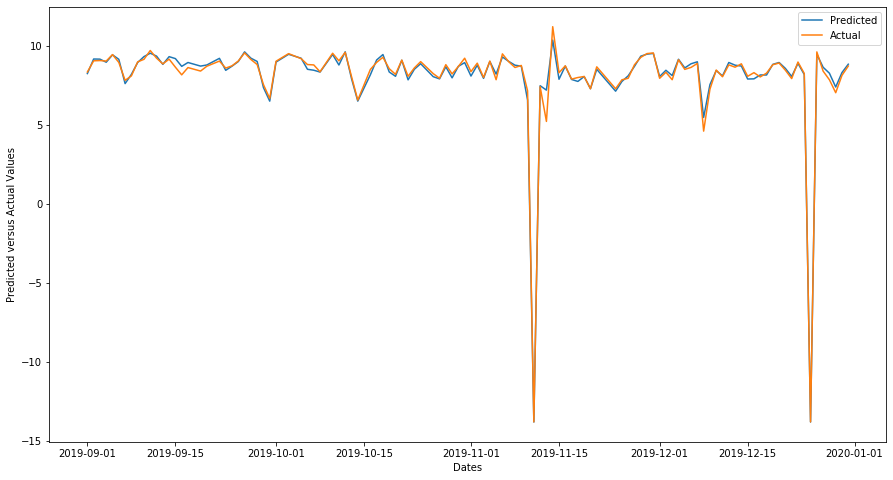

=====wainwright=====
[06:49:50] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for wainwright = 0.061


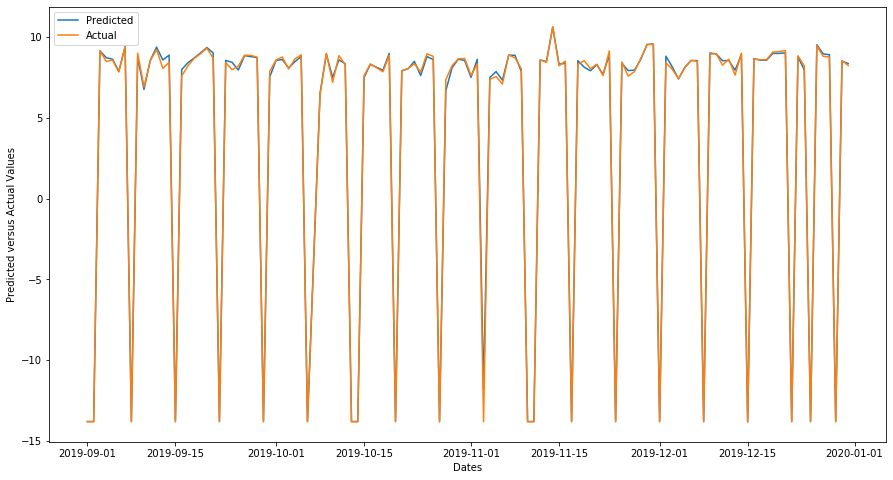

=====stettler=====
[06:50:05] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for stettler = 0.026


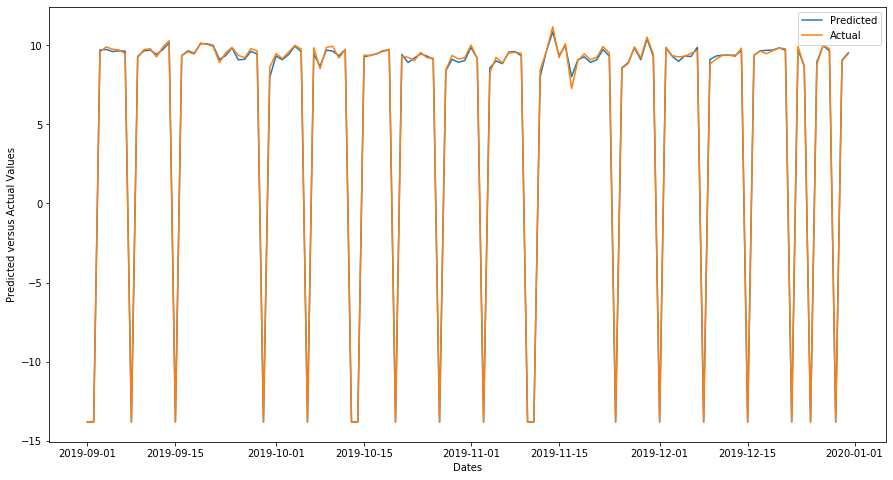

=====nelson=====
No records to test for nelson city
=====edmonton=====
[06:50:18] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for edmonton = 0.051


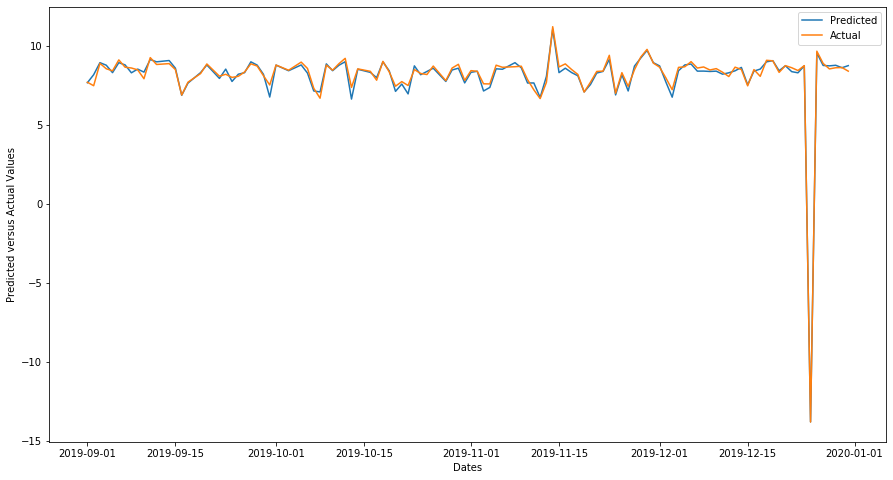

=====olds=====
[06:50:33] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for olds = 0.022


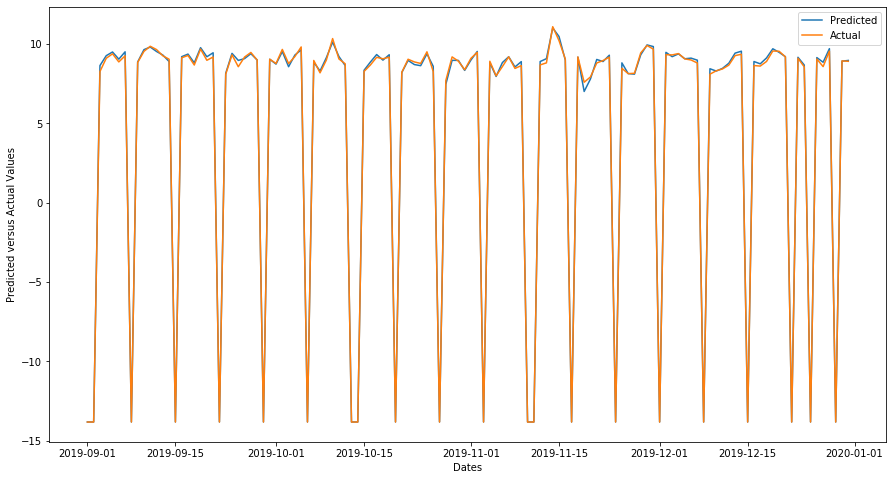

=====red deer=====
[06:50:45] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for red deer = 0.092


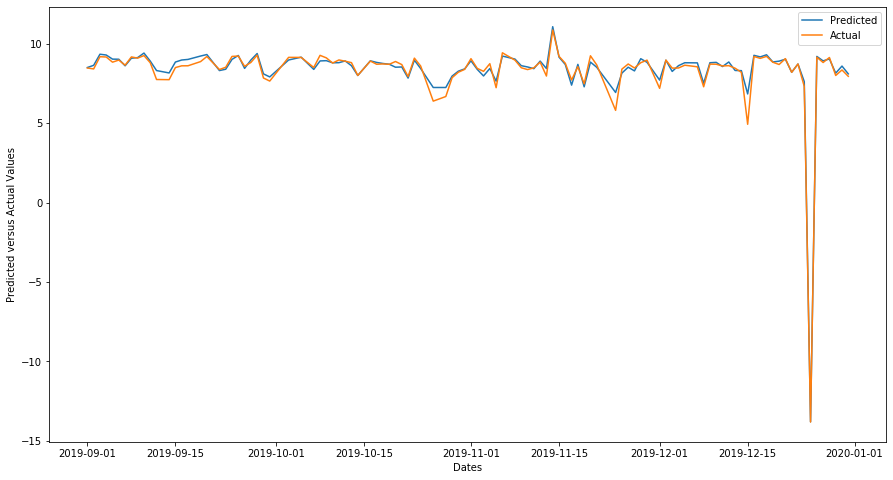

=====camrose=====
[06:51:01] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for camrose = 0.018


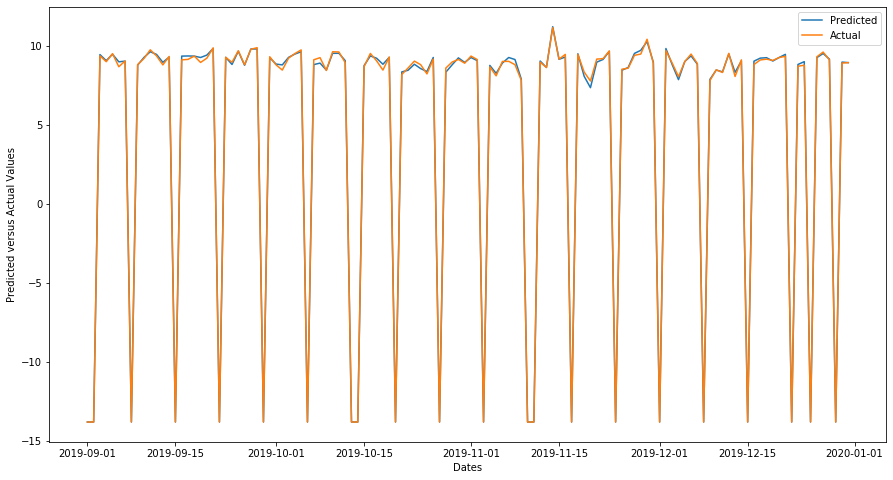

=====lethbridge=====
[06:51:15] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for lethbridge = 1.008


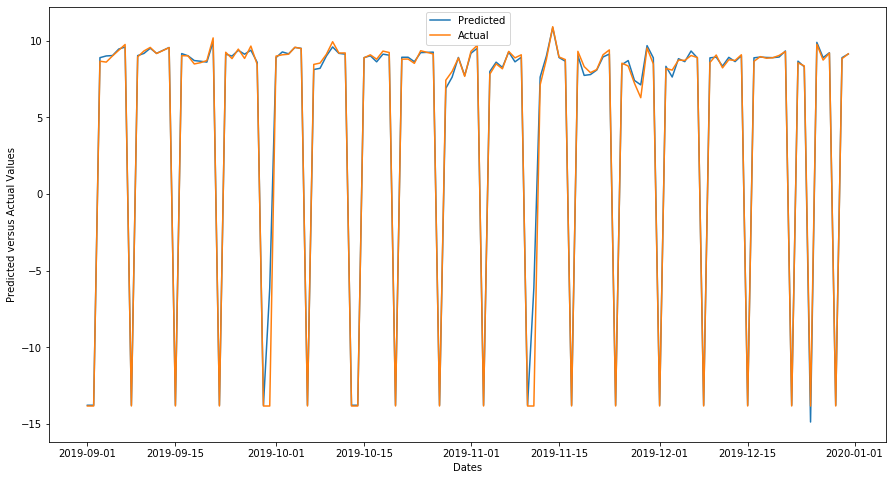

=====terrace=====
[06:51:27] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for terrace = 0.085


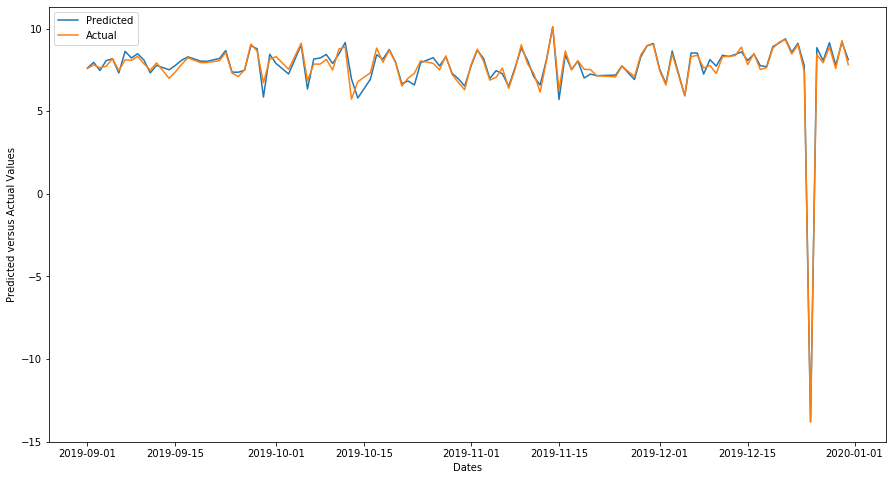

In [101]:
ST_W = sales_modeling(tr_data,te_data,'st',True)

# Performance for Sales with weather!

### For XGBoost:

In [102]:
columns=['RMSE_xgb_w','MAE_xgb_w','R2_xgb_w','city','time_xgb_w']
df_xgb_w= pd.DataFrame(XGB_W,columns=columns)

In [103]:
# City Wise:
df_xgb_w

,RMSE_xgb_w,MAE_xgb_w,R2_xgb_w,city,time_xgb_w
0,0.025787,0.123409,0.994175,medicine hat,0.17
1,1.343506,0.393725,0.730627,yorkton,0.49
2,0.273085,0.285415,0.950634,cranbrook,0.79
3,1.395855,0.980634,0.705075,fort st john,1.11
4,0.035226,0.114883,0.992348,kamloops,1.46
5,0.027817,0.110880,0.994081,kelowna,1.81
6,0.010057,0.072488,0.997921,calgary,2.15
7,0.049452,0.146666,0.988761,penticton,2.49
8,0.241353,0.173518,0.981002,port alberni,2.84
9,0.936548,0.568307,0.988380,quesnel,3.20


In [104]:
df_xgb_w[['RMSE_xgb_w','MAE_xgb_w','R2_xgb_w','time_xgb_w']].mean()

RMSE_xgb_w    0.212334
MAE_xgb_w     0.216561
R2_xgb_w      0.964765
time_xgb_w    4.500769
dtype: float64

### For LightGBM:

In [105]:
columns=['RMSE_lgbm_w','MAE_lgbm_w','R2_lgbm_w','city','time_lgbm_w']
df_lgbm_w= pd.DataFrame(LGBM_W,columns=columns)

In [106]:
#City Wise:
df_lgbm_w

,RMSE_lgbm_w,MAE_lgbm_w,R2_lgbm_w,city,time_lgbm_w
0,0.063335,0.178149,0.985694,medicine hat,0.04
1,2.612753,0.511912,0.476143,yorkton,0.27
2,0.260922,0.289511,0.952832,cranbrook,0.50
3,0.191102,0.238838,0.959623,fort st john,0.73
4,0.256535,0.243780,0.944277,kamloops,0.95
5,0.180539,0.179053,0.961586,kelowna,1.18
6,0.242049,0.215696,0.949962,calgary,1.41
7,0.448008,0.290092,0.898177,penticton,1.65
8,0.094907,0.170450,0.992530,port alberni,1.88
9,0.113084,0.193708,0.998597,quesnel,2.12


In [107]:
df_lgbm_w[['RMSE_lgbm_w','MAE_lgbm_w','R2_lgbm_w','time_lgbm_w']].mean()

RMSE_lgbm_w    0.714869
MAE_lgbm_w     0.295242
R2_lgbm_w      0.851564
time_lgbm_w    3.022692
dtype: float64

### For Stacking:

In [108]:
columns=['RMSE_st_w','MAE_st_w','R2_st_w','city','time_st_w']
df_st_w= pd.DataFrame(ST_W,columns=columns)

In [109]:
#City Wise:
df_st_w

,RMSE_st_w,MAE_st_w,R2_st_w,city,time_st_w
0,0.027197,0.129731,0.993857,medicine hat,15.80
1,0.139385,0.210908,0.972053,yorkton,27.79
2,0.065585,0.192955,0.988144,cranbrook,39.27
3,0.160975,0.197161,0.965988,fort st john,52.16
4,0.020266,0.106527,0.995598,kamloops,69.47
5,0.017101,0.104317,0.996361,kelowna,86.50
6,0.011153,0.086292,0.997694,calgary,104.59
7,0.026856,0.127937,0.993896,penticton,121.90
8,2.373255,0.264280,0.813194,port alberni,138.87
9,0.024487,0.104641,0.999696,quesnel,152.53


In [110]:
df_st_w[['RMSE_st_w','MAE_st_w','R2_st_w','time_st_w']].mean()

RMSE_st_w      0.172783
MAE_st_w       0.146448
R2_st_w        0.980879
time_st_w    203.566154
dtype: float64